# Comparing GMM Classification Across Redshift Estimates

Compares classification performance using three sets of light curve fits:
- **Spectroscopic** (perfect) redshifts
- **Photometric** (approximate) redshifts
- **No** redshift information

In [55]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy import stats
from scipy.stats import norm
from sklearn.mixture import GaussianMixture
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from astropy.stats import sigma_clip
from scipy.stats import entropy, multivariate_normal
from sklearn.cluster import KMeans
from collections import defaultdict

rng = np.random.default_rng()

In [2]:
class real_SN:
    ia_keys = ['z', 't0', 'x0', 'x1', 'c']
    ibc_keys = ['z', 'texp', 'mej', 'fni', 'vej']
    ia_fit = {key:None for key in ia_keys}
    ibc_fit = {key:None for key in ibc_keys}
    
    def __init__(self, true_class, true_redshift):
        self.true_class = true_class
        self.true_redshift = true_redshift
            
    def fit_as_ia(self, results_dict):
        self.ia_fit = {key:results_dict[key] for key in self.ia_keys[1:]}
    
    def fit_as_ibc(self, results_dict):
        self.ibc_fit = {key:results_dict[key] for key in self.ibc_keys[1:]}


class SN:
    ia_keys = ['z', 't0', 'x0', 'x1', 'c', 'log_x0', 'log_x1', 'log_ia_chisq', 
               'log_x0_err_ratio', 'log_x1_err_ratio', 'log_c_err_ratio']
    ibc_keys = ['z', 'texp', 'mej', 'fni', 'vej', 'log_vej', 'log_fni', 'log_mej',
                 'log_ibc_chisq', 'log_mej_err_ratio', 'log_vej_err_ratio', 'log_fni_err_ratio']
    ia_fit = {key:None for key in ia_keys}
    ibc_fit = {key:None for key in ibc_keys}
    
    def __init__(self, true_class, true_dict):
        self.true_class = true_class
        if self.true_class == 'ia':
            self.true_params = {key:true_dict[key] for key in self.ia_keys}
        elif self.true_class == 'ibc':
            self.true_params = {key:true_dict[key] for key in self.ibc_keys}
        else:
            raise ValueError("SN has to be either ia or ibc")
            
    def fit_as_ia(self, results_dict):
        self.ia_fit = {key:results_dict[key] for key in self.ia_keys[1:]}
    
    def fit_as_ibc(self, results_dict):
        self.ibc_fit = {key:results_dict[key] for key in self.ibc_keys[1:]}
        self.ibc_fit.update({'log_vej': np.log10(self.ibc_fit['vej'])})

## Load data

In [3]:
# Load the three datasets
data_spec = np.load("fitted_sne_real_050126_spec.npz", allow_pickle=True)
data_phot = np.load("fitted_sne_real_050126_phot.npz", allow_pickle=True)
data_none = np.load("fitted_sne_real_050126_none.npz", allow_pickle=True)

datasets = {
    'spec': {'label': 'Spectroscopic z', 'color': 'blue', 'data': data_spec},
    'phot': {'label': 'Photometric z', 'color': 'orange', 'data': data_phot},
    'none': {'label': 'No z', 'color': 'green', 'data': data_none},
}

for key, ds in datasets.items():
    ds['true_ia_sne'] = ds['data']['ia']
    ds['true_ibc_sne'] = ds['data']['ibc']
    ds['all_sne'] = np.concatenate((ds['true_ia_sne'], ds['true_ibc_sne']))
    print(f"{ds['label']}: {len(ds['true_ia_sne'])} Ia, {len(ds['true_ibc_sne'])} Ibc, {len(ds['all_sne'])} total")

Spectroscopic z: 2430 Ia, 193 Ibc, 2623 total
Photometric z: 2416 Ia, 193 Ibc, 2609 total
No z: 2423 Ia, 192 Ibc, 2615 total


In [4]:
# Compute derived parameters for all datasets
def compute_derived_params(sne):
    for sn in sne:
        sn.ibc_fit.update({'log_vej': np.log10(sn.ibc_fit['vej'])})
        sn.ibc_fit.update({'log_mej': np.log10(sn.ibc_fit['mej'])})
        sn.ia_fit.update({'log_x0': np.log10(sn.ia_fit['x0'])})
        sn.ia_fit.update({'log_x1': np.log10(sn.ia_fit['x1'] + 5)})
        sn.ibc_fit.update({'log_fni': np.log10(sn.ibc_fit['fni'])})
        sn.ibc_fit.update({'log_ibc_chisq': np.log10(sn.ibc_fit['chisq'])})
        sn.ia_fit.update({'log_ia_chisq': np.log10(sn.ia_fit['chisq'])})
        sn.ia_fit.update({'log_x0_err_ratio': np.log10(np.abs(sn.ia_fit['x0_err'])) - np.log10(sn.ia_fit['x0'])})
        sn.ia_fit.update({'log_x1_err_ratio': np.log10(np.abs(sn.ia_fit['x1_err'])) - np.log10(np.abs(sn.ia_fit['x1']))})
        sn.ia_fit.update({'log_c_err_ratio': np.log10(np.abs(sn.ia_fit['c_err'])) - np.log10(np.abs(sn.ia_fit['c']))})
        sn.ibc_fit.update({'log_mej_err_ratio': np.log10(np.abs(sn.ibc_fit['mej_err'])) - np.log10(sn.ibc_fit['mej'])})
        sn.ibc_fit.update({'log_fni_err_ratio': np.log10(np.abs(sn.ibc_fit['fni_err'])) - np.log10(sn.ibc_fit['fni'])})
        sn.ibc_fit.update({'log_vej_err_ratio': np.log10(np.abs(sn.ibc_fit['vej_err'])) - np.log10(sn.ibc_fit['vej'])})
        sn.ibc_fit.update({'z': sn.ibc_fit['redshift']})
        sn.ibc_fit.update({'z_err': sn.ibc_fit['redshift_err']})

for key, ds in datasets.items():
    compute_derived_params(ds['all_sne'])
    print(f"Computed derived params for {ds['label']}")

Computed derived params for Spectroscopic z
Computed derived params for Photometric z
Computed derived params for No z


/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_71429/2928238018.py:14: RuntimeWarning: divide by zero encountered in log10
  sn.ibc_fit.update({'log_mej_err_ratio': np.log10(np.abs(sn.ibc_fit['mej_err'])) - np.log10(sn.ibc_fit['mej'])})
/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_71429/2928238018.py:15: RuntimeWarning: divide by zero encountered in log10
  sn.ibc_fit.update({'log_fni_err_ratio': np.log10(np.abs(sn.ibc_fit['fni_err'])) - np.log10(sn.ibc_fit['fni'])})
/var/folders/0r/_1bnthz146q2xj0c42f4nl_80000gq/T/ipykernel_71429/2928238018.py:16: RuntimeWarning: divide by zero encountered in log10
  sn.ibc_fit.update({'log_vej_err_ratio': np.log10(np.abs(sn.ibc_fit['vej_err'])) - np.log10(sn.ibc_fit['vej'])})


## Setup: parameters, helper functions

In [5]:
ia_param_names = SN.ia_keys
ibc_param_names = SN.ibc_keys[1:]

params_to_use = ['log_fni', 'log_vej']

param_labels = {
    'z': r'z',
    't0': r'Ia fit: $t_0$ (days)',
    'log_x0': r'Ia fit: $\log_{10}(x_0)$',
    'log_x1': r'Ia fit: $\log_{10}(x_1 + 5)$',
    'x1': r'Ia fit: $x_1$',
    'c': r'Ia fit: $c$',
    'texp': r'Ibc fit: $t_{exp}$ (days)',
    'mej': r'Ibc fit: $M_{ej}$ ($M_\odot$)',
    'log_fni': r'Ibc fit: $\log_{10}(f_{Ni})$',
    'fni': r'Ibc fit: $f_{Ni}$',
    'log_vej': r'Ibc fit: $\log_{10}(v_{ej})$',
    'log_mej': r'Ibc fit: $\log_{10}(M_{ej})$',
    'log_ia_chisq': r'Ia fit: $\log_{10}(\chi^2)$',
    'log_ibc_chisq': r'Ibc fit: $\log_{10}(\chi^2)$',
    'log_mej_err_ratio': r'Ibc fit: $\log_{10}(M_{ej}\ \mathrm{err\ ratio})$',
    'log_vej_err_ratio': r'Ibc fit: $\log_{10}(v_{ej}\ \mathrm{err\ ratio})$',
    'log_fni_err_ratio': r'Ibc fit: $\log_{10}(f_{Ni}\ \mathrm{err\ ratio})$',
    'log_x0_err_ratio': r'Ia fit: $\log_{10}(x_0\ \mathrm{err\ ratio})$',
    'log_x1_err_ratio': r'Ia fit: $\log_{10}(x_1\ \mathrm{err\ ratio})$',
    'log_c_err_ratio': r'Ia fit: $\log_{10}(c\ \mathrm{err\ ratio})$',
}

x_ranges = {
    'z': np.linspace(0, 1, 200),
    't0': np.linspace(-50, 100, 200),
    'log_x0': np.linspace(-6, 1, 200),
    'x1': np.linspace(-5, 50, 200),
    'c': np.linspace(-1, 2, 200),
    'texp': np.linspace(-20, 50, 200),
    'mej': np.linspace(-2, 20, 200),
    'log_fni': np.linspace(-3, 2, 200),
    'fni': np.linspace(0, 3, 200),
    'log_vej': np.linspace(3.5, 5, 200),
    'log_x1': np.linspace(-2, 2, 200),
    'log_mej': np.linspace(-1, 2, 200),
    'log_ia_chisq': np.linspace(-2, 4, 200),
    'log_ibc_chisq': np.linspace(-2, 4, 200),
    'log_mej_err_ratio': np.linspace(-2, 2, 200),
    'log_vej_err_ratio': np.linspace(-2, 2, 200),
    'log_fni_err_ratio': np.linspace(-2, 2, 200),
    'log_x0_err_ratio': np.linspace(-2, 2, 200),
    'log_x1_err_ratio': np.linspace(-2, 2, 200),
    'log_c_err_ratio': np.linspace(-2, 2, 200),
}

labelfontsize = 20
titlefontsize = 22
tickfontsize = 16

In [6]:
def get_param_samples(param_name, sn_sample):
    if param_name in ia_param_names:
        return np.array([sn.ia_fit[param_name] for sn in sn_sample])
    elif param_name in ibc_param_names:
        return np.array([sn.ibc_fit[param_name] for sn in sn_sample])
    else:
        raise ValueError(f"Parameter {param_name} not recognized in either Ia or Ibc SNe.")


def log_likelihood(x, samples, alpha):
    mu1, sigma1, mu2, sigma2 = x
    first_term = alpha * norm.pdf(samples, mu1, sigma1)
    second_term = (1 - alpha) * norm.pdf(samples, mu2, sigma2)
    return np.sum(np.log(first_term + second_term))

## GMM fitting and classification functions

In [7]:
def fit_gmm(sn_sample, initial_alpha=0.1, verbose=False, random_seed=None,
            entropy_lambda=0.0):

    mus_a = {}
    mus_b = {}
    sigmas_a = {}
    sigmas_b = {}

    # Initialize parameters via K-means
    for param_name in params_to_use:
        these_param_samples = get_param_samples(param_name, sn_sample)
        valid = np.isfinite(these_param_samples)
        X_valid = these_param_samples[valid]

        if random_seed is not None:
            km = KMeans(n_clusters=2, n_init=1, random_state=random_seed).fit(X_valid.reshape(-1, 1))
        else:
            km = KMeans(n_clusters=2, n_init=10, random_state=42).fit(X_valid.reshape(-1, 1))
        labels = km.labels_
        cluster0 = X_valid[labels == 0]
        cluster1 = X_valid[labels == 1]
        mus_a[param_name] = np.mean(cluster0)
        mus_b[param_name] = np.mean(cluster1)
        sigmas_a[param_name] = max(np.std(cluster0), 0.001)
        sigmas_b[param_name] = max(np.std(cluster1), 0.001)

    num_epochs = 200
    lls = np.zeros(num_epochs)
    alphas = np.zeros(num_epochs)
    alpha = initial_alpha
    gammas_a = defaultdict(list)
    gammas_b = defaultdict(list)

    sigma_clip_masks = {}
    for param_name in params_to_use:
        param_samples = get_param_samples(param_name, sn_sample)
        clipped = sigma_clip(param_samples, sigma=10, maxiters=3)
        sigma_clip_masks[param_name] = ~clipped.mask

    weights = {}
    for param_name in params_to_use:
        weights[param_name] = np.ones(len(sn_sample))

    for epoch in range(num_epochs):
        for param_name in params_to_use:
            param_samples = get_param_samples(param_name, sn_sample)
            mask = sigma_clip_masks[param_name]
            param_samples = param_samples[mask]
            these_weights = weights[param_name][mask]

            # E-step
            gammas_a[param_name] = alpha * norm.pdf(param_samples, mus_a[param_name], sigmas_a[param_name])
            gammas_b[param_name] = (1 - alpha) * norm.pdf(param_samples, mus_b[param_name], sigmas_b[param_name])
            gamma_total = (gammas_a[param_name] + gammas_b[param_name])
            gammas_a[param_name] /= gamma_total
            gammas_b[param_name] /= gamma_total

            # Entropy regularization
            if entropy_lambda > 0:
                ga = gammas_a[param_name]
                gb = gammas_b[param_name]
                entropy_grad = np.log(ga + 1e-10) - np.log(gb + 1e-10)
                ga_sharpened = ga * np.exp(entropy_lambda * entropy_grad)
                gb_sharpened = gb * np.exp(-entropy_lambda * entropy_grad)
                sharp_total = ga_sharpened + gb_sharpened
                gammas_a[param_name] = ga_sharpened / sharp_total
                gammas_b[param_name] = gb_sharpened / sharp_total

            # M-step
            mus_a[param_name] = np.sum(these_weights * gammas_a[param_name] * param_samples) / np.sum(these_weights * gammas_a[param_name])
            mus_b[param_name] = np.sum(these_weights * gammas_b[param_name] * param_samples) / np.sum(these_weights * gammas_b[param_name])
            sigmas_a[param_name] = np.sqrt(np.sum(these_weights * gammas_a[param_name] * (param_samples - mus_a[param_name])**2) / np.sum(these_weights * gammas_a[param_name]))
            sigmas_b[param_name] = np.sqrt(np.sum(these_weights * gammas_b[param_name] * (param_samples - mus_b[param_name])**2) / np.sum(these_weights * gammas_b[param_name]))

            if sigmas_a[param_name] < 0.001:
                sigmas_a[param_name] = 0.001
            if sigmas_b[param_name] < 0.001:
                sigmas_b[param_name] = 0.001

        alpha = np.mean(np.concatenate([gammas_a[param_name] for param_name in params_to_use]))
        alphas[epoch] = alpha
        if verbose:
            all_ga = np.concatenate([gammas_a[p] for p in params_to_use])
            all_gb = np.concatenate([gammas_b[p] for p in params_to_use])
            ent = -np.mean(all_ga * np.log(all_ga + 1e-10) + all_gb * np.log(all_gb + 1e-10))
            print(f"Epoch {epoch}: Alpha={alpha:.4f}, Entropy={ent:.4f}")

        for param_name in params_to_use:
            mask = sigma_clip_masks[param_name]
            lls[epoch] += log_likelihood([mus_a[param_name], sigmas_a[param_name], mus_b[param_name], sigmas_b[param_name]],
                                         get_param_samples(param_name, sn_sample)[mask], alpha)

    fit_params = mus_a, mus_b, sigmas_a, sigmas_b

    # Recompute gammas on ALL samples
    for param_name in params_to_use:
        param_samples = get_param_samples(param_name, sn_sample)
        gammas_a[param_name] = alpha * norm.pdf(param_samples, mus_a[param_name], sigmas_a[param_name])
        gammas_b[param_name] = (1 - alpha) * norm.pdf(param_samples, mus_b[param_name], sigmas_b[param_name])
        gamma_total = (gammas_a[param_name] + gammas_b[param_name])
        gammas_a[param_name] /= gamma_total
        gammas_b[param_name] /= gamma_total

    # Align components across parameters
    ref_param = params_to_use[0]
    for param in params_to_use[1:]:
        corr = np.corrcoef(gammas_a[ref_param], gammas_a[param])[0, 1]
        if corr < 0:
            gammas_a[param], gammas_b[param] = gammas_b[param], gammas_a[param]

    return alpha, lls[-1], gammas_a, gammas_b, fit_params

In [8]:
def fit_gmm_fix_some_classes(sn_sample, initial_alpha=0.1, verbose=False, random_seed=None,
                             entropy_lambda=0.0):

    mus_a = {}
    mus_b = {}
    sigmas_a = {}
    sigmas_b = {}

    known_sne = np.random.choice(sn_sample, size=int(0.1 * len(sn_sample)), replace=False)
    known_ia = [sn for sn in known_sne if sn.true_class == 'SN Ia']
    known_ibc = [sn for sn in known_sne if sn.true_class != 'SN Ia']

    for param_name in params_to_use:
        ia_samples = get_param_samples(param_name, known_ia)
        ibc_samples = get_param_samples(param_name, known_ibc)
        mus_a[param_name] = np.mean(ia_samples)
        mus_b[param_name] = np.mean(ibc_samples)
        sigmas_a[param_name] = max(np.std(ia_samples), 0.001)
        sigmas_b[param_name] = max(np.std(ibc_samples), 0.001)

    num_epochs = 100
    lls = np.zeros(num_epochs)
    alphas = np.zeros(num_epochs)
    alpha = initial_alpha
    gammas_a = defaultdict(list)
    gammas_b = defaultdict(list)

    sigma_clip_masks = {}
    for param_name in params_to_use:
        param_samples = get_param_samples(param_name, sn_sample)
        clipped = sigma_clip(param_samples, sigma=10, maxiters=3)
        sigma_clip_masks[param_name] = ~clipped.mask

    known_set = set(id(sn) for sn in known_sne)

    weights = {}
    for param_name in params_to_use:
        weights[param_name] = np.ones(len(sn_sample))

    for epoch in range(num_epochs):
        for param_name in params_to_use:
            param_samples = get_param_samples(param_name, sn_sample)
            mask = sigma_clip_masks[param_name]
            param_samples = param_samples[mask]
            these_weights = weights[param_name][mask]

            # E-step
            gammas_a[param_name] = alpha * norm.pdf(param_samples, mus_a[param_name], sigmas_a[param_name])
            gammas_b[param_name] = (1 - alpha) * norm.pdf(param_samples, mus_b[param_name], sigmas_b[param_name])

            all_gammas_min = min(min(gammas_a[param_name]), min(gammas_b[param_name]))
            all_gammas_max = max(max(gammas_a[param_name]), max(gammas_b[param_name]))

            # Fix gammas for known SNe
            mask_indices = np.where(mask)[0]
            for j, orig_idx in enumerate(mask_indices):
                sn = sn_sample[orig_idx]
                if id(sn) in known_set:
                    if sn.true_class == 'SN Ia':
                        gammas_a[param_name][j] = 10 * all_gammas_max
                        gammas_b[param_name][j] = all_gammas_min
                    else:
                        gammas_b[param_name][j] = 10 * all_gammas_max
                        gammas_a[param_name][j] = all_gammas_min

            gamma_total = (gammas_a[param_name] + gammas_b[param_name])
            gammas_a[param_name] /= gamma_total
            gammas_b[param_name] /= gamma_total

            # Entropy regularization
            if entropy_lambda > 0:
                ga = gammas_a[param_name]
                gb = gammas_b[param_name]
                entropy_grad = np.log(ga + 1e-10) - np.log(gb + 1e-10)
                ga_sharpened = ga * np.exp(entropy_lambda * entropy_grad)
                gb_sharpened = gb * np.exp(-entropy_lambda * entropy_grad)
                sharp_total = ga_sharpened + gb_sharpened
                gammas_a[param_name] = ga_sharpened / sharp_total
                gammas_b[param_name] = gb_sharpened / sharp_total

            # M-step
            mus_a[param_name] = np.sum(these_weights * gammas_a[param_name] * param_samples) / np.sum(these_weights * gammas_a[param_name])
            mus_b[param_name] = np.sum(these_weights * gammas_b[param_name] * param_samples) / np.sum(these_weights * gammas_b[param_name])
            sigmas_a[param_name] = np.sqrt(np.sum(these_weights * gammas_a[param_name] * (param_samples - mus_a[param_name])**2) / np.sum(these_weights * gammas_a[param_name]))
            sigmas_b[param_name] = np.sqrt(np.sum(these_weights * gammas_b[param_name] * (param_samples - mus_b[param_name])**2) / np.sum(these_weights * gammas_b[param_name]))

            if sigmas_a[param_name] < 0.001:
                sigmas_a[param_name] = 0.001
            if sigmas_b[param_name] < 0.001:
                sigmas_b[param_name] = 0.001

        alpha = np.mean(np.concatenate([gammas_a[param_name] for param_name in params_to_use]))
        alphas[epoch] = alpha
        if verbose:
            all_ga = np.concatenate([gammas_a[p] for p in params_to_use])
            all_gb = np.concatenate([gammas_b[p] for p in params_to_use])
            ent = -np.mean(all_ga * np.log(all_ga + 1e-10) + all_gb * np.log(all_gb + 1e-10))
            print(f"Epoch {epoch}: Alpha={alpha:.4f}, Entropy={ent:.4f}")

        for param_name in params_to_use:
            mask = sigma_clip_masks[param_name]
            lls[epoch] += log_likelihood([mus_a[param_name], sigmas_a[param_name], mus_b[param_name], sigmas_b[param_name]],
                                         get_param_samples(param_name, sn_sample)[mask], alpha)

    fit_params = mus_a, mus_b, sigmas_a, sigmas_b

    # Recompute gammas on ALL samples
    for param_name in params_to_use:
        param_samples = get_param_samples(param_name, sn_sample)
        gammas_a[param_name] = alpha * norm.pdf(param_samples, mus_a[param_name], sigmas_a[param_name])
        gammas_b[param_name] = (1 - alpha) * norm.pdf(param_samples, mus_b[param_name], sigmas_b[param_name])
        gamma_total = (gammas_a[param_name] + gammas_b[param_name])
        gammas_a[param_name] /= gamma_total
        gammas_b[param_name] /= gamma_total

    # Align components across parameters
    ref_param = params_to_use[0]
    for param in params_to_use[1:]:
        corr = np.corrcoef(gammas_a[ref_param], gammas_a[param])[0, 1]
        if corr < 0:
            gammas_a[param], gammas_b[param] = gammas_b[param], gammas_a[param]

    return alpha, lls[-1], gammas_a, gammas_b, fit_params

In [9]:
def fit_2d_gmm(sn_sample, initial_alpha=0.5, verbose=False, random_seed=None,
               entropy_lambda=0.0):
    """
    2D Gaussian Mixture Model using joint 2D Gaussians with full covariance,
    instead of independent 1D Gaussians per parameter.
    Same interface as fit_gmm().
    """
    # Build 2D sample array
    x = get_param_samples(params_to_use[0], sn_sample)
    y = get_param_samples(params_to_use[1], sn_sample)
    samples = np.vstack((x, y)).T  # (N, 2)
    N = len(samples)

    # Sigma clip: exclude points that are outliers in either parameter
    clip_masks = []
    for param_name in params_to_use:
        param_samples = get_param_samples(param_name, sn_sample)
        clipped = sigma_clip(param_samples, sigma=10, maxiters=3)
        clip_masks.append(~clipped.mask)
    joint_mask = clip_masks[0] & clip_masks[1]

    samples_clipped = samples[joint_mask]
    N_clipped = len(samples_clipped)

    # Initialize via K-means on 2D data
    if random_seed is not None:
        km = KMeans(n_clusters=2, n_init=1, random_state=random_seed).fit(samples_clipped)
    else:
        km = KMeans(n_clusters=2, n_init=10, random_state=42).fit(samples_clipped)

    labels = km.labels_
    cluster0 = samples_clipped[labels == 0]
    cluster1 = samples_clipped[labels == 1]

    mu_a = np.mean(cluster0, axis=0)
    mu_b = np.mean(cluster1, axis=0)
    cov_a = np.cov(cluster0.T) + 1e-6 * np.eye(2)
    cov_b = np.cov(cluster1.T) + 1e-6 * np.eye(2)
    alpha = initial_alpha

    num_epochs = 200
    lls = np.zeros(num_epochs)

    for epoch in range(num_epochs):
        # E-step
        ga = alpha * multivariate_normal.pdf(samples_clipped, mu_a, cov_a)
        gb = (1 - alpha) * multivariate_normal.pdf(samples_clipped, mu_b, cov_b)

        total = ga + gb
        ga /= total
        gb /= total

        # Entropy regularization
        if entropy_lambda > 0:
            entropy_grad = np.log(ga + 1e-10) - np.log(gb + 1e-10)
            ga_sharpened = ga * np.exp(entropy_lambda * entropy_grad)
            gb_sharpened = gb * np.exp(-entropy_lambda * entropy_grad)
            sharp_total = ga_sharpened + gb_sharpened
            ga = ga_sharpened / sharp_total
            gb = gb_sharpened / sharp_total

        # M-step
        sum_ga = np.sum(ga)
        sum_gb = np.sum(gb)

        mu_a = ga @ samples_clipped / sum_ga
        mu_b = gb @ samples_clipped / sum_gb

        diff_a = samples_clipped - mu_a
        cov_a = (diff_a * ga[:, None]).T @ diff_a / sum_ga + 1e-6 * np.eye(2)
        diff_b = samples_clipped - mu_b
        cov_b = (diff_b * gb[:, None]).T @ diff_b / sum_gb + 1e-6 * np.eye(2)

        alpha = np.mean(ga)

        if verbose:
            entropy = -np.mean(ga * np.log(ga + 1e-10) + gb * np.log(gb + 1e-10))
            print(f"Epoch {epoch}: Alpha={alpha:.4f}, Entropy={entropy:.4f}")

        # Log-likelihood
        lls[epoch] = np.sum(np.log(
            alpha * multivariate_normal.pdf(samples_clipped, mu_a, cov_a) +
            (1 - alpha) * multivariate_normal.pdf(samples_clipped, mu_b, cov_b)
        ))

    # Recompute gammas on ALL samples for classification
    ga = alpha * multivariate_normal.pdf(samples, mu_a, cov_a)
    gb = (1 - alpha) * multivariate_normal.pdf(samples, mu_b, cov_b)
    total = ga + gb
    ga /= total
    gb /= total

    # Package into per-parameter dicts (same gammas for both, since joint model)
    gammas_a = {p: ga for p in params_to_use}
    gammas_b = {p: gb for p in params_to_use}

    mus_a = {p: mu_a[i] for i, p in enumerate(params_to_use)}
    mus_b = {p: mu_b[i] for i, p in enumerate(params_to_use)}
    sigmas_a = {p: np.sqrt(cov_a[i, i]) for i, p in enumerate(params_to_use)}
    sigmas_b = {p: np.sqrt(cov_b[i, i]) for i, p in enumerate(params_to_use)}
    fit_params = (mus_a, mus_b, sigmas_a, sigmas_b, cov_a, cov_b)

    return alpha, lls[-1], gammas_a, gammas_b, fit_params


In [10]:
def fit_2d_gmm_fix_some_classes(sn_sample, initial_alpha=0.5, random_seed=None):
    
    # Get 2D samples using params_to_use (consistent with fit_2d_gmm)
    x = get_param_samples(params_to_use[0], sn_sample)
    y = get_param_samples(params_to_use[1], sn_sample)
    samples = np.vstack((x, y)).T  # (N, 2)
    N = len(samples)

    # Sigma clip
    clip_masks = []
    for param_name in params_to_use:
        param_samples = get_param_samples(param_name, sn_sample)
        clipped = sigma_clip(param_samples, sigma=10, maxiters=3)
        clip_masks.append(~clipped.mask)
    joint_mask = clip_masks[0] & clip_masks[1]

    original_samples = samples.copy()
    samples = samples[joint_mask]
    N_clipped = len(samples)

    # Map from original indices to clipped indices
    orig_to_clipped = np.full(N, -1, dtype=int)
    orig_to_clipped[joint_mask] = np.arange(N_clipped)

    # Select 10% known from clipped samples
    rng = np.random.RandomState(random_seed)
    known_clipped_idx = rng.choice(N_clipped, size=int(0.1 * N_clipped), replace=False)
    # Map back to original indices to look up true class
    clipped_to_orig = np.where(joint_mask)[0]
    known_is_ia = {j: sn_sample[clipped_to_orig[j]].true_class == 'SN Ia' for j in known_clipped_idx}

    # Initialize using K-Means on clipped dataset
    km = KMeans(n_clusters=2, n_init=10, random_state=random_seed).fit(samples)
    labels = km.labels_
    cluster0 = samples[labels == 0]
    cluster1 = samples[labels == 1]

    # Check which cluster better matches known Ia labels, swap if needed
    known_labels = np.array([labels[j] for j in known_clipped_idx])
    known_ia_flags = np.array([known_is_ia[j] for j in known_clipped_idx])
    # Count how many known Ia fall in cluster 0 vs cluster 1
    ia_in_cluster0 = np.sum(known_ia_flags & (known_labels == 0))
    ia_in_cluster1 = np.sum(known_ia_flags & (known_labels == 1))
    if ia_in_cluster1 > ia_in_cluster0:
        # Swap: cluster 1 is Ia, so make it cluster a
        cluster0, cluster1 = cluster1, cluster0

    mu_a = np.mean(cluster0, axis=0)
    mu_b = np.mean(cluster1, axis=0)
    cov_a = np.cov(cluster0.T) + 1e-6 * np.eye(2)
    cov_b = np.cov(cluster1.T) + 1e-6 * np.eye(2)

    # # Initialize from known labels (component a = Ia, component b = Ibc)
    # known_ia_mask = np.array([known_is_ia[j] for j in known_clipped_idx])
    # known_ia_samples = samples[known_clipped_idx[known_ia_mask]]
    # known_ibc_samples = samples[known_clipped_idx[~known_ia_mask]]
    # mu_a = np.mean(known_ia_samples, axis=0)
    # mu_b = np.mean(known_ibc_samples, axis=0)
    # cov_a = np.cov(known_ia_samples.T) + 1e-6 * np.eye(2)
    # cov_b = np.cov(known_ibc_samples.T) + 1e-6 * np.eye(2)

    alpha = initial_alpha
    
    num_epochs = 200
    lls = np.zeros(num_epochs)
    
    for epoch in range(num_epochs):
        # E-step
        ga = alpha * multivariate_normal.pdf(samples, mu_a, cov_a)
        gb = (1 - alpha) * multivariate_normal.pdf(samples, mu_b, cov_b)
        
        # Fix known SNe
        ga_max = max(ga.max(), gb.max())
        ga_min = min(ga.min(), gb.min())
        for j in known_clipped_idx:
            if known_is_ia[j]:
                ga[j] = 100 * ga_max
                # gb[j] = ga_min
                gb[j] = 0

            else:
                gb[j] = 100 * ga_max
                # ga[j] = ga_min
                ga[j] = 0

        
        # Normalize
        total = ga + gb
        ga /= total
        gb /= total
        
        # M-step
        sum_ga = np.sum(ga)
        sum_gb = np.sum(gb)
        mu_a = ga @ samples / sum_ga
        mu_b = gb @ samples / sum_gb
        
        diff_a = samples - mu_a
        cov_a = (diff_a * ga[:, None]).T @ diff_a / sum_ga
        diff_b = samples - mu_b
        cov_b = (diff_b * gb[:, None]).T @ diff_b / sum_gb
        
        # Regularize covariance
        cov_a += 1e-6 * np.eye(2)
        cov_b += 1e-6 * np.eye(2)
        
        alpha = np.mean(ga)
        
        # Log-likelihood
        lls[epoch] = np.sum(np.log(alpha * multivariate_normal.pdf(samples, mu_a, cov_a) +
                                   (1 - alpha) * multivariate_normal.pdf(samples, mu_b, cov_b)))
    
    # Recompute gammas on ALL samples for classification
    ga = alpha * multivariate_normal.pdf(original_samples, mu_a, cov_a)
    gb = (1 - alpha) * multivariate_normal.pdf(original_samples, mu_b, cov_b)
    total = ga + gb
    ga /= total
    gb /= total

    # Build output in same format as fit_gmm
    gammas_a = {}
    gammas_b = {}
    for i, param in enumerate(params_to_use):
        gammas_a[param] = ga
        gammas_b[param] = gb
    
    mus_a_dict = {p: mu_a[i] for i, p in enumerate(params_to_use)}
    mus_b_dict = {p: mu_b[i] for i, p in enumerate(params_to_use)}
    sigmas_a_dict = {p: np.sqrt(cov_a[i, i]) for i, p in enumerate(params_to_use)}
    sigmas_b_dict = {p: np.sqrt(cov_b[i, i]) for i, p in enumerate(params_to_use)}
    fit_params = (mus_a_dict, mus_b_dict, sigmas_a_dict, sigmas_b_dict, cov_a, cov_b)
    
    # Map known indices back to original space for plotting
    known_orig_idx = clipped_to_orig[known_clipped_idx]
    known_is_ia_orig = {int(clipped_to_orig[j]): known_is_ia[j] for j in known_clipped_idx}
    
    return alpha, lls[-1], gammas_a, gammas_b, fit_params, known_orig_idx, known_is_ia_orig

In [11]:
def classify_sample(sn_sample, gammas_a, gammas_b):

    prob_a = np.ones(len(sn_sample))

    for i in range(len(sn_sample)):
        s = 0
        b = 0
        for param in params_to_use:
            s += gammas_a[param][i]
            b += gammas_b[param][i]
        prob_a[i] = s / (s + b)

    true_classes = ['SN Ia' if sn.true_class == 'SN Ia' else 'SN Ibc' for sn in sn_sample]

    best_accuracy = -1
    best_results = None
    for flip in [False, True]:
        p = 1 - prob_a if flip else prob_a
        classifications = ['SN Ia' if pi >= 0.5 else 'SN Ibc' for pi in p]

        num_correct_ia = 0
        num_correct_ibc = 0
        num_wrong_true_ia = 0
        num_wrong_true_ibc = 0

        for a, b in zip(true_classes, classifications):
            if a == 'SN Ia':
                if b == 'SN Ia':
                    num_correct_ia += 1
                else:
                    num_wrong_true_ia += 1
            else:
                if b == 'SN Ibc':
                    num_correct_ibc += 1
                else:
                    num_wrong_true_ibc += 1

        accuracy = (num_correct_ia + num_correct_ibc) / len(sn_sample)
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            ia_accuracy = num_correct_ia / (num_correct_ia + num_wrong_true_ia) if (num_correct_ia + num_wrong_true_ia) > 0 else 0.0
            ibc_accuracy = num_correct_ibc / (num_correct_ibc + num_wrong_true_ibc) if (num_correct_ibc + num_wrong_true_ibc) > 0 else 0.0
            ia_purity = num_correct_ia / (num_correct_ia + num_wrong_true_ibc) if (num_correct_ia + num_wrong_true_ibc) > 0 else 0.0
            ia_completeness = ia_accuracy
            ibc_purity = num_correct_ibc / (num_correct_ibc + num_wrong_true_ia) if (num_correct_ibc + num_wrong_true_ia) > 0 else 0.0
            ibc_completeness = ibc_accuracy
            best_results = (best_accuracy, ia_accuracy, ibc_accuracy, ia_purity, ia_completeness, ibc_purity, ibc_completeness)

    return best_results


def dumb_mixing_fraction(sn_sample, gammas_a, gammas_b):
    prob_a = np.ones(len(sn_sample))
    for i in range(len(sn_sample)):
        s = 0
        b = 0
        for param in params_to_use:
            s += gammas_a[param][i]
            b += gammas_b[param][i]
        prob_a[i] = s / (s + b)
    return sum(prob_a >= 0.5) / len(sn_sample)

In [12]:
ratios = np.linspace(0.1, 0.5, 10)


def mixing_fraction_analysis(true_ia_sne, true_ibc_sne, ratios, fitting_method=fit_gmm, 
                             accuracy_method=classify_sample, n_repeats=1):
    """
    Parameters
    ----------
    n_repeats : int
        Number of repeated fits per mixing ratio with different random initializations.
        If 1, behaves as before (single fit, no error bars).
    """
    n_ratios = len(ratios)
    n_metrics = 7  # accuracy, ia_acc, ibc_acc, ia_purity, ia_completeness, ibc_purity, ibc_completeness

    # Storage for all repeats
    all_alphas = np.zeros((n_repeats, n_ratios))
    all_accuracies = np.zeros((n_repeats, n_metrics, n_ratios))
    all_dumb_fracs = np.zeros((n_repeats, n_ratios))
    all_lls = np.zeros((n_repeats, n_ratios))
    all_iteration_results = [[None] * n_ratios for _ in range(n_repeats)]

    for rep in range(n_repeats):
        for i in range(n_ratios):
            print(f"Repeat {rep+1}/{n_repeats}, ratio {i+1}/{n_ratios}: {ratios[i]:.3f}")
            num_ibc = len(true_ibc_sne)
            num_ia = int(num_ibc * (1 - ratios[i]) / ratios[i])
            # split_population = np.concatenate((true_ia_sne[:len(true_ia_sne)-250*i], true_ibc_sne))
            split_population = np.concatenate((true_ia_sne[:num_ia], true_ibc_sne))


            if n_repeats > 1:
                # final_alpha, ll, final_gammas_a, final_gammas_b, fit_params_i = fitting_method(
                #     sn_sample=split_population, initial_alpha=0.1, random_seed=rep, entropy_lambda=0.0)
                fit_result = fitting_method(
                    sn_sample=split_population, random_seed=rep)
                if len(fit_result) == 7:
                    final_alpha, ll, final_gammas_a, final_gammas_b, fit_params_i, known_idx, known_is_ia = fit_result
                else:
                    final_alpha, ll, final_gammas_a, final_gammas_b, fit_params_i = fit_result
                    known_idx, known_is_ia = None, None
            else:
                fit_result = fitting_method(
                    sn_sample=split_population)
                if len(fit_result) == 7:
                    final_alpha, ll, final_gammas_a, final_gammas_b, fit_params_i, known_idx, known_is_ia = fit_result
                else:
                    final_alpha, ll, final_gammas_a, final_gammas_b, fit_params_i = fit_result
                    known_idx, known_is_ia = None, None

            all_alphas[rep, i] = final_alpha
            all_lls[rep, i] = ll
            all_dumb_fracs[rep, i] = dumb_mixing_fraction(split_population, final_gammas_a, final_gammas_b)
            all_accuracies[rep, :, i] = accuracy_method(split_population, final_gammas_a, final_gammas_b)

            true_ibc_frac = len([sn for sn in split_population if sn.true_class != 'SN Ia']) / len(split_population)
            all_iteration_results[rep][i] = {
                'alpha': final_alpha,
                'fit_params': fit_params_i,
                'sn_sample': split_population,
                'ibc_frac': true_ibc_frac,
                'll': ll,
                'known_idx': known_idx,
                'known_is_ia': known_is_ia,
            }

    if n_repeats == 1:
        # Return in the same format as before for backwards compatibility
        return (all_alphas[0].tolist(), all_accuracies[0], all_dumb_fracs[0].tolist(), 
                all_iteration_results[0])

    # For each ratio, pick the repeat with the best (highest) log-likelihood
    best_iteration_results = []
    alphas_best = np.zeros(n_ratios)
    accuracies_best = np.zeros((n_metrics, n_ratios))
    dumb_fracs_best = np.zeros(n_ratios)
    for i in range(n_ratios):
        best_rep = np.argmax(all_lls[:, i])
        best_iteration_results.append(all_iteration_results[best_rep][i])
        alphas_best[i] = all_alphas[best_rep, i]
        accuracies_best[:, i] = all_accuracies[best_rep, :, i]
        dumb_fracs_best[i] = all_dumb_fracs[best_rep, i]

    return {
        'alphas_best': alphas_best,
        'alphas_median': np.median(all_alphas, axis=0),
        'alphas_lo': np.percentile(all_alphas, 16, axis=0),
        'alphas_hi': np.percentile(all_alphas, 84, axis=0),
        'accuracies_best': accuracies_best,
        'accuracies_median': np.median(all_accuracies, axis=0),
        'accuracies_lo': np.percentile(all_accuracies, 16, axis=0),
        'accuracies_hi': np.percentile(all_accuracies, 84, axis=0),
        'dumb_fracs_best': dumb_fracs_best,
        'dumb_fracs_median': np.median(all_dumb_fracs, axis=0),
        'dumb_fracs_lo': np.percentile(all_dumb_fracs, 16, axis=0),
        'dumb_fracs_hi': np.percentile(all_dumb_fracs, 84, axis=0),
        'best_iteration_results': best_iteration_results,
    }

In [13]:
def plot_gmm_iterations(iteration_results, indices=None, params_to_plot=None):
    if isinstance(iteration_results, dict):
        iteration_results = iteration_results['best_iteration_results']

    if indices is None:
        indices = list(range(len(iteration_results)))
    if params_to_plot is None:
        params_to_plot = params_to_use

    n_rows = len(indices)
    n_cols = len(params_to_plot)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), squeeze=False)

    for row, iter_idx in enumerate(indices):
        res = iteration_results[iter_idx]
        sn_sample = res['sn_sample']
        alpha = res['alpha']
        mus_a_i, mus_b_i, sigmas_a_i, sigmas_b_i = res['fit_params']
        N_total = len(sn_sample)

        for col, param in enumerate(params_to_plot):
            ax = axes[row, col]

            samples = np.array([sn.ia_fit[param] if param in ia_param_names else sn.ibc_fit[param]
                                for sn in sn_sample])
            true_ia_samples = np.array([sn.ia_fit[param] if param in ia_param_names else sn.ibc_fit[param]
                                        for sn in sn_sample if sn.true_class == 'SN Ia'])
            true_ibc_samples = np.array([sn.ia_fit[param] if param in ia_param_names else sn.ibc_fit[param]
                                         for sn in sn_sample if sn.true_class != 'SN Ia'])

            mu_a, mu_b = mus_a_i[param], mus_b_i[param]
            sigma_a, sigma_b = sigmas_a_i[param], sigmas_b_i[param]
            x = x_ranges[param]

            bins = np.linspace(np.percentile(samples, 1), np.percentile(samples, 99), 26)
            bin_width = bins[1] - bins[0]

            ax.hist(true_ia_samples, bins=bins, density=False, alpha=0.3, color='blue', linewidth=0.5)
            ax.hist(true_ibc_samples, bins=bins, density=False, alpha=0.3, color='red', linewidth=0.5)

            y_a = N_total * bin_width * alpha * norm.pdf(x, mu_a, sigma_a)
            y_b = N_total * bin_width * (1 - alpha) * norm.pdf(x, mu_b, sigma_b)
            y_mix = y_a + y_b

            ax.plot(x, y_a, 'r-', linewidth=2)
            ax.plot(x, y_b, 'b-', linewidth=2)
            ax.plot(x, y_mix, 'k-', linewidth=2.5)
            ax.fill_between(x, y_a, alpha=0.15, color='red')
            ax.fill_between(x, y_b, alpha=0.15, color='blue')

            data_min, data_max = np.percentile(samples, [1, 99])
            x_margin = (data_max - data_min) * 0.2
            ax.set_xlim(max(x[0], data_min - x_margin), min(x[-1], data_max + x_margin))
            ax.axvline(mu_a, color='red', linestyle=':', alpha=0.7, linewidth=3)
            ax.axvline(mu_b, color='blue', linestyle=':', alpha=0.7, linewidth=3)

            ax.set_title(f'$\\alpha$={alpha:.2f} (Ibc frac={res["ibc_frac"]:.2f})', fontsize=titlefontsize)
            if row == n_rows - 1:
                ax.set_xlabel(param_labels[param], fontsize=labelfontsize)
            else:
                ax.set_xlabel('')
            if col == 0:
                ax.set_ylabel('Count', fontsize=labelfontsize)
            else:
                ax.set_ylabel('')
            ax.tick_params(axis='both', labelsize=tickfontsize)

    plt.tight_layout()
    return fig, axes

In [42]:
def plot_2d_gmm_iterations(iteration_results, indices=None, params_to_plot=None):
    """Plot 2D GMM fits as corner plots with scatter, contours, and 1D marginals.

    Drop-in replacement for plot_gmm_iterations when using 2D GMM methods.
    Creates one corner plot per iteration. Components are swapped if needed
    so that the majority class is always labeled blue/SN Ia and the minority
    is always labeled red/SN Ibc.

    Parameters
    ----------
    iteration_results : list of dicts or dict
        Same format as plot_gmm_iterations.
    indices : list of int, optional
        Which iterations to plot (default: all).
    params_to_plot : list of str, optional
        Which parameters to plot (default: params_to_use). Must have exactly 2 elements.

    Returns
    -------
    figs : list of Figure
    axes_list : list of tuples (ax_main, ax_xhist, ax_yhist, ax_text)
    """
    if isinstance(iteration_results, dict):
        iteration_results = iteration_results['best_iteration_results']

    if indices is None:
        indices = list(range(len(iteration_results)))
    if params_to_plot is None:
        params_to_plot = params_to_use

    figs = []
    axes_list = []

    for iter_idx in indices:
        res = iteration_results[iter_idx]
        sn_sample = res['sn_sample']
        alpha = res['alpha']
        fp = res['fit_params']
        mus_a_i, mus_b_i, sigmas_a_i, sigmas_b_i = fp[:4]

        # Get 2D samples
        p0, p1 = params_to_plot[0], params_to_plot[1]
        x_samples = get_param_samples(p0, sn_sample)
        y_samples = get_param_samples(p1, sn_sample)

        # Build mean vectors
        mu_a = np.array([mus_a_i[p0], mus_a_i[p1]])
        mu_b = np.array([mus_b_i[p0], mus_b_i[p1]])

        # Use full covariance if available, otherwise diagonal
        if len(fp) >= 6:
            cov_a = fp[4]
            cov_b = fp[5]
        else:
            cov_a = np.diag([sigmas_a_i[p0]**2, sigmas_a_i[p1]**2])
            cov_b = np.diag([sigmas_b_i[p0]**2, sigmas_b_i[p1]**2])

        # Ensure component "a" is always the majority class (blue/Ia label).
        # Swap a <-> b if alpha < 0.5.
        if alpha < 0.5:
            alpha = 1.0 - alpha
            mu_a, mu_b = mu_b, mu_a
            cov_a, cov_b = cov_b, cov_a
            sigmas_a_i, sigmas_b_i = sigmas_b_i, sigmas_a_i

        # Create corner plot
        fig = plt.figure(figsize=(10, 10))
        gs = fig.add_gridspec(2, 2, width_ratios=[3, 1], height_ratios=[1, 3],
                              hspace=0.05, wspace=0.05)

        ax_main = fig.add_subplot(gs[1, 0])
        ax_xhist = fig.add_subplot(gs[0, 0], sharex=ax_main)
        ax_yhist = fig.add_subplot(gs[1, 1], sharey=ax_main)
        ax_text = fig.add_subplot(gs[0, 1])
        ax_text.axis('off')

        # --- Main 2D scatter + contours ---
        ax_main.scatter(x_samples, y_samples, s=10, alpha=0.4, color='gray', zorder=1)

        # Grid for contours
        x_lo, x_hi = np.percentile(x_samples, [1, 99])
        y_lo, y_hi = np.percentile(y_samples, [1, 99])
        x_margin = (x_hi - x_lo) * 0.2
        y_margin = (y_hi - y_lo) * 0.2
        x_range = np.linspace(x_lo - x_margin, x_hi + x_margin, 200)
        y_range = np.linspace(y_lo - y_margin, y_hi + y_margin, 200)
        X, Y = np.meshgrid(x_range, y_range)
        pos = np.dstack((X, Y))

        # Component contours
        rv_a = multivariate_normal(mu_a, cov_a)
        rv_b = multivariate_normal(mu_b, cov_b)
        Z_a = rv_a.pdf(pos)
        Z_b = rv_b.pdf(pos)
        Z_total = alpha * Z_a + (1 - alpha) * Z_b

        ax_main.contour(X, Y, Z_a, levels=5, colors='blue', alpha=0.8, zorder=2)
        ax_main.contour(X, Y, Z_b, levels=5, colors='red', alpha=0.8, zorder=2)
        ax_main.contour(X, Y, Z_total, levels=10, colors='black', alpha=0.6,
                        linestyles='--', zorder=3)

        ax_main.set_xlabel(param_labels[p0], fontsize=22)
        ax_main.set_ylabel(param_labels[p1], fontsize=22)
        ax_main.tick_params(labelsize=18)

        # --- X marginal (top) ---
        ax_xhist.hist(x_samples, bins=50, density=True, alpha=0.4, color='gray')
        x_plot = np.linspace(x_range[0], x_range[-1], 300)
        pdf_a_x = alpha * norm.pdf(x_plot, mu_a[0], sigmas_a_i[p0])
        pdf_b_x = (1 - alpha) * norm.pdf(x_plot, mu_b[0], sigmas_b_i[p0])
        ax_xhist.plot(x_plot, pdf_a_x, color='blue', linewidth=2, label='SN Ia')
        ax_xhist.plot(x_plot, pdf_b_x, color='red', linewidth=2, label='SN Ibc')
        ax_xhist.plot(x_plot, pdf_a_x + pdf_b_x, color='black', linewidth=2,
                      linestyle='--', label='Total')
        ax_xhist.tick_params(labelbottom=False, labelsize=14)
        ax_xhist.set_ylabel("Density", fontsize=16)
        ax_xhist.legend(fontsize=12)

        # --- Y marginal (right) ---
        ax_yhist.hist(y_samples, bins=50, density=True, alpha=0.4, color='gray',
                      orientation='horizontal')
        y_plot = np.linspace(y_range[0], y_range[-1], 300)
        pdf_a_y = alpha * norm.pdf(y_plot, mu_a[1], sigmas_a_i[p1])
        pdf_b_y = (1 - alpha) * norm.pdf(y_plot, mu_b[1], sigmas_b_i[p1])
        ax_yhist.plot(pdf_a_y, y_plot, color='blue', linewidth=2)
        ax_yhist.plot(pdf_b_y, y_plot, color='red', linewidth=2)
        ax_yhist.plot(pdf_a_y + pdf_b_y, y_plot, color='black', linewidth=2,
                      linestyle='--')
        ax_yhist.tick_params(labelleft=False, labelsize=14)
        ax_yhist.set_xlabel("Density", fontsize=16)

        # --- Alpha annotation (top-right) ---
        ax_text.text(0.5, 0.5,
                     f"Fit $\\alpha$ = {alpha:.3f}\n"
                     f"True $\\alpha$ = {1 - res['ibc_frac']:.3f}",
                     fontsize=18, ha='center', va='center',
                     transform=ax_text.transAxes)

        figs.append(fig)
        axes_list.append((ax_main, ax_xhist, ax_yhist, ax_text))
        plt.show()

    return figs, axes_list


In [45]:
def plot_2d_gmm_iterations_known(iteration_results, indices=None, params_to_plot=None):
    """Plot 2D GMM fits as corner plots, with known points colored by true class.

    Same as plot_2d_gmm_iterations, but colors the 10% known points
    blue (Ia) or red (Ibc) instead of gray. Components are also swapped
    if needed so that the majority class is always labeled blue/SN Ia
    and the minority is always labeled red/SN Ibc.
    """
    if isinstance(iteration_results, dict):
        iteration_results = iteration_results['best_iteration_results']

    if indices is None:
        indices = list(range(len(iteration_results)))
    if params_to_plot is None:
        params_to_plot = params_to_use

    figs = []
    axes_list = []

    for iter_idx in indices:
        res = iteration_results[iter_idx]
        sn_sample = res['sn_sample']
        alpha = res['alpha']
        fp = res['fit_params']
        mus_a_i, mus_b_i, sigmas_a_i, sigmas_b_i = fp[:4]
        known_idx = res.get('known_idx', None)
        known_is_ia = res.get('known_is_ia', None)

        # Get 2D samples
        p0, p1 = params_to_plot[0], params_to_plot[1]
        x_samples = get_param_samples(p0, sn_sample)
        y_samples = get_param_samples(p1, sn_sample)

        # Build mean vectors
        mu_a = np.array([mus_a_i[p0], mus_a_i[p1]])
        mu_b = np.array([mus_b_i[p0], mus_b_i[p1]])

        # Use full covariance if available, otherwise diagonal
        if len(fp) >= 6:
            cov_a = fp[4]
            cov_b = fp[5]
        else:
            cov_a = np.diag([sigmas_a_i[p0]**2, sigmas_a_i[p1]**2])
            cov_b = np.diag([sigmas_b_i[p0]**2, sigmas_b_i[p1]**2])

        # Ensure component "a" is always the majority class (blue/Ia label).
        # Swap a <-> b if alpha < 0.5.
        if alpha < 0.5:
            alpha = 1.0 - alpha
            mu_a, mu_b = mu_b, mu_a
            cov_a, cov_b = cov_b, cov_a
            sigmas_a_i, sigmas_b_i = sigmas_b_i, sigmas_a_i

        # Create corner plot
        fig = plt.figure(figsize=(10, 10))
        gs = fig.add_gridspec(2, 2, width_ratios=[3, 1], height_ratios=[1, 3],
                              hspace=0.05, wspace=0.05)

        ax_main = fig.add_subplot(gs[1, 0])
        ax_xhist = fig.add_subplot(gs[0, 0], sharex=ax_main)
        ax_yhist = fig.add_subplot(gs[1, 1], sharey=ax_main)
        ax_text = fig.add_subplot(gs[0, 1])
        ax_text.axis('off')

        # --- Main 2D scatter + contours ---
        # Separate known vs unknown points
        if known_idx is not None and known_is_ia is not None:
            known_set = set(known_idx)
            unknown_mask = np.array([i not in known_set for i in range(len(x_samples))])
            known_ia_mask = np.array([i in known_set and known_is_ia.get(i, False) for i in range(len(x_samples))])
            known_ibc_mask = np.array([i in known_set and not known_is_ia.get(i, True) for i in range(len(x_samples))])

            ax_main.scatter(x_samples[unknown_mask], y_samples[unknown_mask],
                           s=10, alpha=0.4, color='gray', zorder=1)
            ax_main.scatter(x_samples[known_ia_mask], y_samples[known_ia_mask],
                           s=20, alpha=0.9, color='blue', zorder=4, edgecolors='black',
                           linewidths=0.5, label='Known Ia')
            ax_main.scatter(x_samples[known_ibc_mask], y_samples[known_ibc_mask],
                           s=20, alpha=0.9, color='red', zorder=4, edgecolors='black',
                           linewidths=0.5, label='Known Ibc')
            ax_main.legend(fontsize=12, loc='upper right')
        else:
            ax_main.scatter(x_samples, y_samples, s=10, alpha=0.4, color='gray', zorder=1)

        # Grid for contours
        x_lo, x_hi = np.percentile(x_samples, [1, 99])
        y_lo, y_hi = np.percentile(y_samples, [1, 99])
        x_margin = (x_hi - x_lo) * 0.2
        y_margin = (y_hi - y_lo) * 0.2
        x_range = np.linspace(x_lo - x_margin, x_hi + x_margin, 200)
        y_range = np.linspace(y_lo - y_margin, y_hi + y_margin, 200)
        X, Y = np.meshgrid(x_range, y_range)
        pos = np.dstack((X, Y))

        # Component contours
        rv_a = multivariate_normal(mu_a, cov_a)
        rv_b = multivariate_normal(mu_b, cov_b)
        Z_a = rv_a.pdf(pos)
        Z_b = rv_b.pdf(pos)
        Z_total = alpha * Z_a + (1 - alpha) * Z_b

        ax_main.contour(X, Y, Z_a, levels=5, colors='blue', alpha=0.8, zorder=2)
        ax_main.contour(X, Y, Z_b, levels=5, colors='red', alpha=0.8, zorder=2)
        ax_main.contour(X, Y, Z_total, levels=10, colors='black', alpha=0.6,
                        linestyles='--', zorder=3)

        ax_main.set_xlabel(param_labels[p0], fontsize=22)
        ax_main.set_ylabel(param_labels[p1], fontsize=22)
        ax_main.tick_params(labelsize=18)

        # --- X marginal (top) ---
        ax_xhist.hist(x_samples, bins=50, density=True, alpha=0.4, color='gray')
        x_plot = np.linspace(x_range[0], x_range[-1], 300)
        pdf_a_x = alpha * norm.pdf(x_plot, mu_a[0], sigmas_a_i[p0])
        pdf_b_x = (1 - alpha) * norm.pdf(x_plot, mu_b[0], sigmas_b_i[p0])
        ax_xhist.plot(x_plot, pdf_a_x, color='blue', linewidth=2, label='SN Ia')
        ax_xhist.plot(x_plot, pdf_b_x, color='red', linewidth=2, label='SN Ibc')
        ax_xhist.plot(x_plot, pdf_a_x + pdf_b_x, color='black', linewidth=2,
                      linestyle='--', label='Total')
        ax_xhist.tick_params(labelbottom=False, labelsize=14)
        ax_xhist.set_ylabel("Density", fontsize=16)
        ax_xhist.legend(fontsize=12)

        # --- Y marginal (right) ---
        ax_yhist.hist(y_samples, bins=50, density=True, alpha=0.4, color='gray',
                      orientation='horizontal')
        y_plot = np.linspace(y_range[0], y_range[-1], 300)
        pdf_a_y = alpha * norm.pdf(y_plot, mu_a[1], sigmas_a_i[p1])
        pdf_b_y = (1 - alpha) * norm.pdf(y_plot, mu_b[1], sigmas_b_i[p1])
        ax_yhist.plot(pdf_a_y, y_plot, color='blue', linewidth=2)
        ax_yhist.plot(pdf_b_y, y_plot, color='red', linewidth=2)
        ax_yhist.plot(pdf_a_y + pdf_b_y, y_plot, color='black', linewidth=2,
                      linestyle='--')
        ax_yhist.tick_params(labelleft=False, labelsize=14)
        ax_yhist.set_xlabel("Density", fontsize=16)

        # --- Alpha annotation (top-right) ---
        ax_text.text(0.5, 0.5,
                     f"Fit $\\alpha$ = {alpha:.3f}\n"
                     f"True $\\alpha$ = {1 - res['ibc_frac']:.3f}",
                     fontsize=18, ha='center', va='center',
                     transform=ax_text.transAxes)

        figs.append(fig)
        axes_list.append((ax_main, ax_xhist, ax_yhist, ax_text))
        plt.show()

    return figs, axes_list


## Unsupervised (no known labels) analysis

In [16]:
# Run mixing fraction analysis for each dataset (n_repeats=30)
results = {}
for key, ds in datasets.items():
    print(f"\n{'='*60}")
    print(f"Running unsupervised analysis for: {ds['label']}")
    print(f"{'='*60}")
    results[key] = mixing_fraction_analysis(
        ds['true_ia_sne'], ds['true_ibc_sne'], ratios, 
        fitting_method=fit_2d_gmm, n_repeats=30)


Running unsupervised analysis for: Spectroscopic z
Repeat 1/30, ratio 1/10: 0.100
Repeat 1/30, ratio 2/10: 0.144
Repeat 1/30, ratio 3/10: 0.189
Repeat 1/30, ratio 4/10: 0.233
Repeat 1/30, ratio 5/10: 0.278
Repeat 1/30, ratio 6/10: 0.322
Repeat 1/30, ratio 7/10: 0.367
Repeat 1/30, ratio 8/10: 0.411
Repeat 1/30, ratio 9/10: 0.456
Repeat 1/30, ratio 10/10: 0.500
Repeat 2/30, ratio 1/10: 0.100
Repeat 2/30, ratio 2/10: 0.144
Repeat 2/30, ratio 3/10: 0.189
Repeat 2/30, ratio 4/10: 0.233
Repeat 2/30, ratio 5/10: 0.278
Repeat 2/30, ratio 6/10: 0.322
Repeat 2/30, ratio 7/10: 0.367
Repeat 2/30, ratio 8/10: 0.411
Repeat 2/30, ratio 9/10: 0.456
Repeat 2/30, ratio 10/10: 0.500
Repeat 3/30, ratio 1/10: 0.100
Repeat 3/30, ratio 2/10: 0.144
Repeat 3/30, ratio 3/10: 0.189
Repeat 3/30, ratio 4/10: 0.233
Repeat 3/30, ratio 5/10: 0.278
Repeat 3/30, ratio 6/10: 0.322
Repeat 3/30, ratio 7/10: 0.367
Repeat 3/30, ratio 8/10: 0.411
Repeat 3/30, ratio 9/10: 0.456
Repeat 3/30, ratio 10/10: 0.500
Repeat 4/30, ra

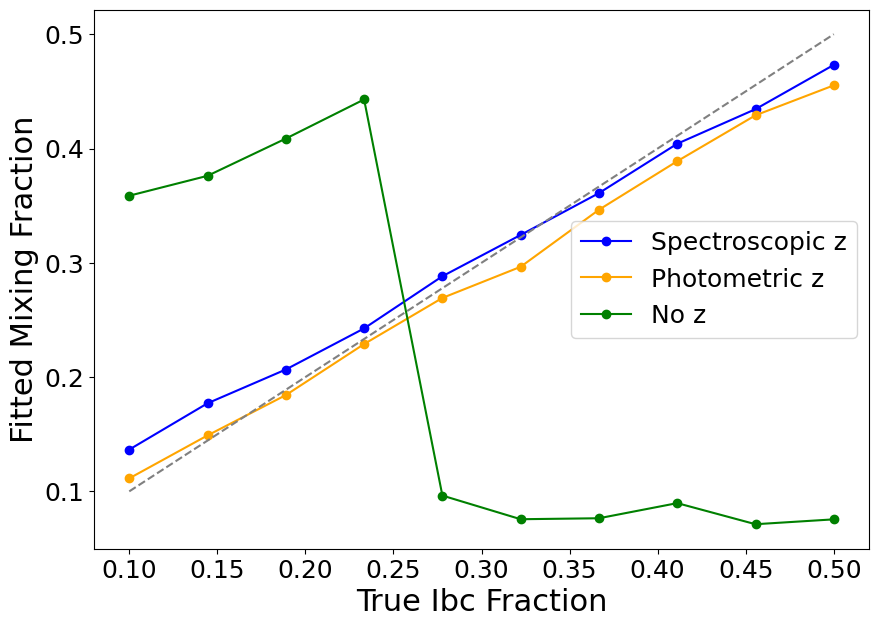

In [17]:
# Fitted alpha vs true Ibc fraction
plt.figure(figsize=(10, 7))
for key, ds in datasets.items():
    r = results[key]
    alphas_plot = [i if i <= 0.5 else 1 - i for i in r['alphas_best']]
    plt.plot(ratios, alphas_plot, marker='o', color=ds['color'], label=ds['label'])
    # plt.fill_between(ratios, 1 - r['alphas_hi'], 1 - r['alphas_lo'],
    #                  alpha=0.2, color=ds['color'])
plt.plot(ratios, ratios, linestyle='--', color='gray')
plt.xlabel("True Ibc Fraction", fontsize=22)
plt.ylabel("Fitted Mixing Fraction", fontsize=22)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.legend(fontsize=18)
plt.savefig("figures/redshift_comparison_alpha_unsupervised.pdf", bbox_inches='tight')
plt.show()


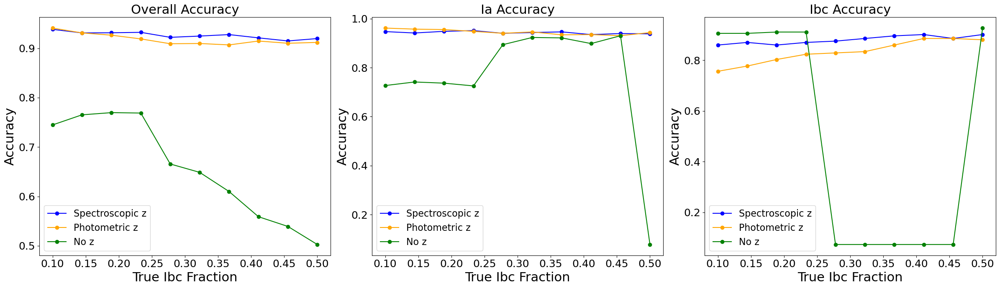

In [18]:
# Accuracy vs true Ibc fraction
acc_labels = ['Overall Accuracy', 'Ia Accuracy', 'Ibc Accuracy']
fig, axes = plt.subplots(1, 3, figsize=(24, 7))

for k in range(3):
    ax = axes[k]
    for key, ds in datasets.items():
        r = results[key]
        ax.plot(ratios, r['accuracies_best'][k, :], marker='o', color=ds['color'], label=ds['label'])
        # ax.fill_between(ratios, r['accuracies_lo'][k, :], r['accuracies_hi'][k, :],
        #                 alpha=0.2, color=ds['color'])
    ax.set_title(acc_labels[k], fontsize=titlefontsize)
    ax.set_xlabel("True Ibc Fraction", fontsize=22)
    ax.set_ylabel("Accuracy", fontsize=22)
    ax.legend(fontsize=16)
    ax.tick_params(axis='both', labelsize=18)

plt.tight_layout()
plt.savefig("figures/redshift_comparison_accuracy_unsupervised.pdf", bbox_inches='tight')
plt.show()


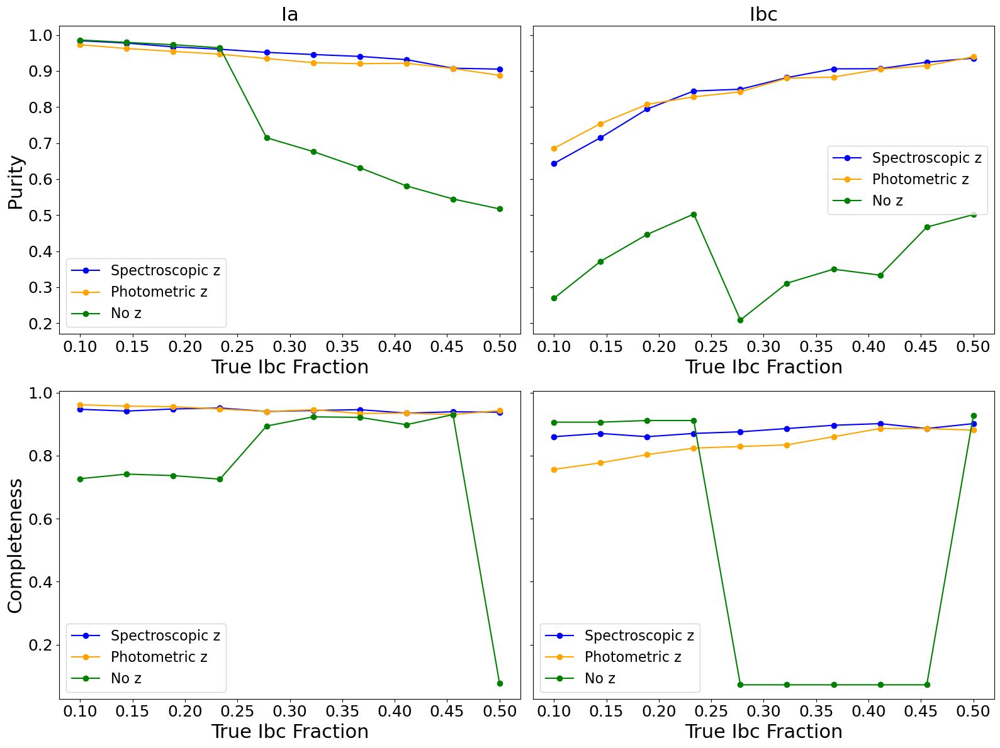

In [19]:
# Purity and completeness vs true Ibc fraction
fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharey='row')

for key, ds in datasets.items():
    r = results[key]
    axes[0, 0].plot(ratios, r['accuracies_best'][3, :], marker='o', color=ds['color'], label=ds['label'])
    axes[0, 1].plot(ratios, r['accuracies_best'][5, :], marker='o', color=ds['color'], label=ds['label'])
    axes[1, 0].plot(ratios, r['accuracies_best'][4, :], marker='o', color=ds['color'], label=ds['label'])
    axes[1, 1].plot(ratios, r['accuracies_best'][6, :], marker='o', color=ds['color'], label=ds['label'])

axes[0, 0].set_title('Ia', fontsize=titlefontsize)
axes[0, 1].set_title('Ibc', fontsize=titlefontsize)
axes[0, 0].set_ylabel('Purity', fontsize=22)
axes[1, 0].set_ylabel('Completeness', fontsize=22)
for ax in axes.flat:
    ax.set_xlabel("True Ibc Fraction", fontsize=22)
    ax.legend(fontsize=16)
    ax.tick_params(axis='both', labelsize=18)

plt.tight_layout()
plt.savefig("figures/redshift_comparison_purity_unsupervised.pdf", bbox_inches='tight')
plt.show()



GMM fits: Spectroscopic z


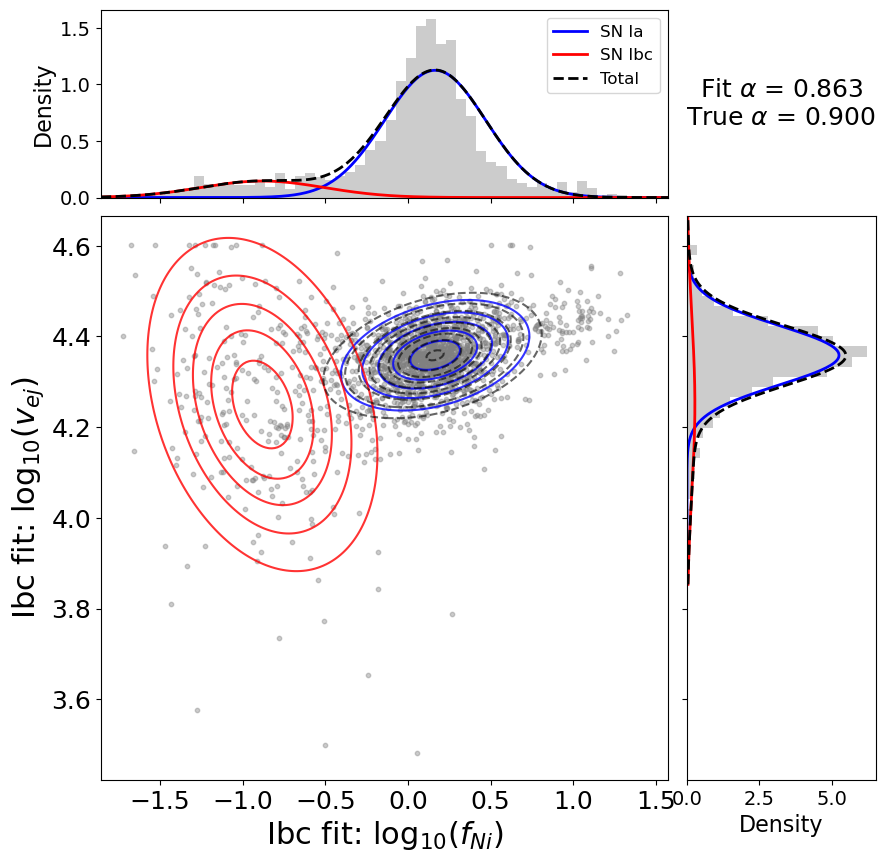

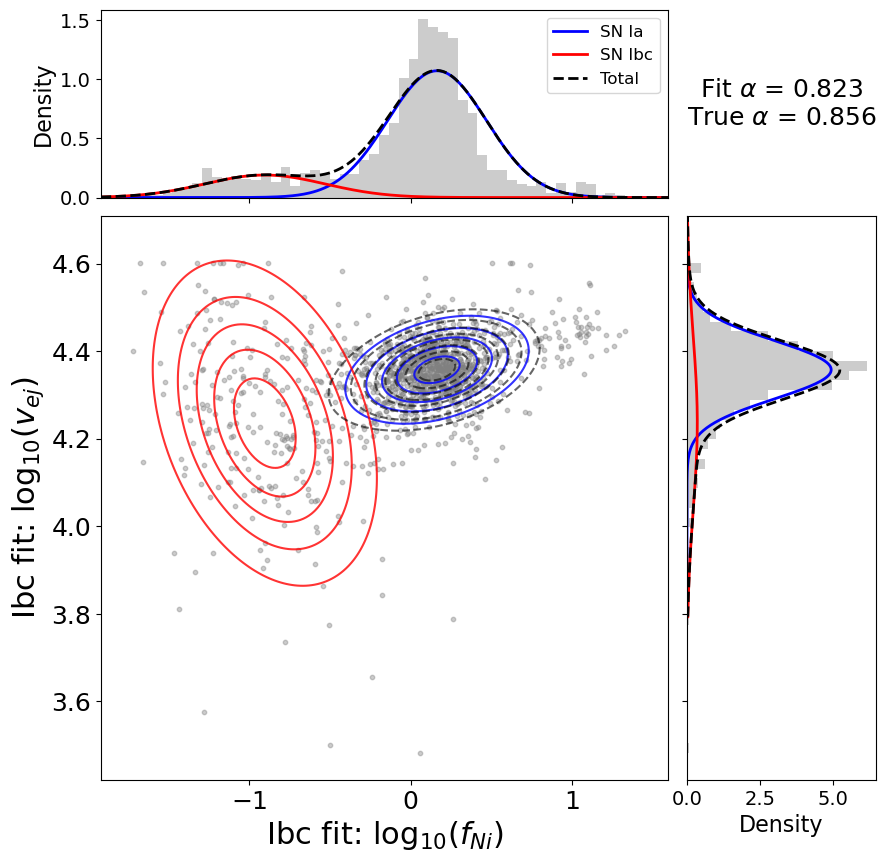

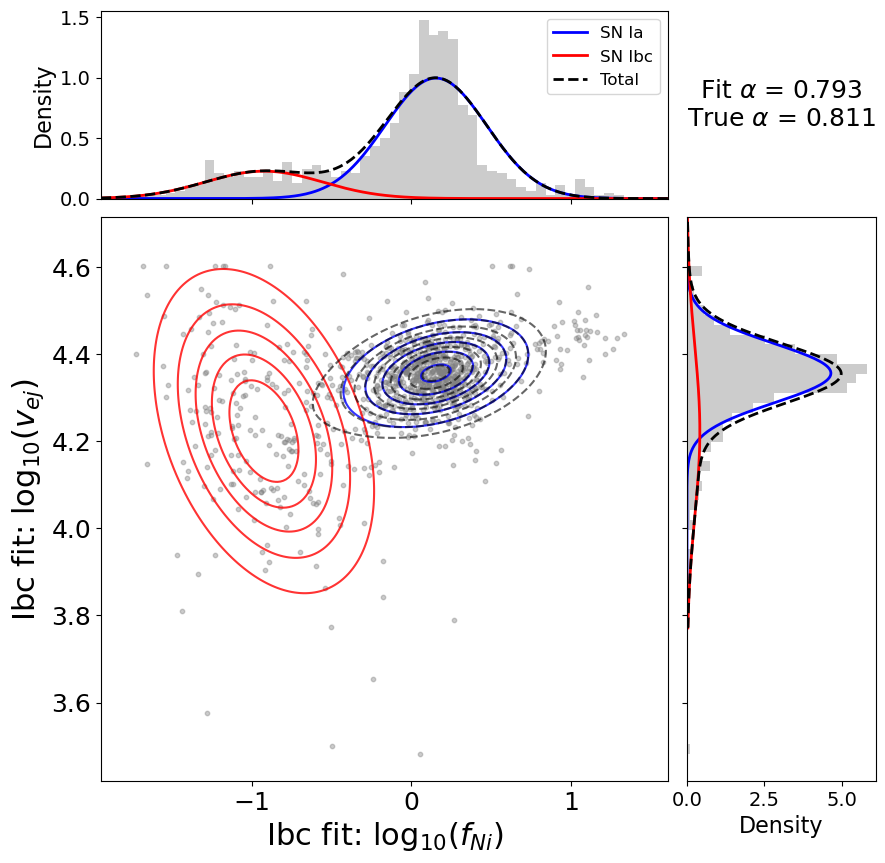

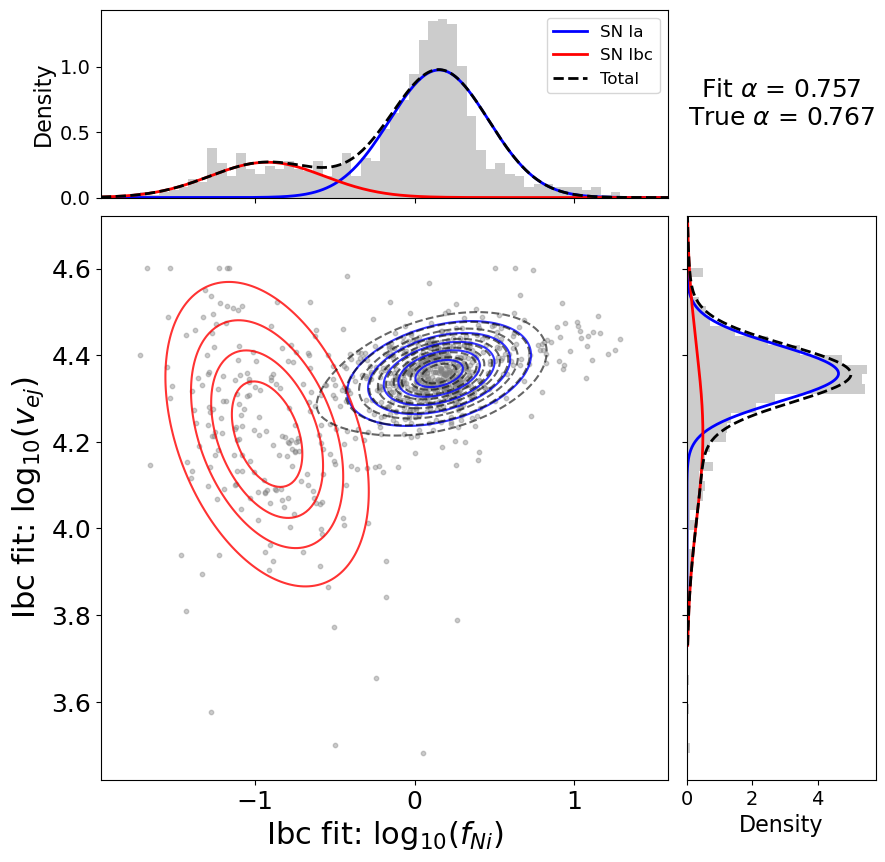

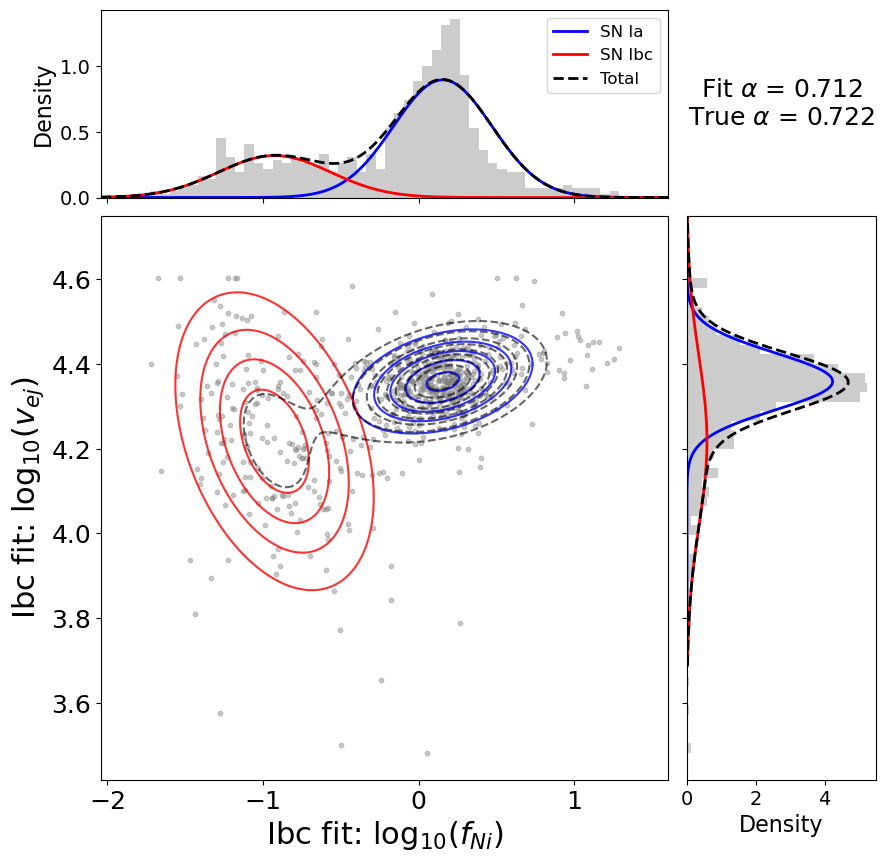

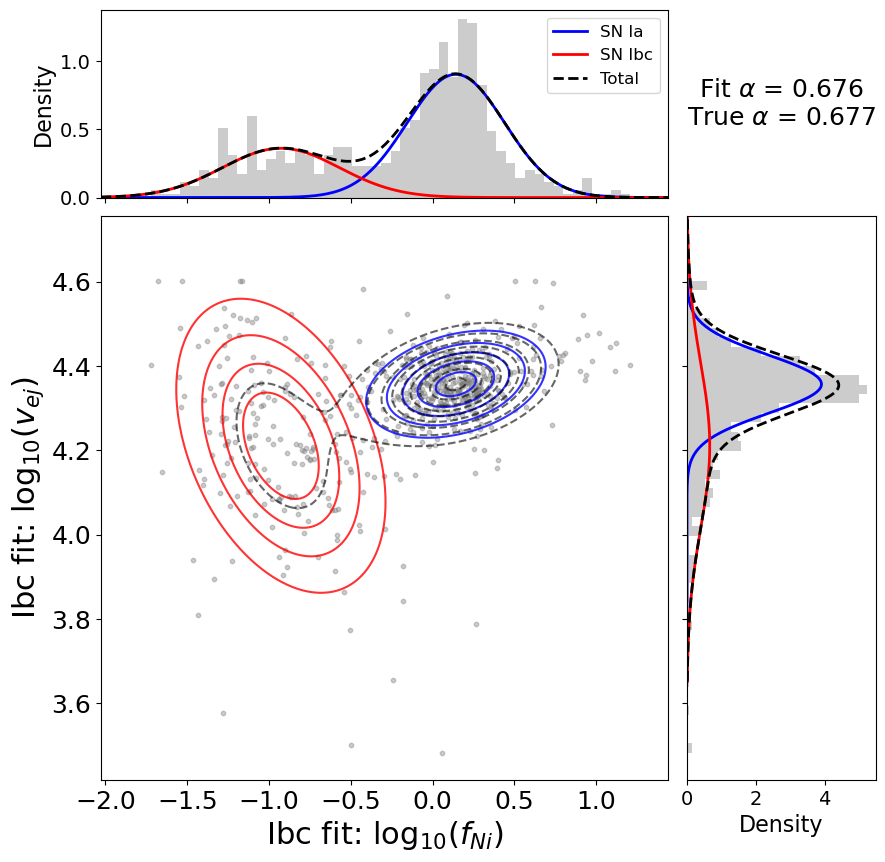

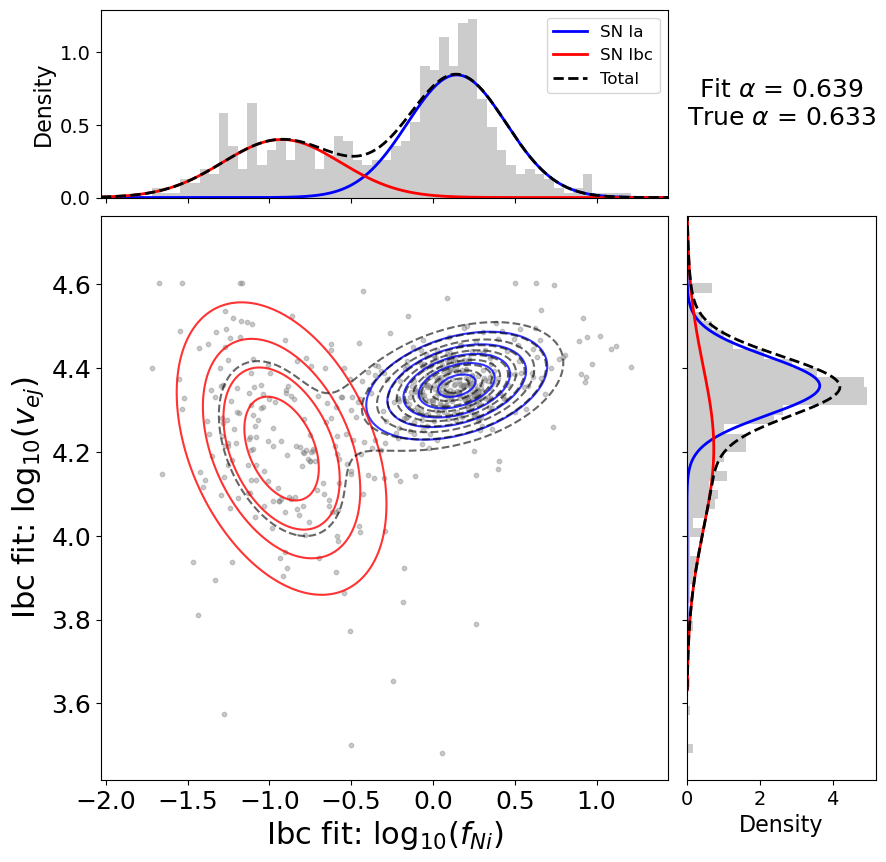

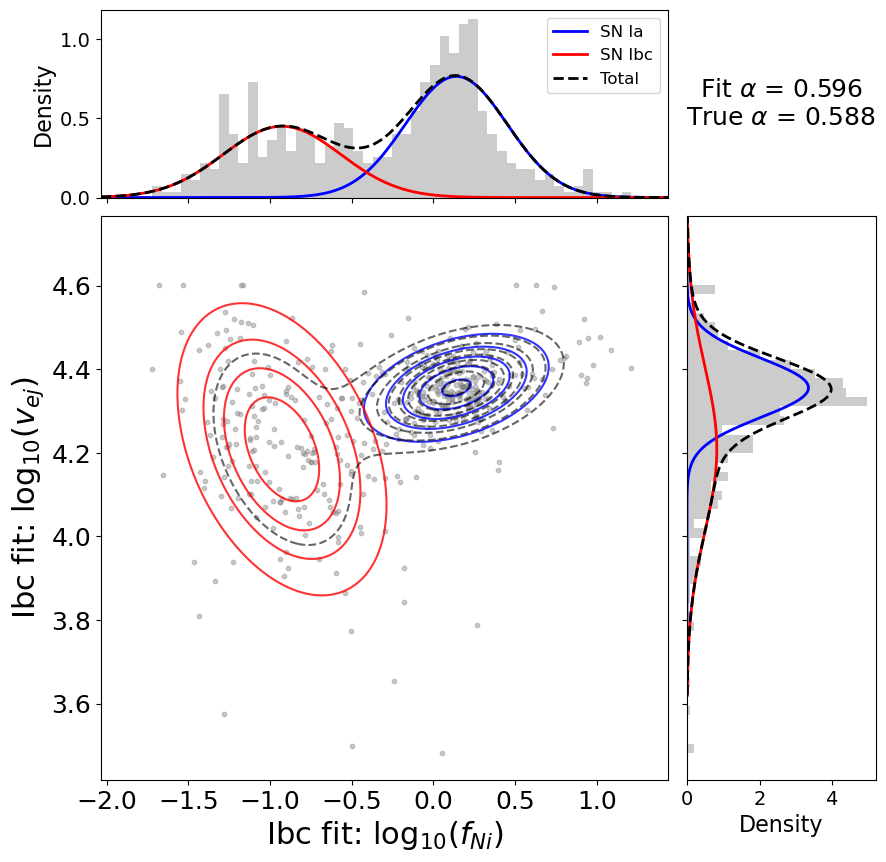

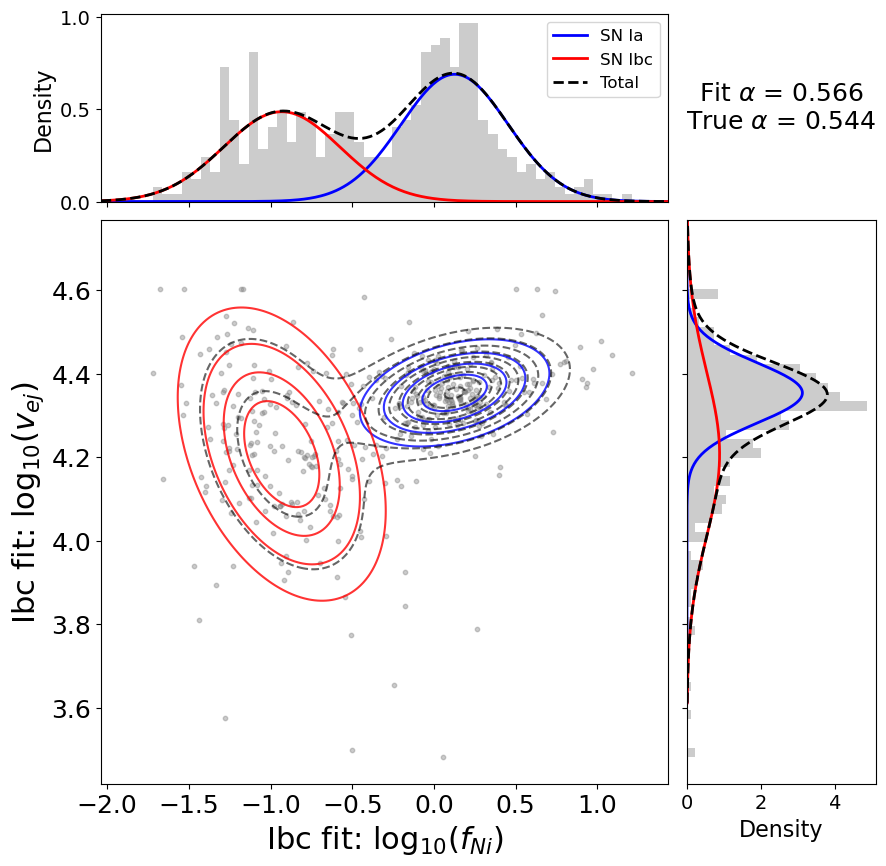

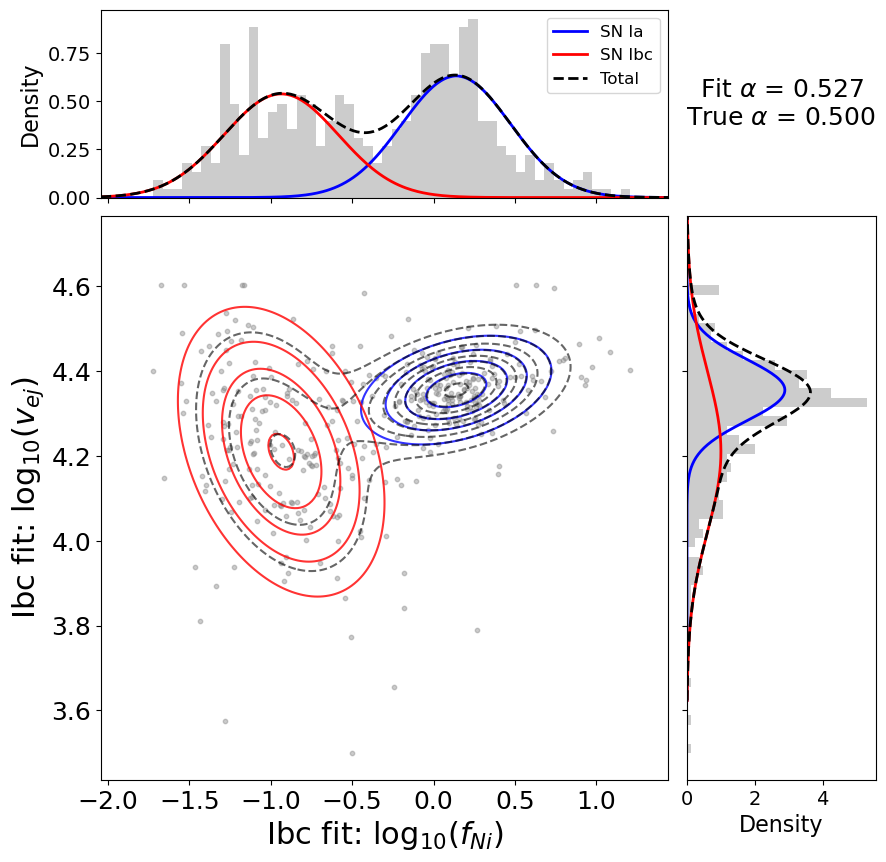


GMM fits: Photometric z


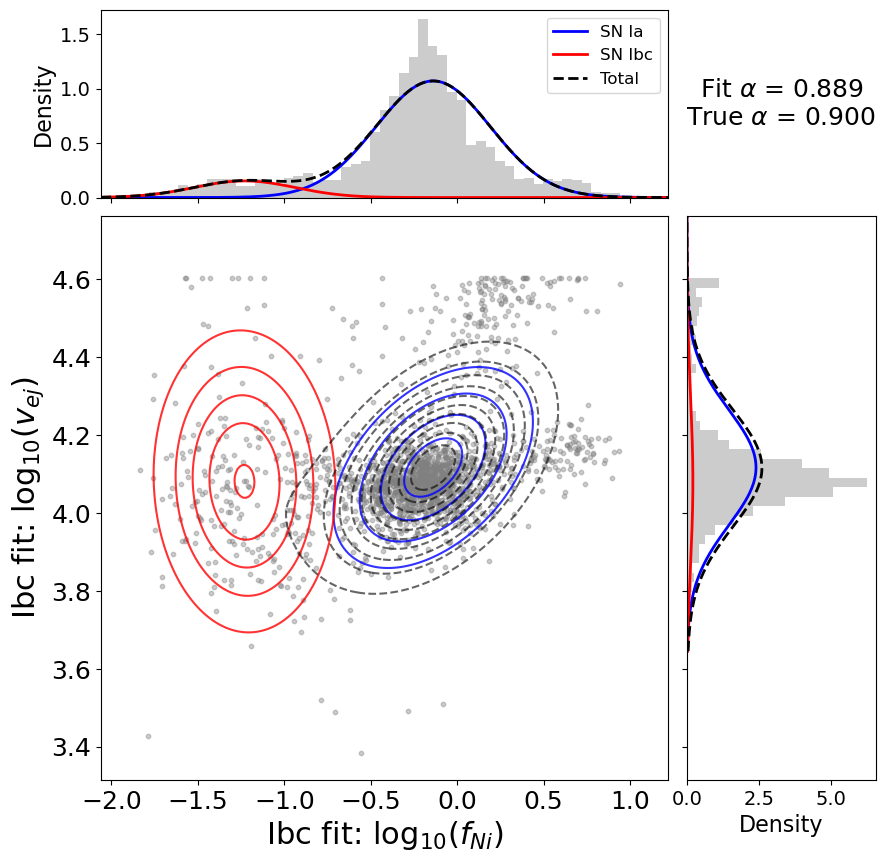

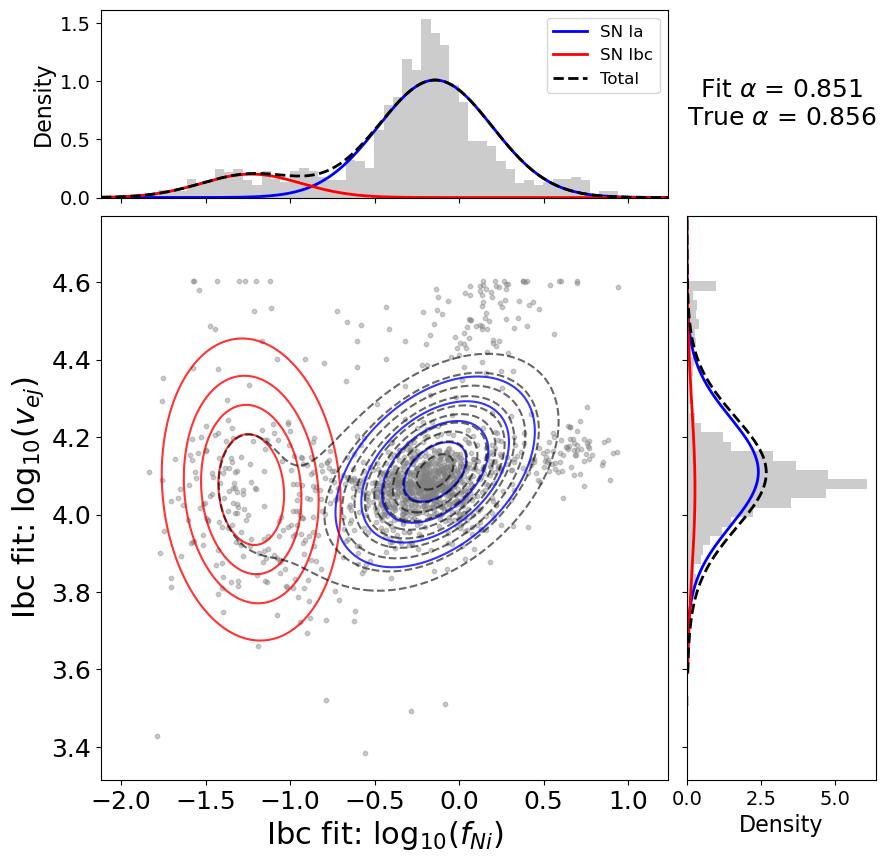

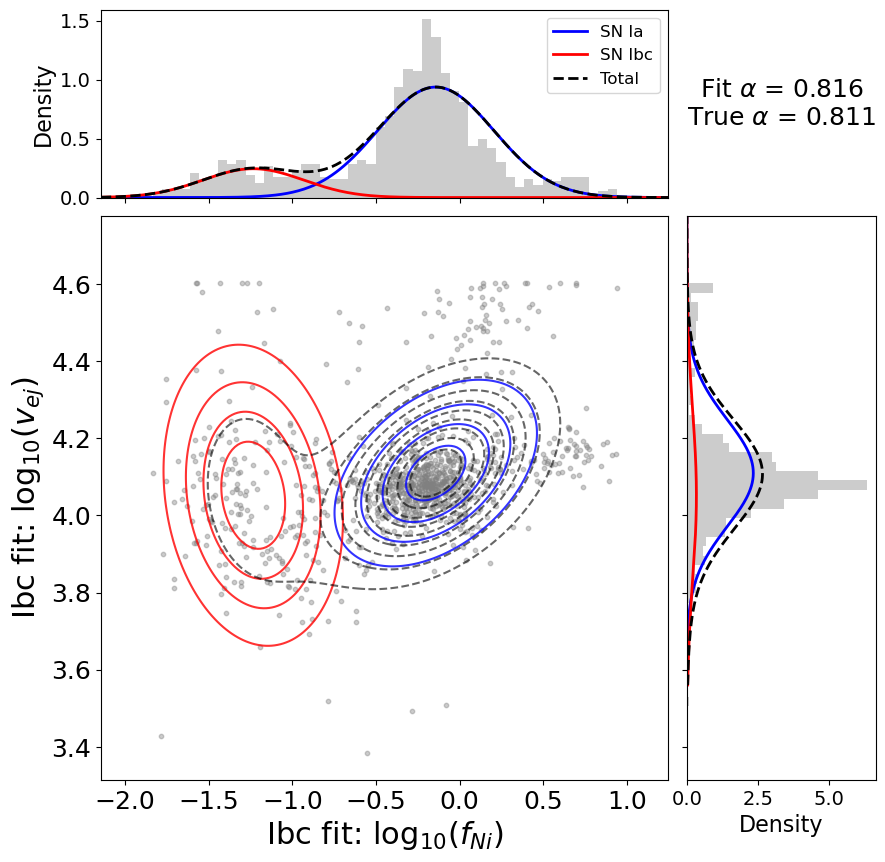

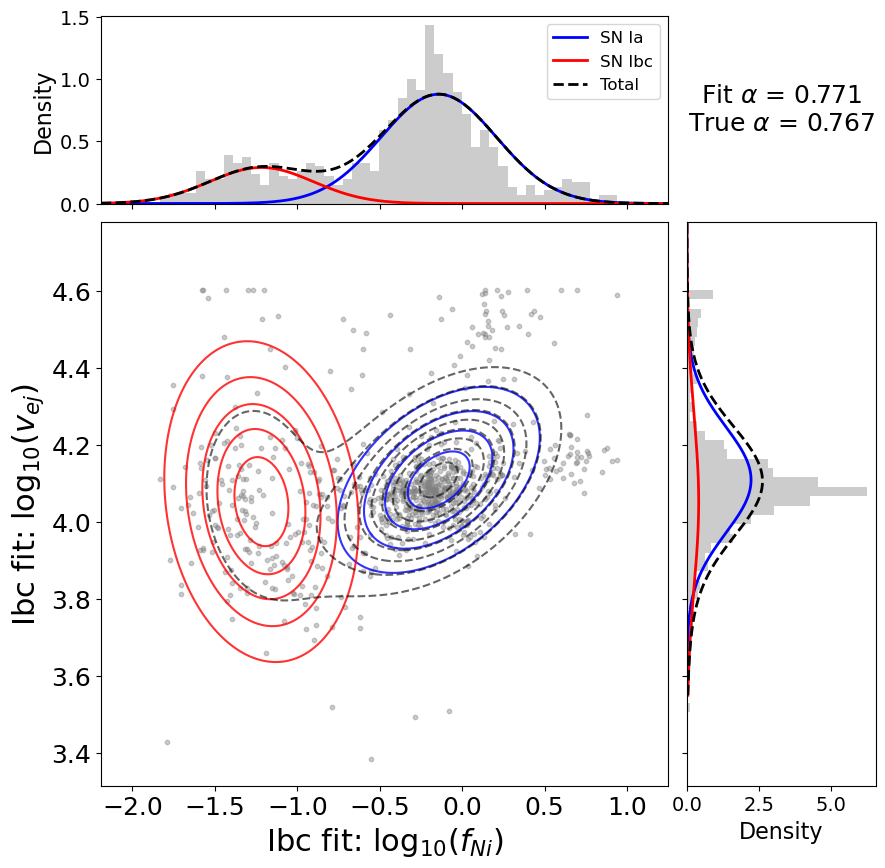

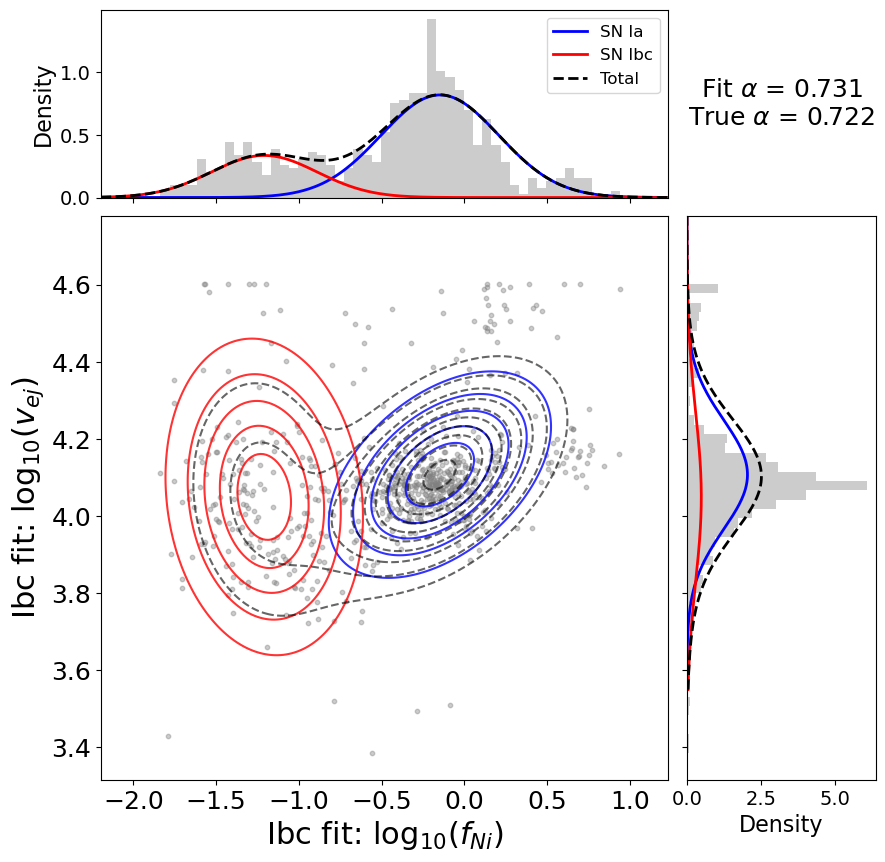

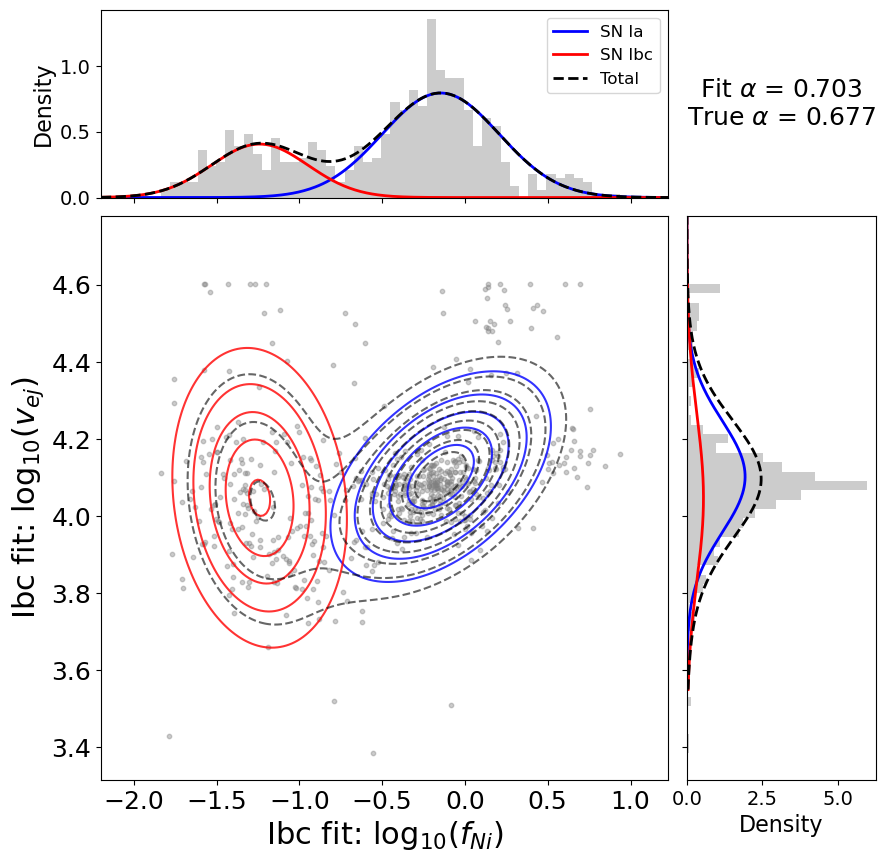

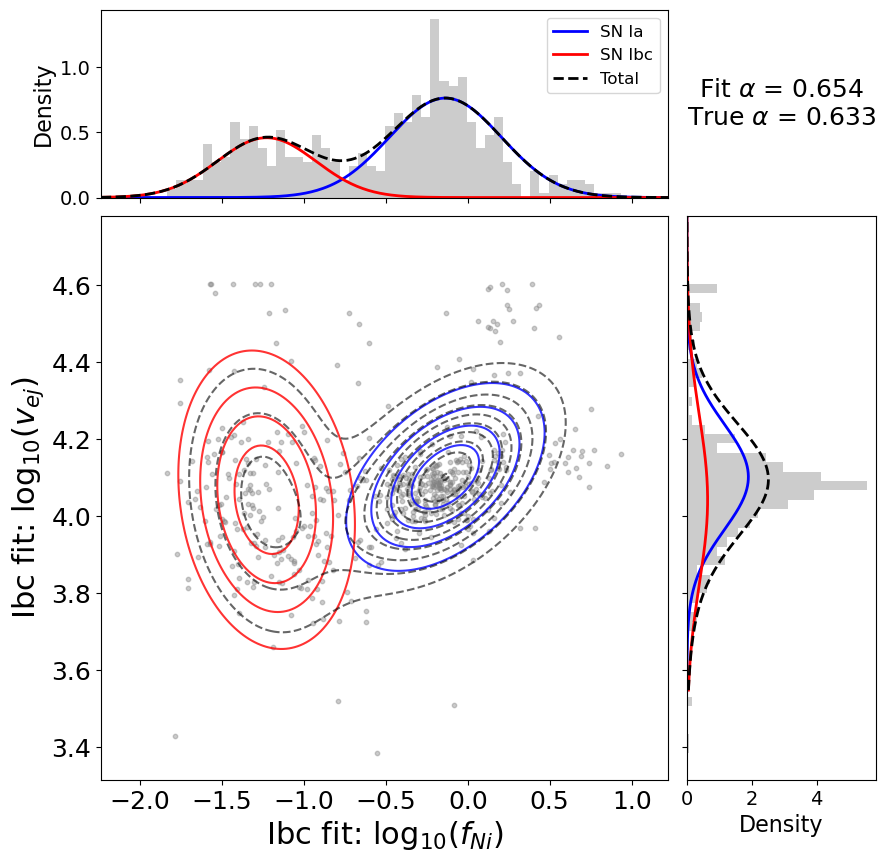

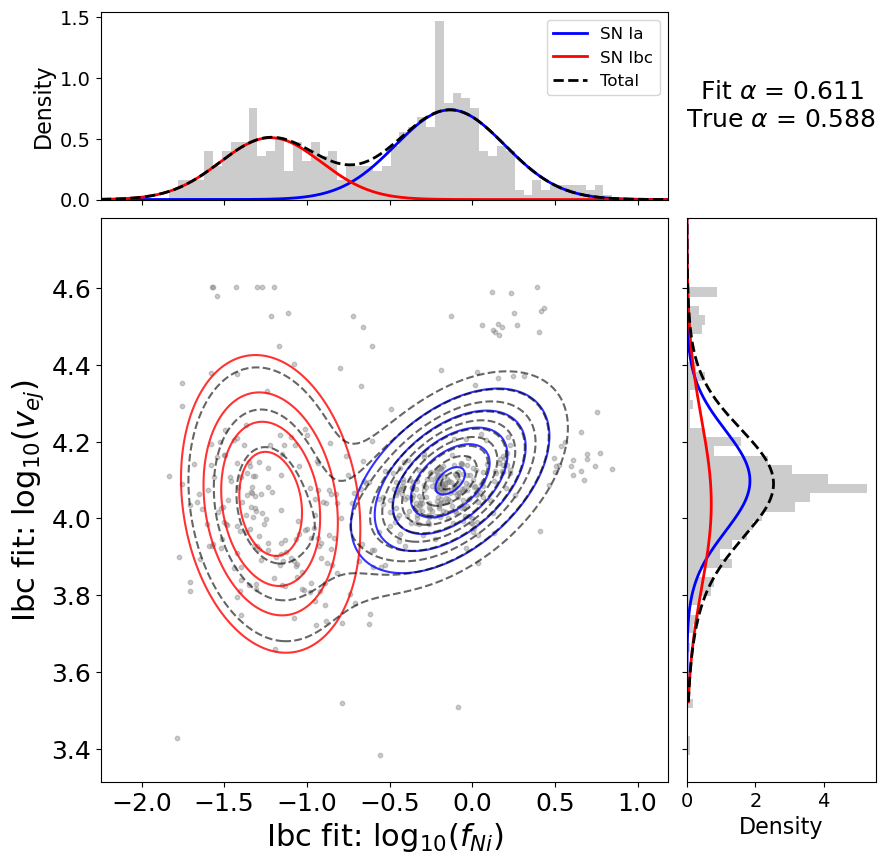

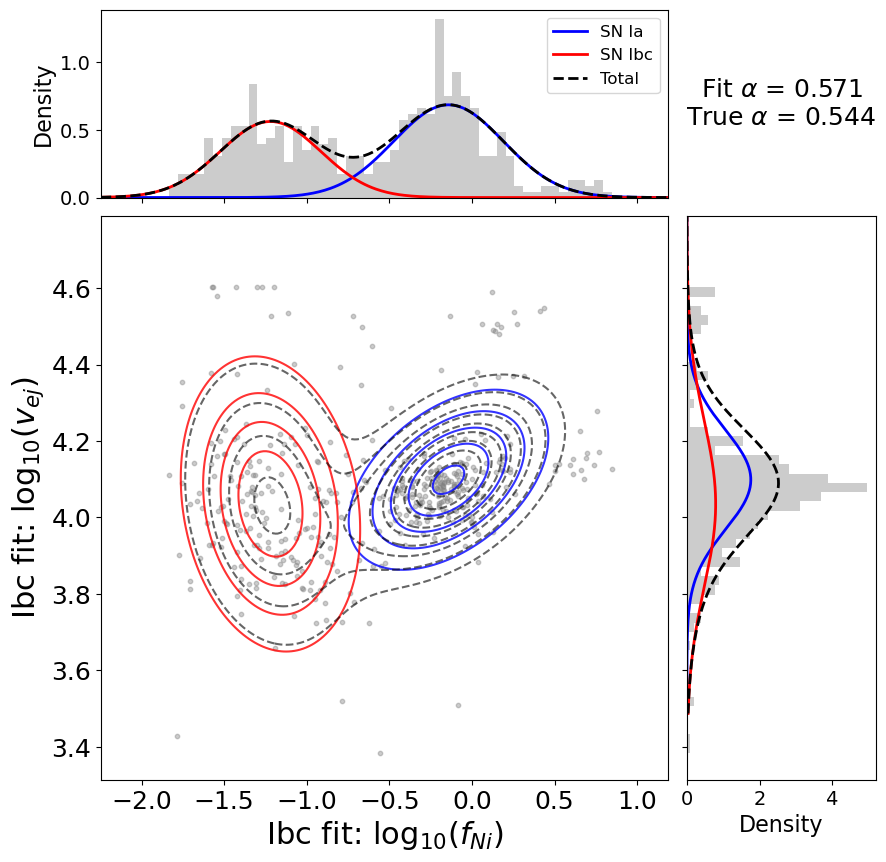

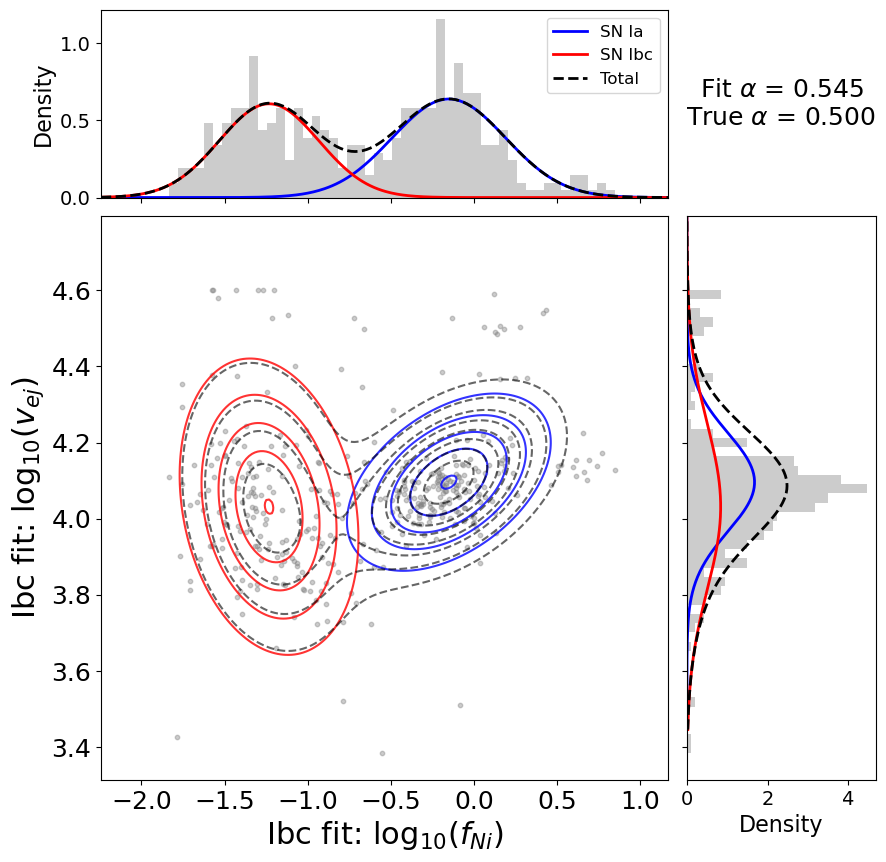


GMM fits: No z


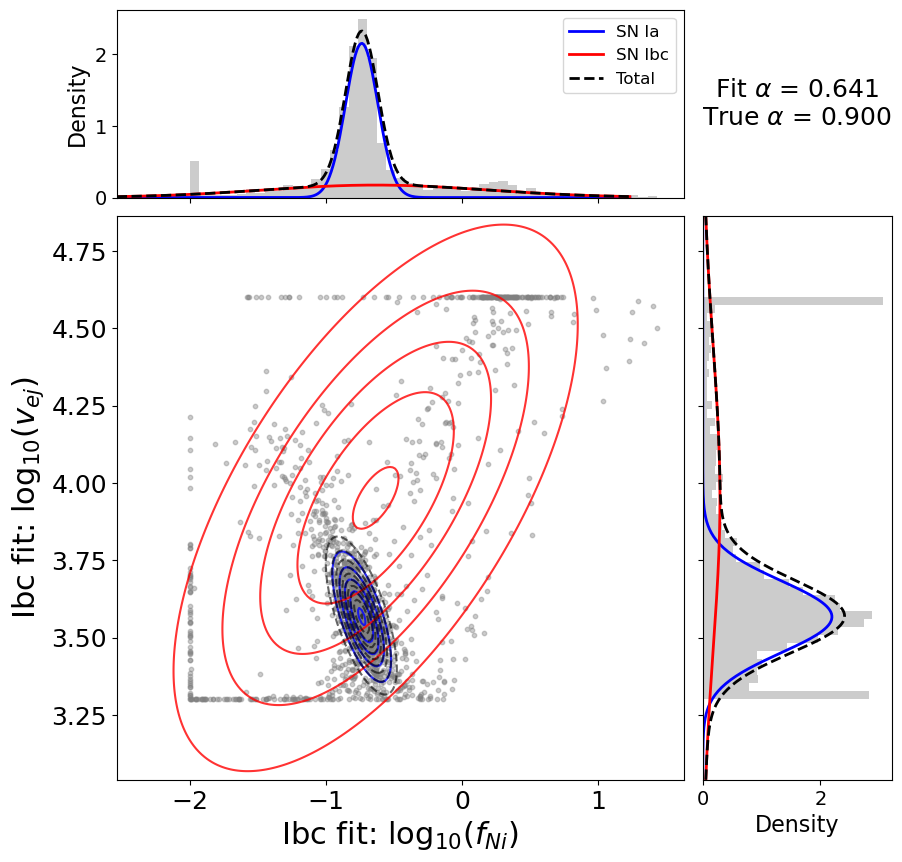

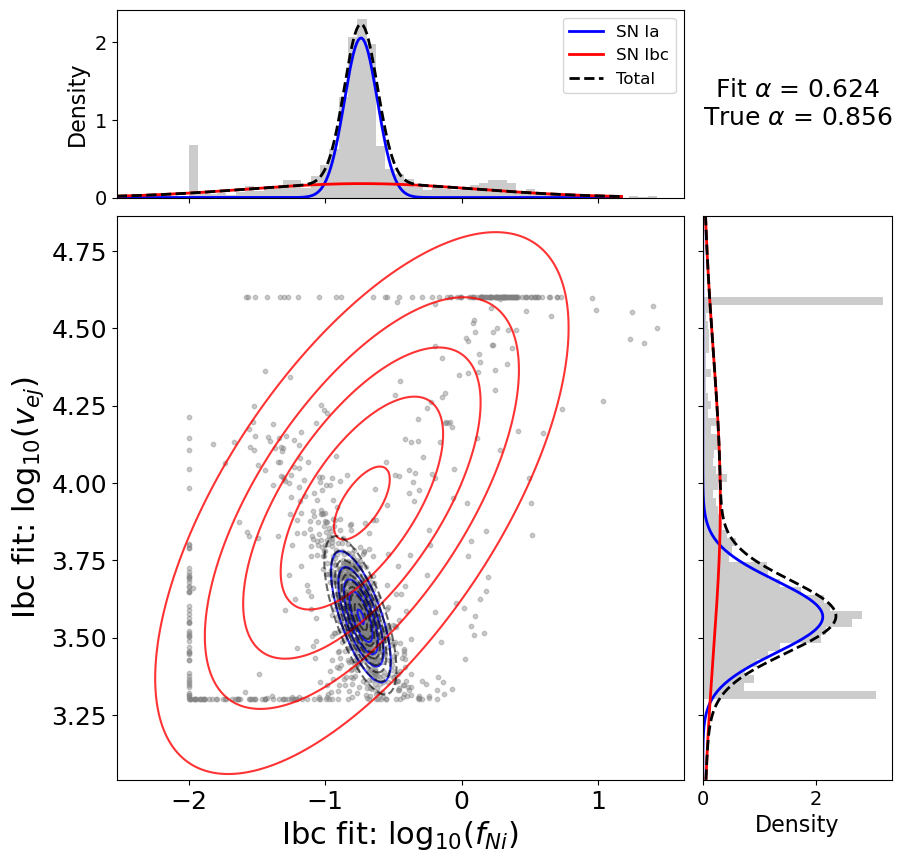

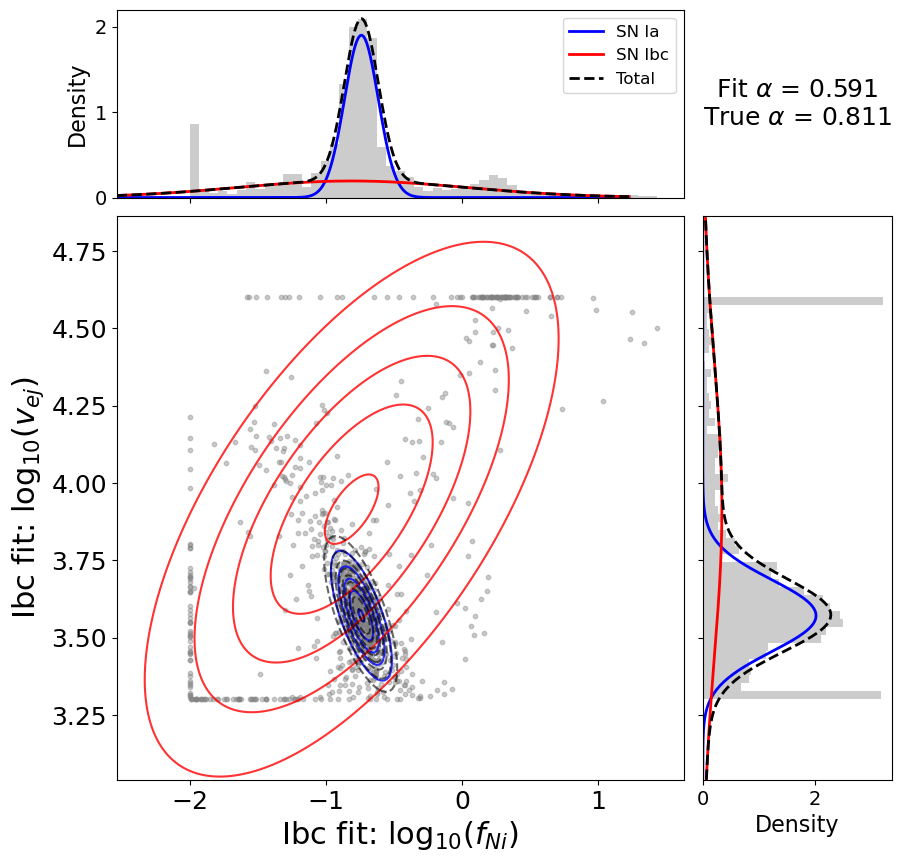

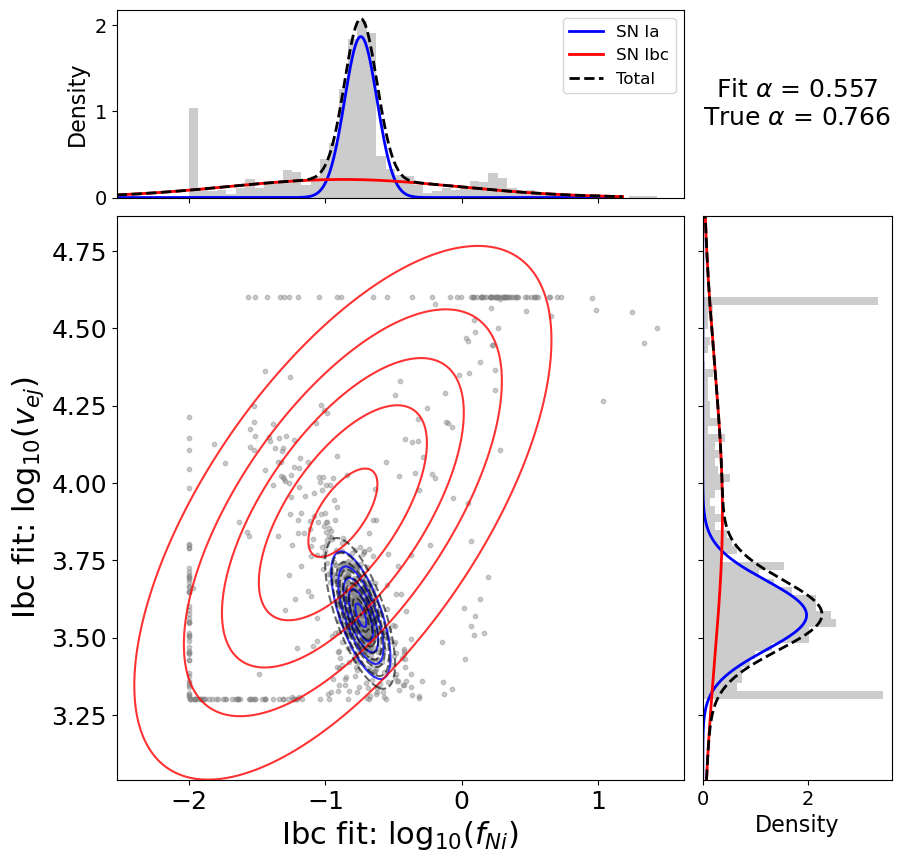

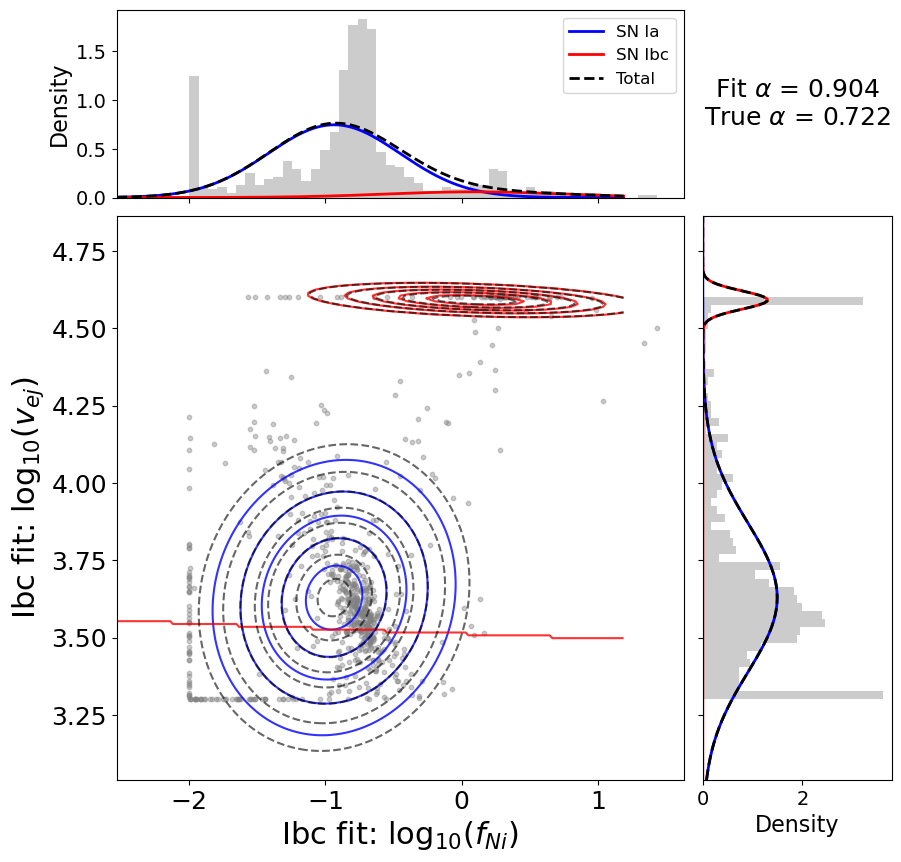

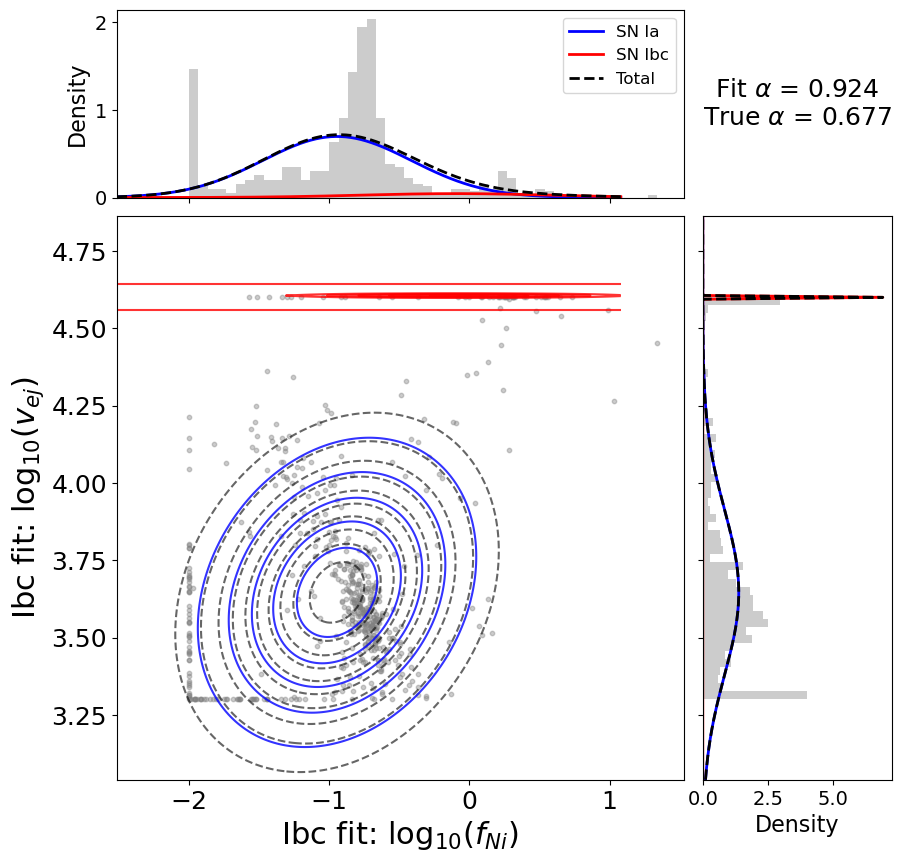

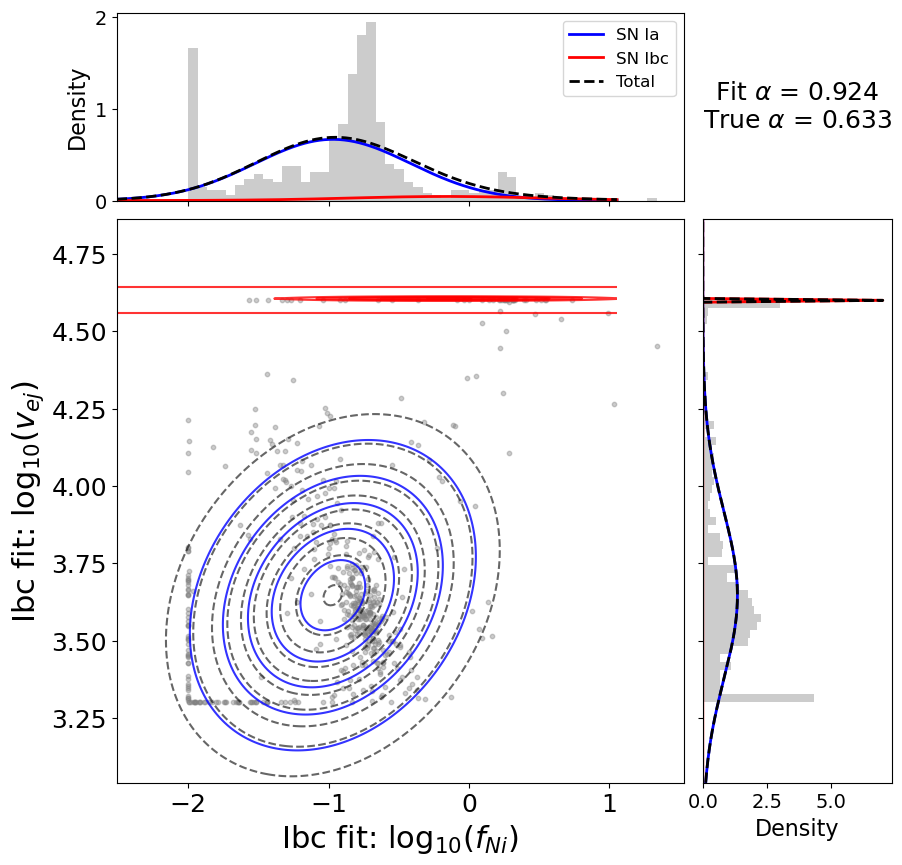

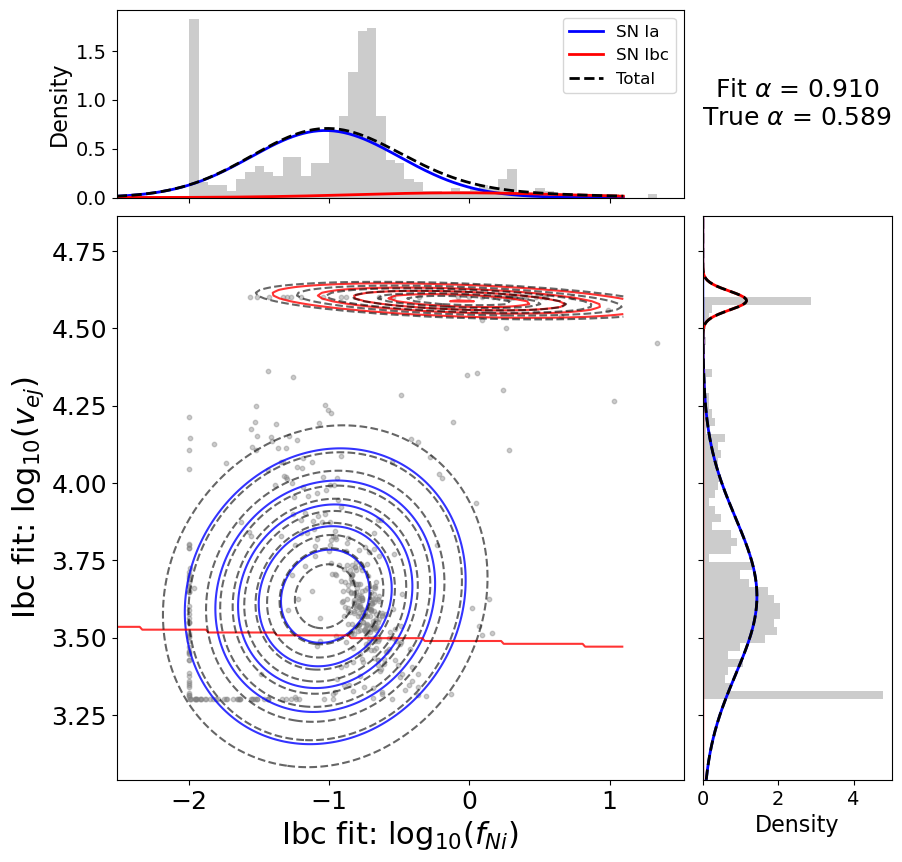

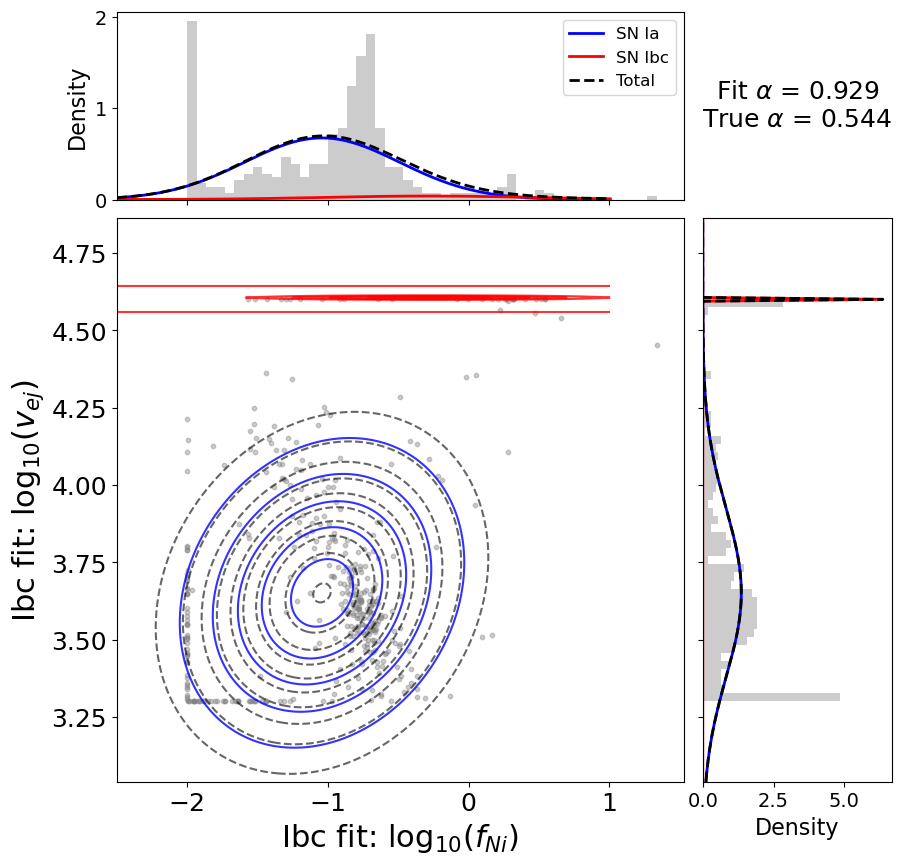

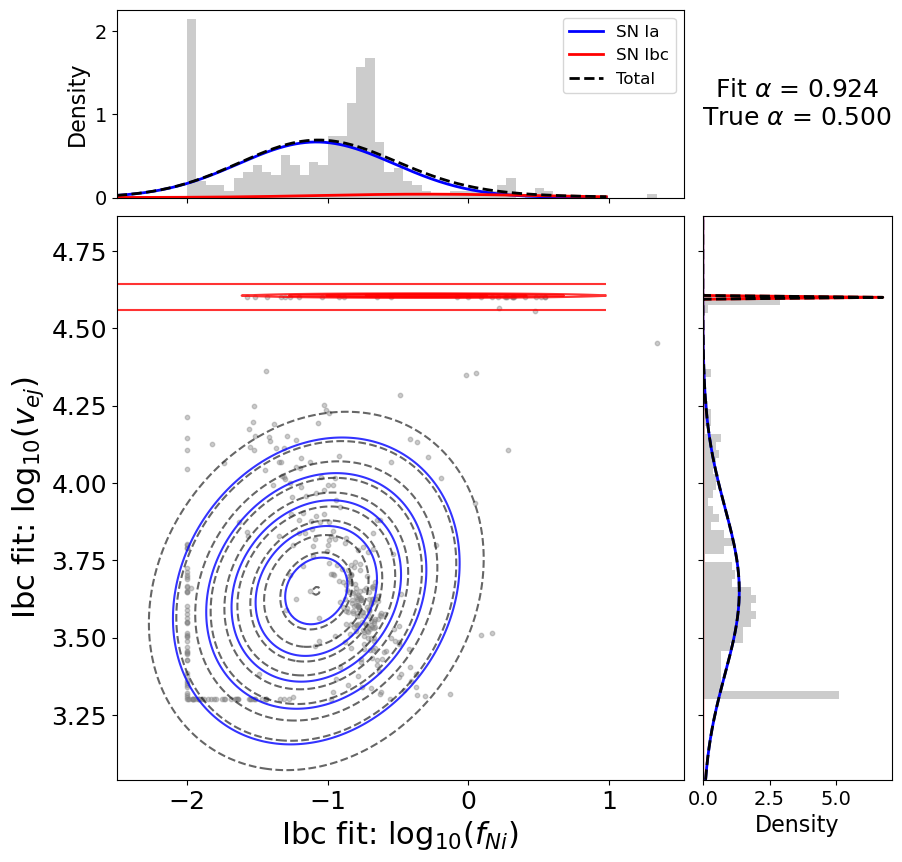

In [46]:
# GMM fit visualizations for each dataset
for key, ds in datasets.items():
    print(f"\nGMM fits: {ds['label']}")
    fig, axes = plot_2d_gmm_iterations(results[key])
    # fig.savefig(f"figures/redshift_comparison_gmm_{key}.pdf", bbox_inches='tight')
    plt.show()


## Semi-supervised (10% known labels) analysis

In [21]:
# Run mixing fraction analysis with 10% known labels for each dataset
results_fixed = {}
for key, ds in datasets.items():
    print(f"\n{'='*60}")
    print(f"Running 10% known analysis for: {ds['label']}")
    print(f"{'='*60}")
    results_fixed[key] = mixing_fraction_analysis(
        ds['true_ia_sne'], ds['true_ibc_sne'], ratios, 
        fitting_method=fit_2d_gmm_fix_some_classes, n_repeats=30)


Running 10% known analysis for: Spectroscopic z
Repeat 1/30, ratio 1/10: 0.100
Repeat 1/30, ratio 2/10: 0.144
Repeat 1/30, ratio 3/10: 0.189
Repeat 1/30, ratio 4/10: 0.233
Repeat 1/30, ratio 5/10: 0.278
Repeat 1/30, ratio 6/10: 0.322
Repeat 1/30, ratio 7/10: 0.367
Repeat 1/30, ratio 8/10: 0.411
Repeat 1/30, ratio 9/10: 0.456
Repeat 1/30, ratio 10/10: 0.500
Repeat 2/30, ratio 1/10: 0.100
Repeat 2/30, ratio 2/10: 0.144
Repeat 2/30, ratio 3/10: 0.189
Repeat 2/30, ratio 4/10: 0.233
Repeat 2/30, ratio 5/10: 0.278
Repeat 2/30, ratio 6/10: 0.322
Repeat 2/30, ratio 7/10: 0.367
Repeat 2/30, ratio 8/10: 0.411
Repeat 2/30, ratio 9/10: 0.456
Repeat 2/30, ratio 10/10: 0.500
Repeat 3/30, ratio 1/10: 0.100
Repeat 3/30, ratio 2/10: 0.144
Repeat 3/30, ratio 3/10: 0.189
Repeat 3/30, ratio 4/10: 0.233
Repeat 3/30, ratio 5/10: 0.278
Repeat 3/30, ratio 6/10: 0.322
Repeat 3/30, ratio 7/10: 0.367
Repeat 3/30, ratio 8/10: 0.411
Repeat 3/30, ratio 9/10: 0.456
Repeat 3/30, ratio 10/10: 0.500
Repeat 4/30, ratio

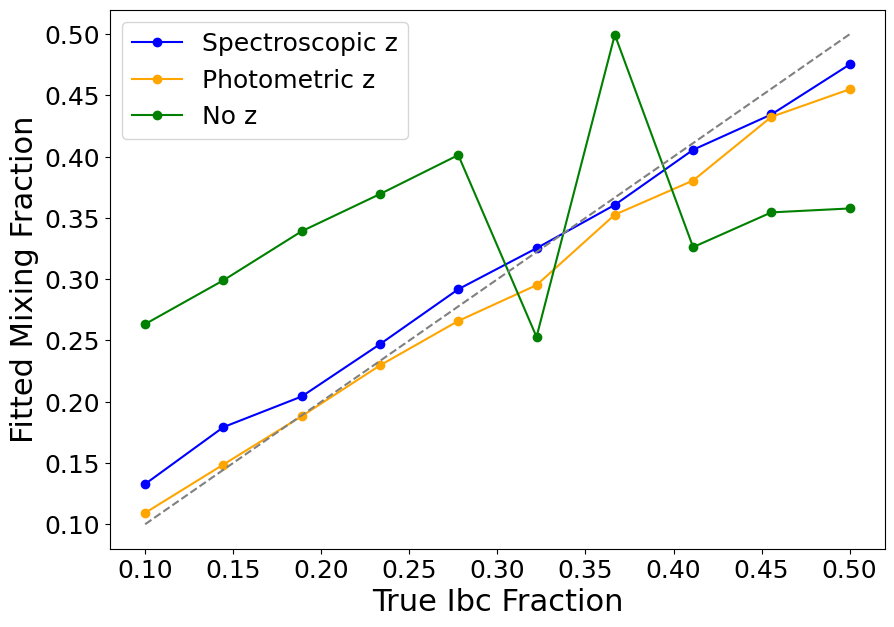

In [22]:
# Fitted alpha vs true Ibc fraction (10% known)
plt.figure(figsize=(10, 7))

for key, ds in datasets.items():
    r = results_fixed[key]
    alphas_plot = [i if i < 0.5 else 1 - i for i in r['alphas_best']]
    plt.plot(ratios, alphas_plot, marker='o', color=ds['color'], label=ds['label'])
    # plt.fill_between(ratios, 1 - r['alphas_hi'], 1 - r['alphas_lo'],
    #                  alpha=0.2, color=ds['color'])
plt.plot(ratios, ratios, linestyle='--', color='gray')
plt.xlabel("True Ibc Fraction", fontsize=22)
plt.ylabel("Fitted Mixing Fraction", fontsize=22)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.legend(fontsize=18)
plt.savefig("figures/redshift_comparison_alpha_supervised.pdf", bbox_inches='tight')
plt.show()


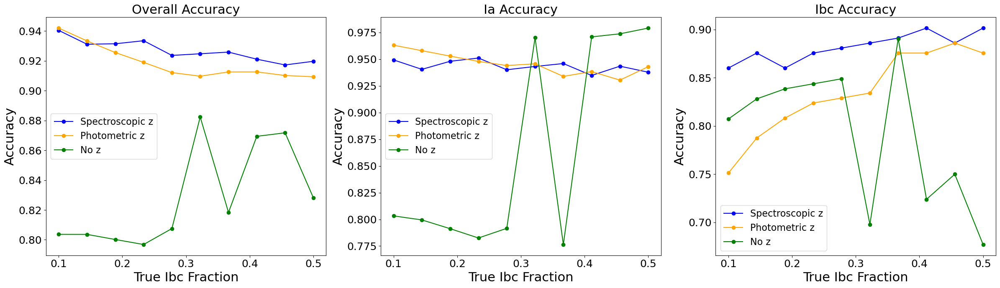

In [23]:
# Accuracy vs true Ibc fraction (10% known)
acc_labels = ['Overall Accuracy', 'Ia Accuracy', 'Ibc Accuracy']
fig, axes = plt.subplots(1, 3, figsize=(24, 7))

for k in range(3):
    ax = axes[k]
    for key, ds in datasets.items():
        r = results_fixed[key]
        ax.plot(ratios, r['accuracies_best'][k, :], marker='o', color=ds['color'], label=ds['label'])
        # ax.fill_between(ratios, r['accuracies_lo'][k, :], r['accuracies_hi'][k, :],
        #                 alpha=0.2, color=ds['color'])
    ax.set_title(acc_labels[k], fontsize=titlefontsize)
    ax.set_xlabel("True Ibc Fraction", fontsize=22)
    ax.set_ylabel("Accuracy", fontsize=22)
    ax.legend(fontsize=16)
    ax.tick_params(axis='both', labelsize=18)

plt.tight_layout()
plt.savefig("figures/redshift_comparison_accuracy_supervised.pdf", bbox_inches='tight')
plt.show()


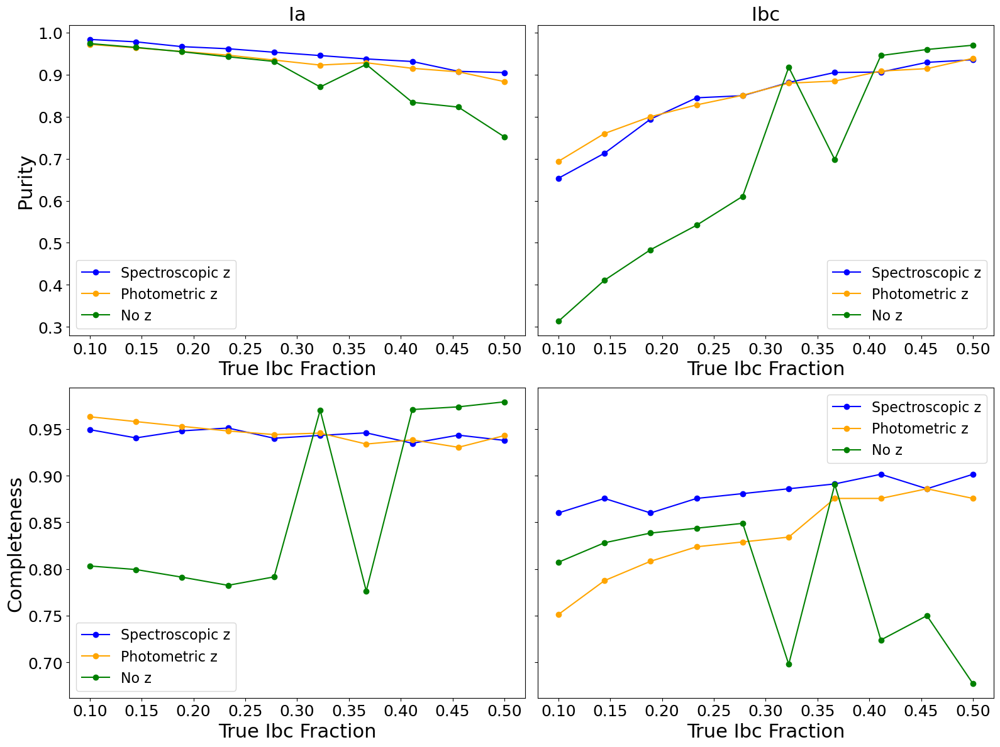

In [24]:
# Purity and completeness vs true Ibc fraction (10% known)
fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharey='row')

for key, ds in datasets.items():
    r = results_fixed[key]
    axes[0, 0].plot(ratios, r['accuracies_best'][3, :], marker='o', color=ds['color'], label=ds['label'])
    axes[0, 1].plot(ratios, r['accuracies_best'][5, :], marker='o', color=ds['color'], label=ds['label'])
    axes[1, 0].plot(ratios, r['accuracies_best'][4, :], marker='o', color=ds['color'], label=ds['label'])
    axes[1, 1].plot(ratios, r['accuracies_best'][6, :], marker='o', color=ds['color'], label=ds['label'])

axes[0, 0].set_title('Ia', fontsize=titlefontsize)
axes[0, 1].set_title('Ibc', fontsize=titlefontsize)
axes[0, 0].set_ylabel('Purity', fontsize=22)
axes[1, 0].set_ylabel('Completeness', fontsize=22)
for ax in axes.flat:
    ax.set_xlabel("True Ibc Fraction", fontsize=22)
    ax.legend(fontsize=16)
    ax.tick_params(axis='both', labelsize=18)

plt.tight_layout()
plt.savefig("figures/redshift_comparison_purity_supervised.pdf", bbox_inches='tight')
plt.show()



GMM fits (10% known): Spectroscopic z


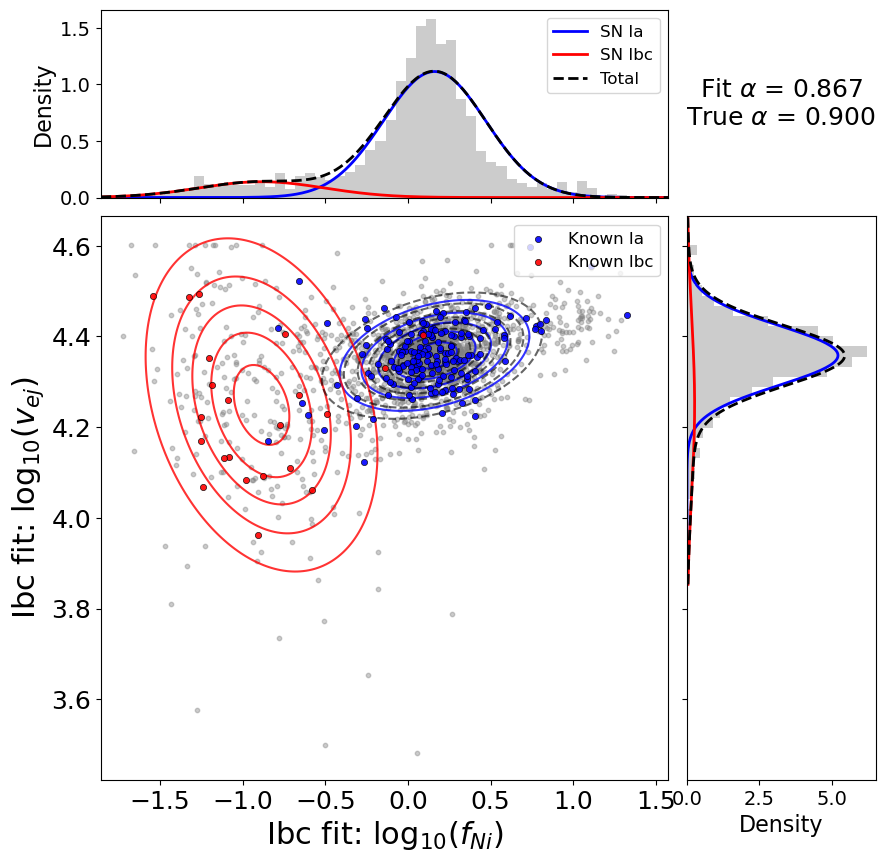

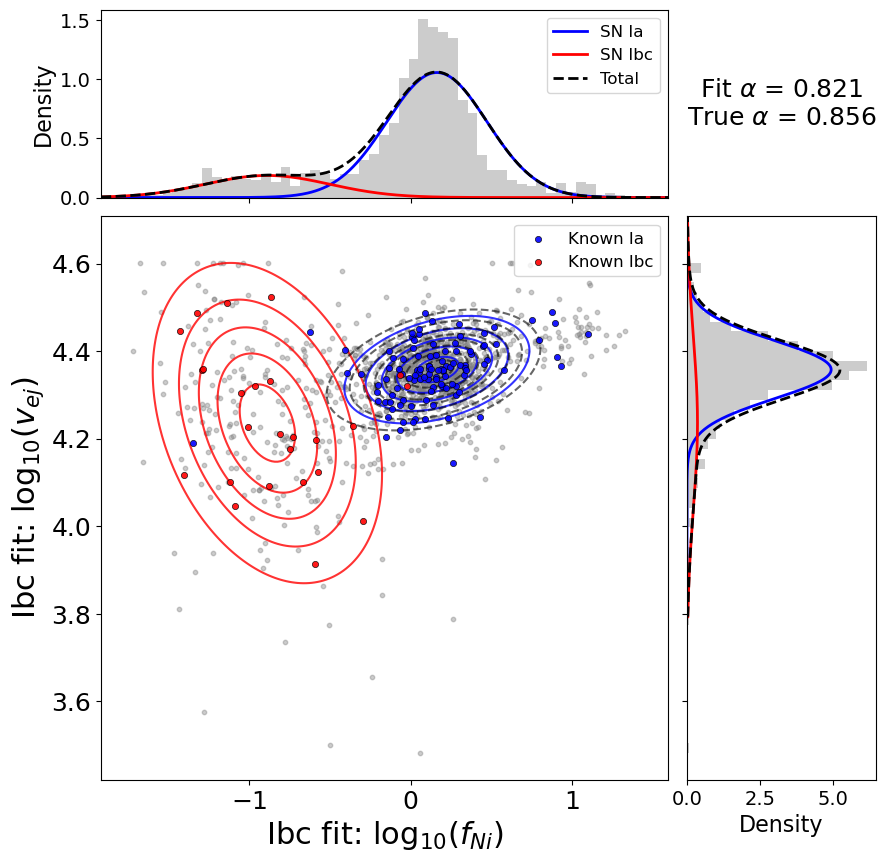

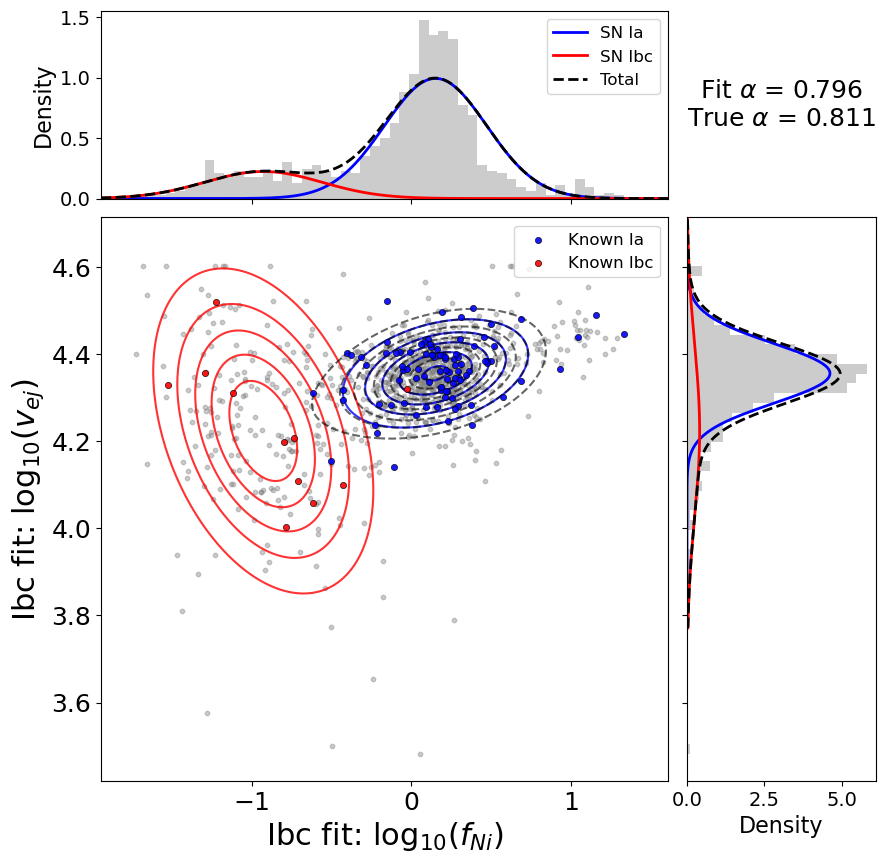

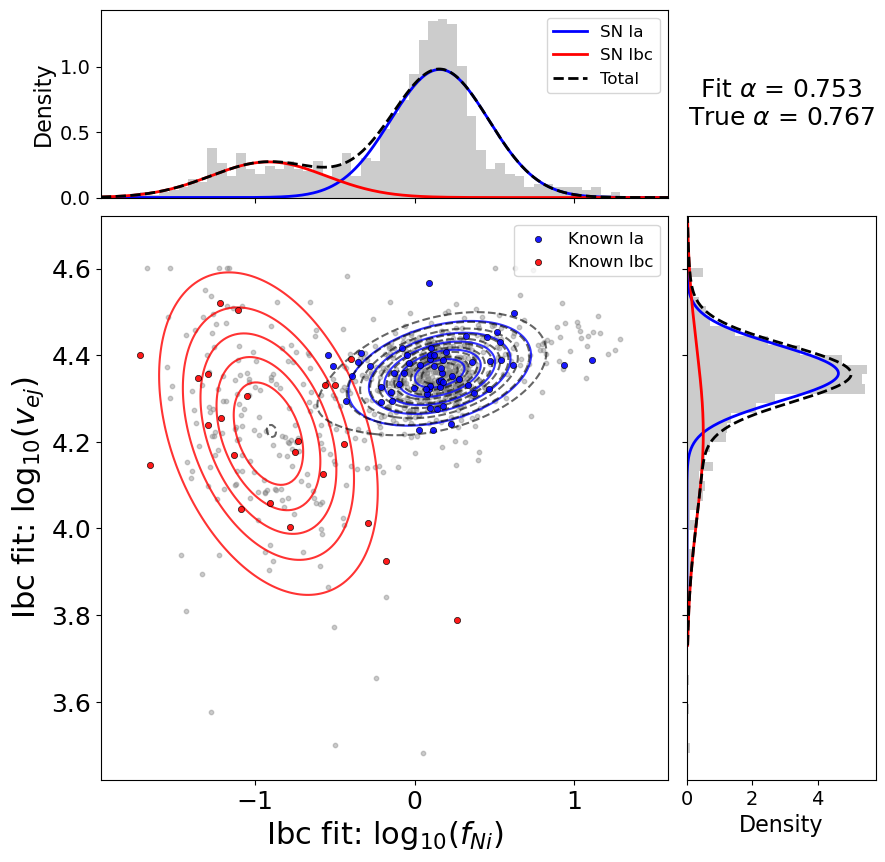

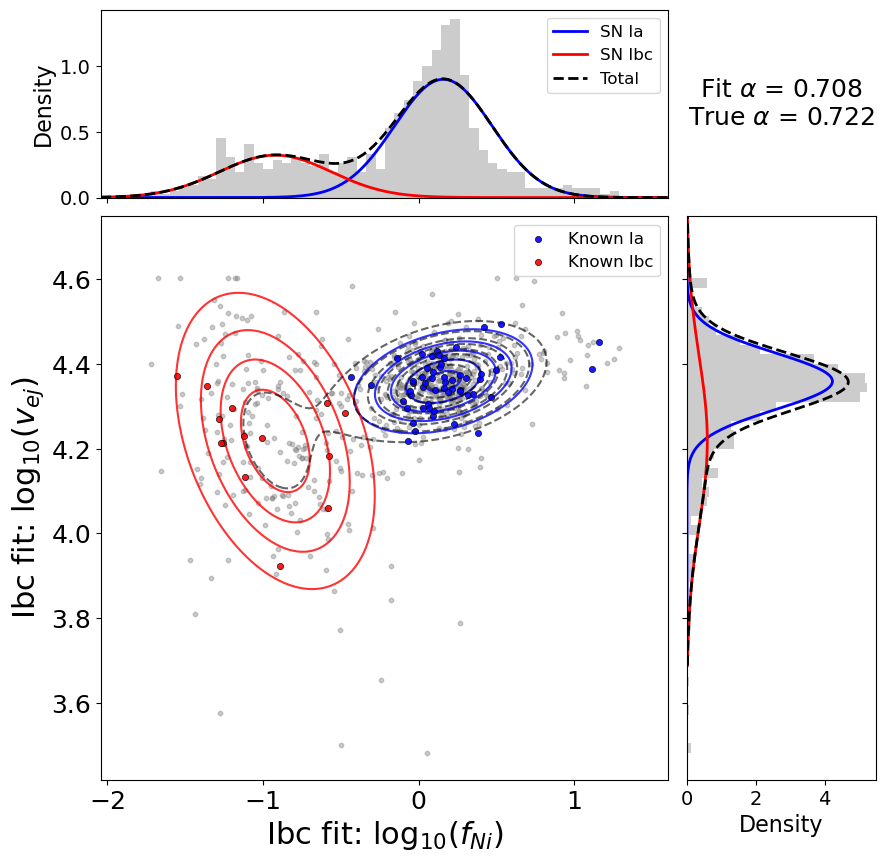

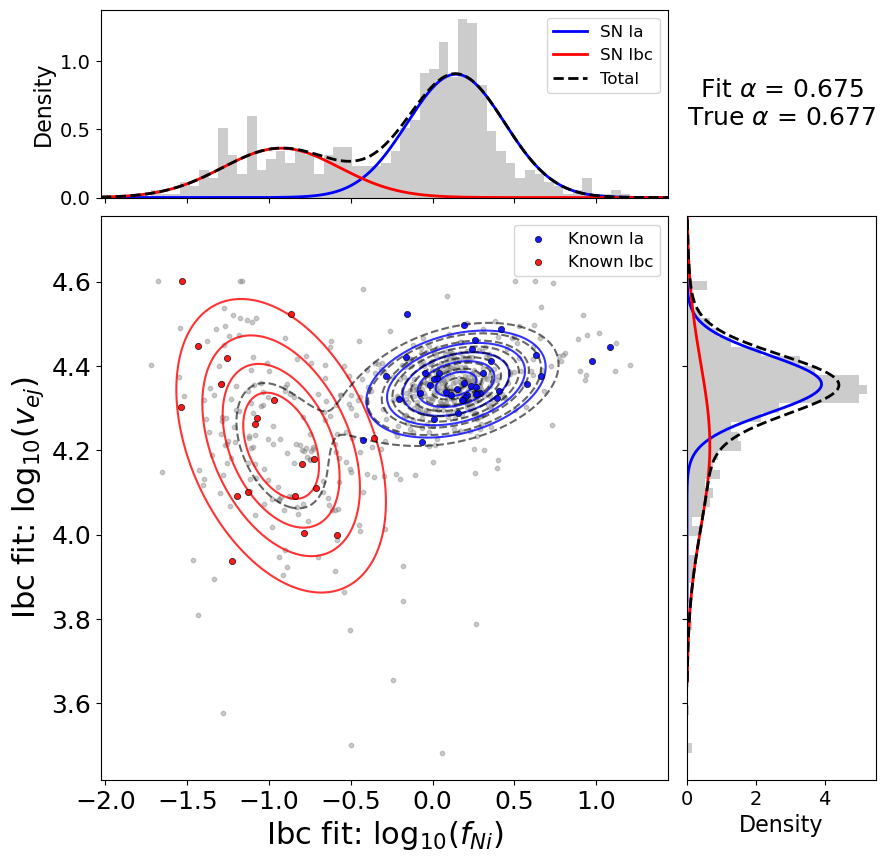

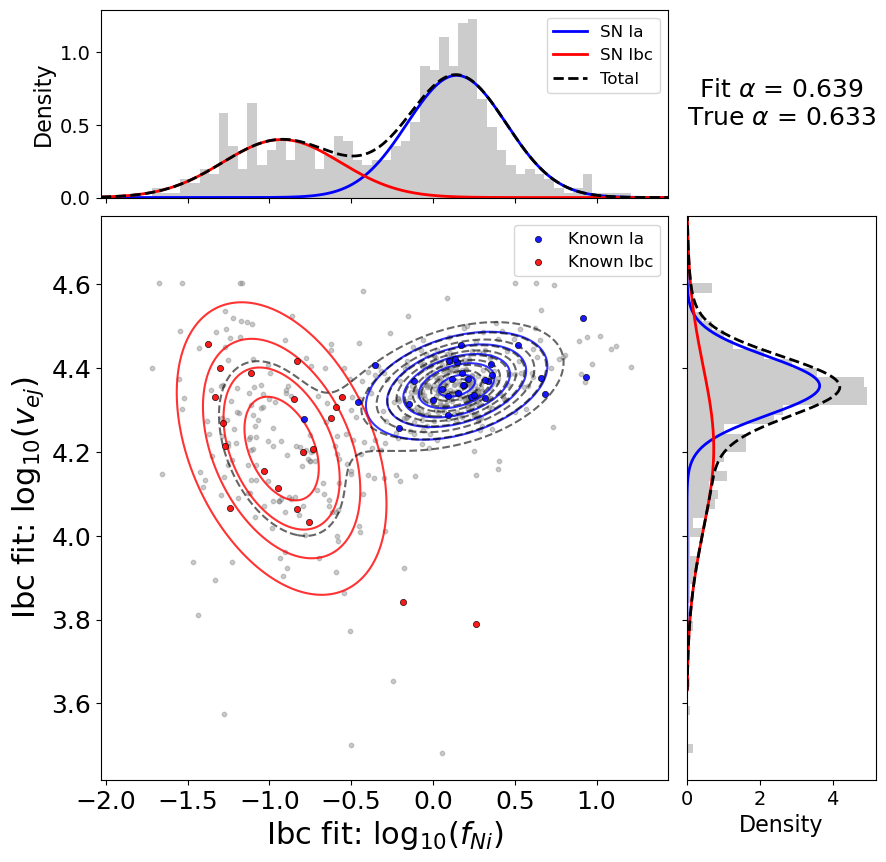

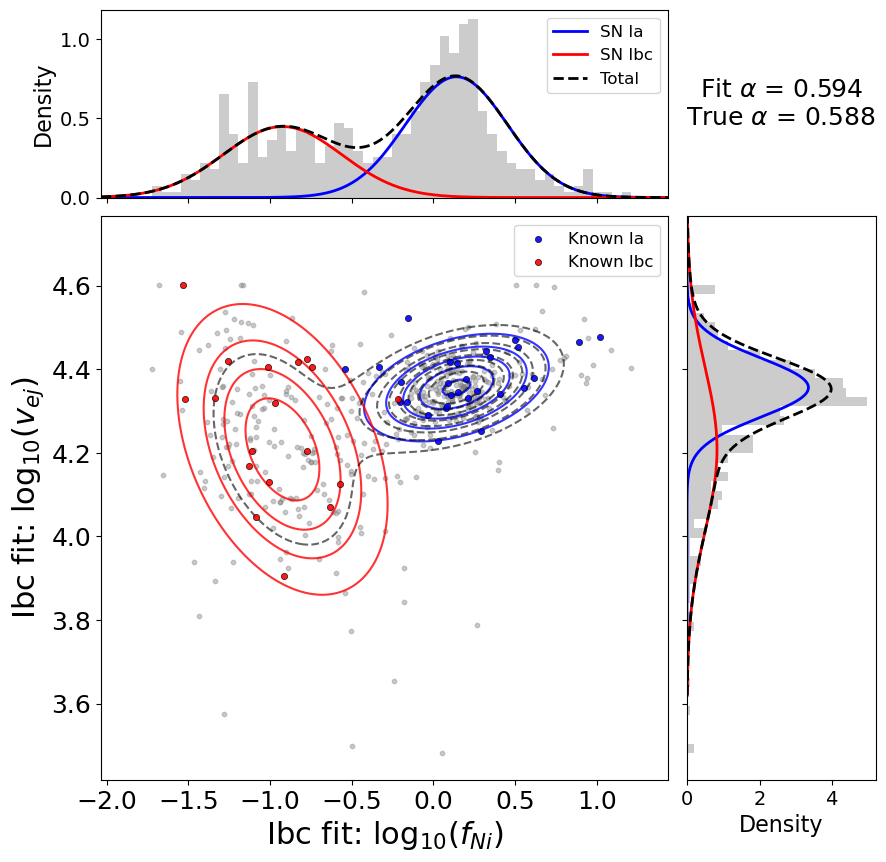

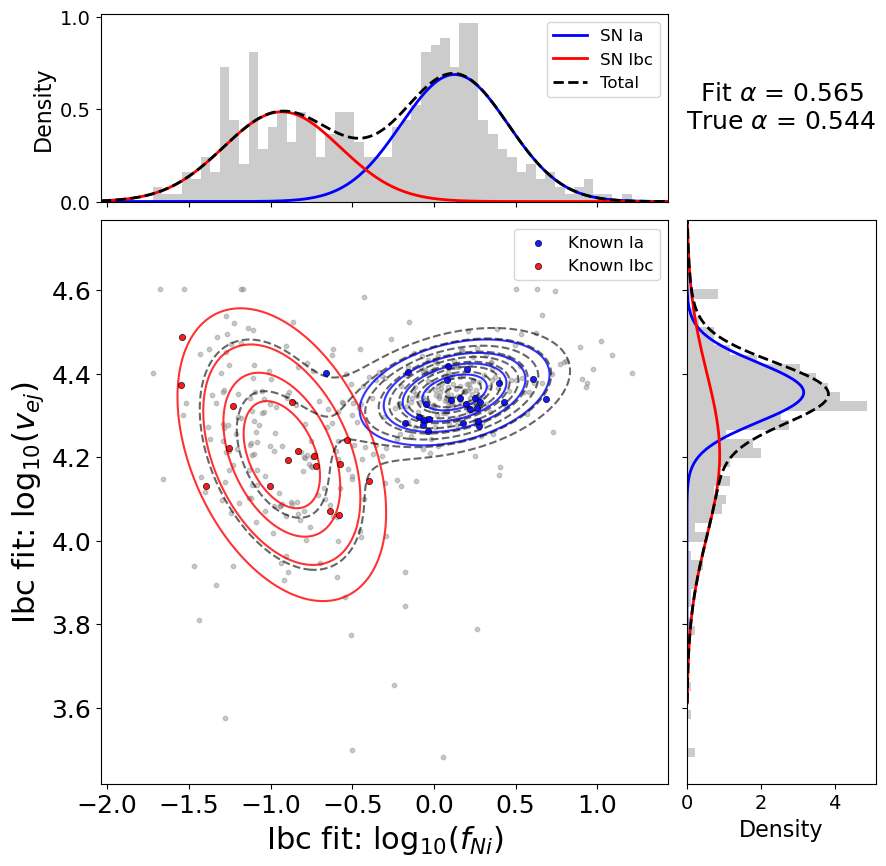

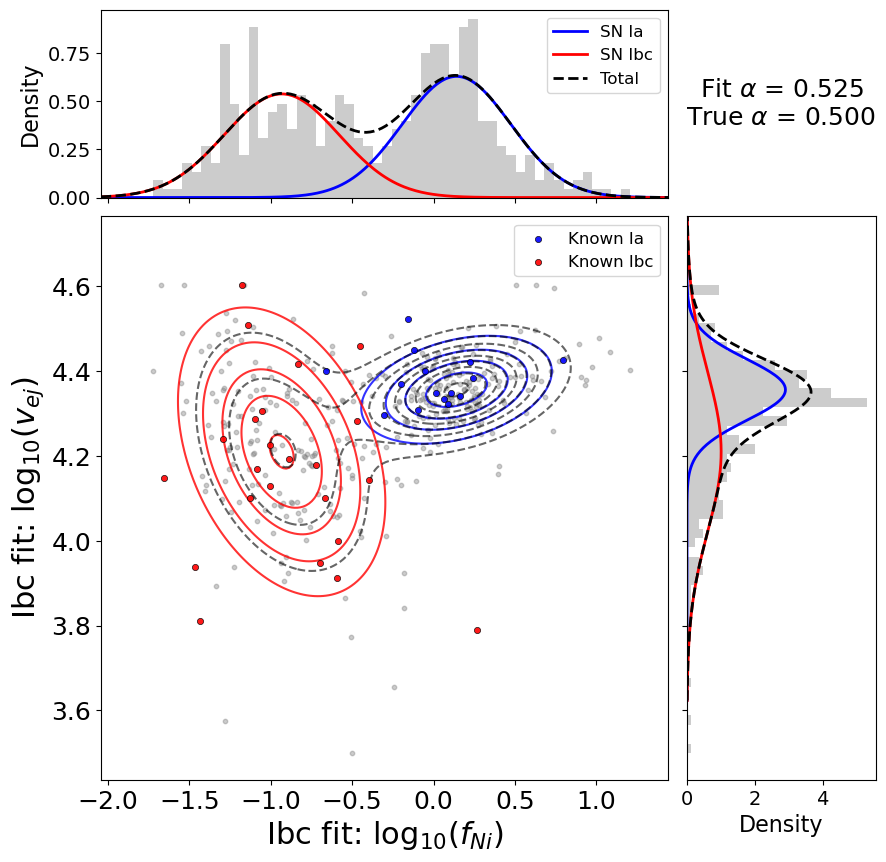


GMM fits (10% known): Photometric z


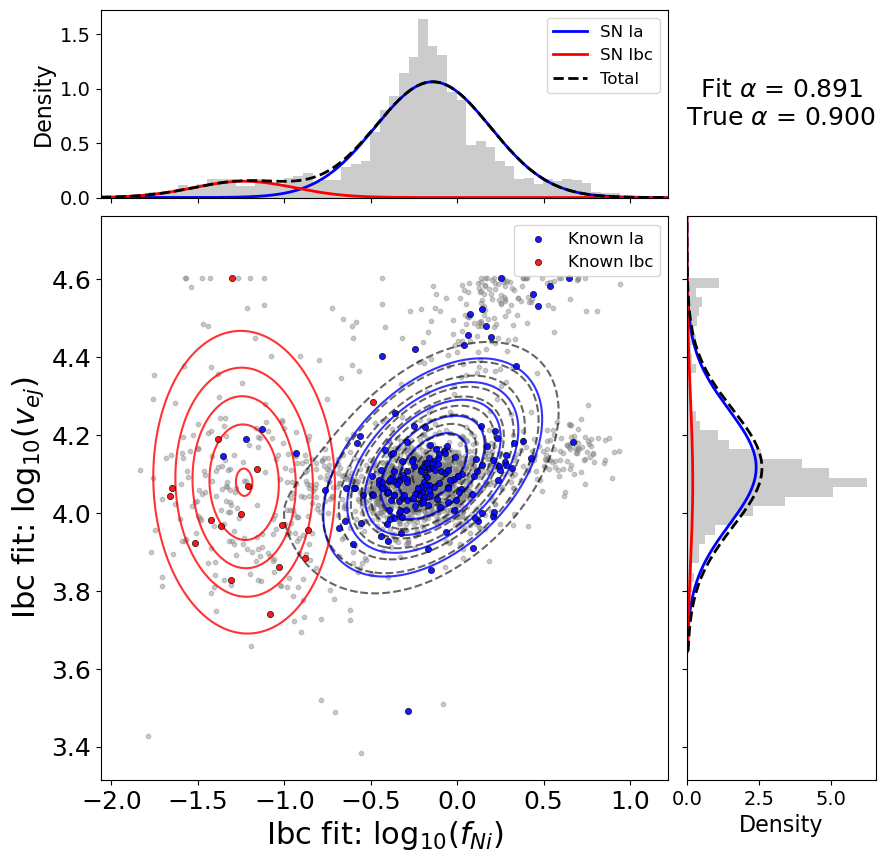

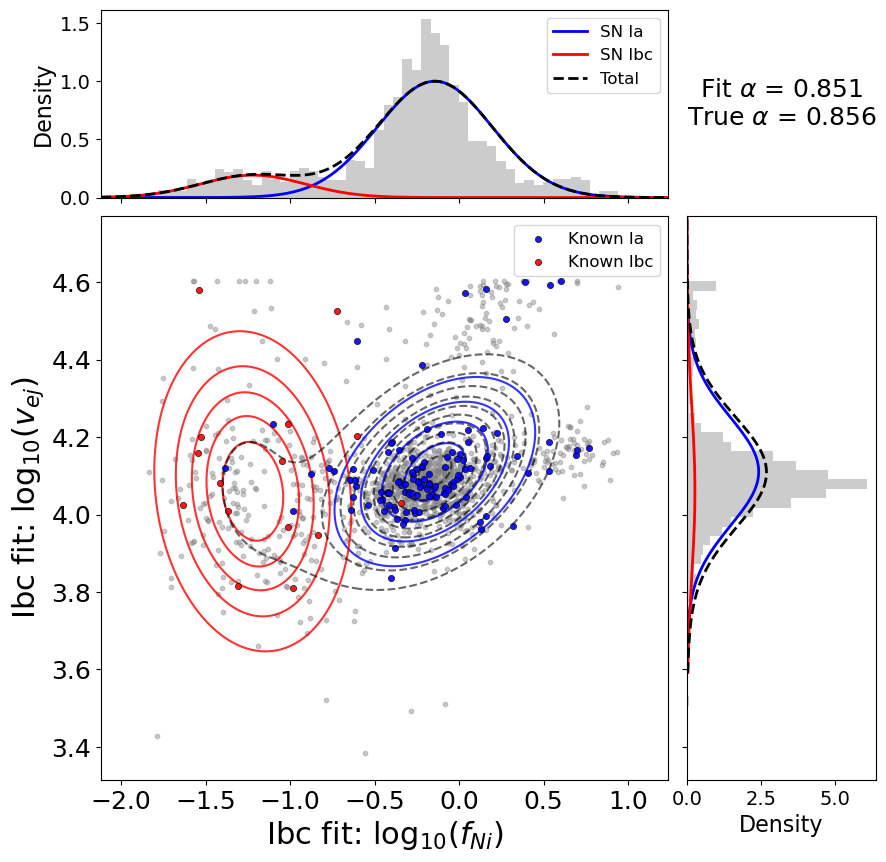

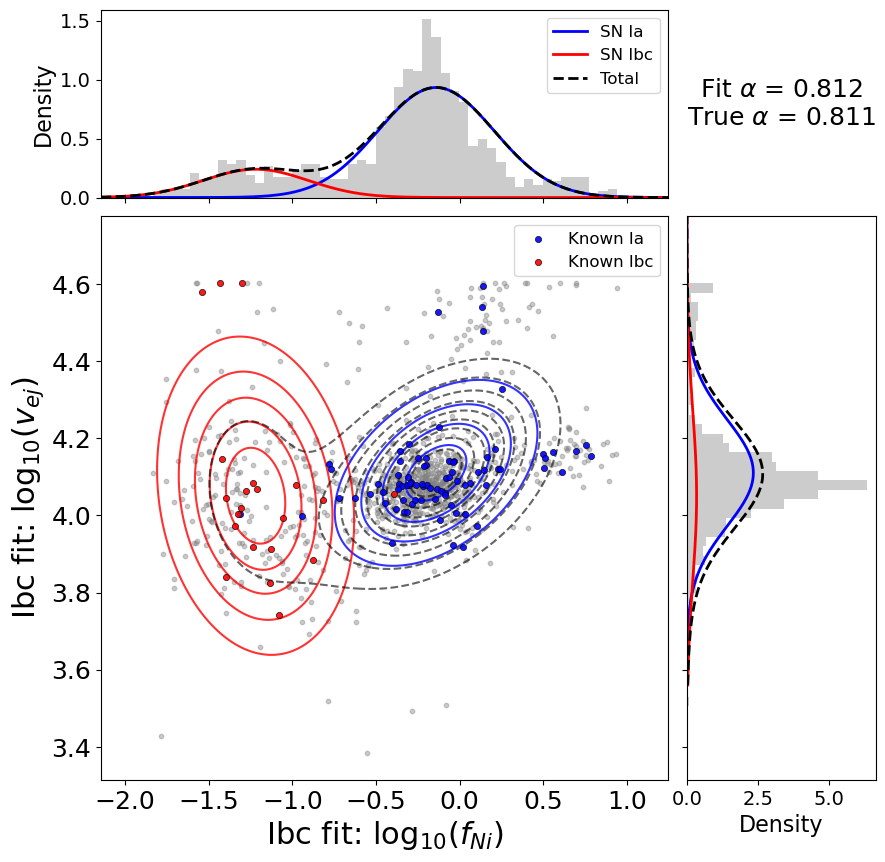

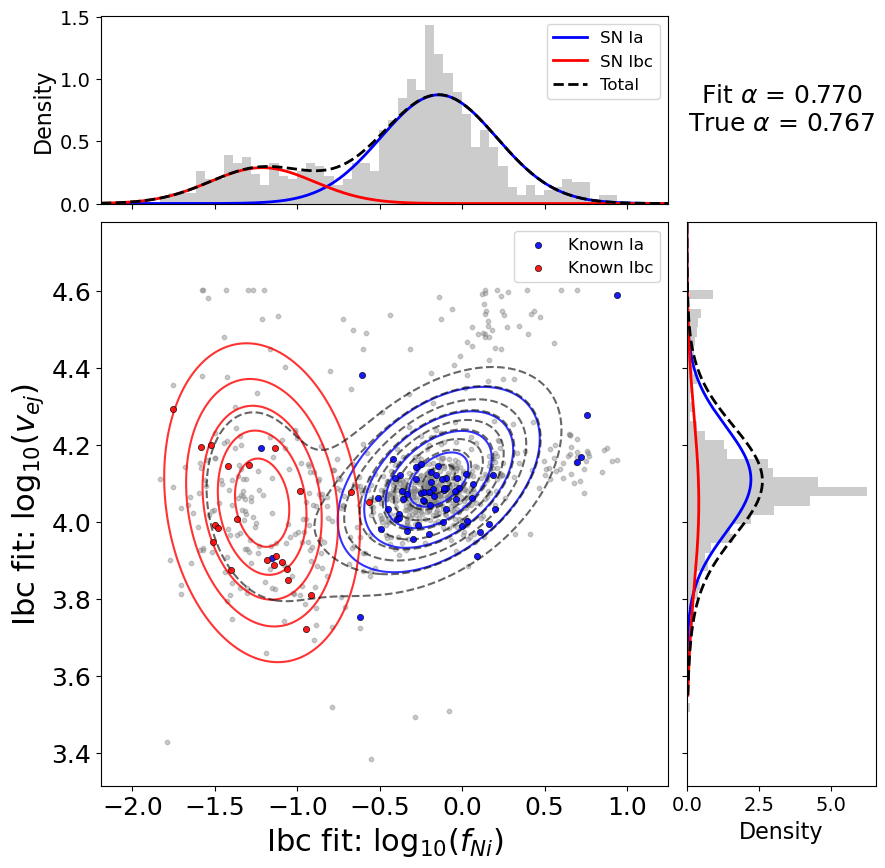

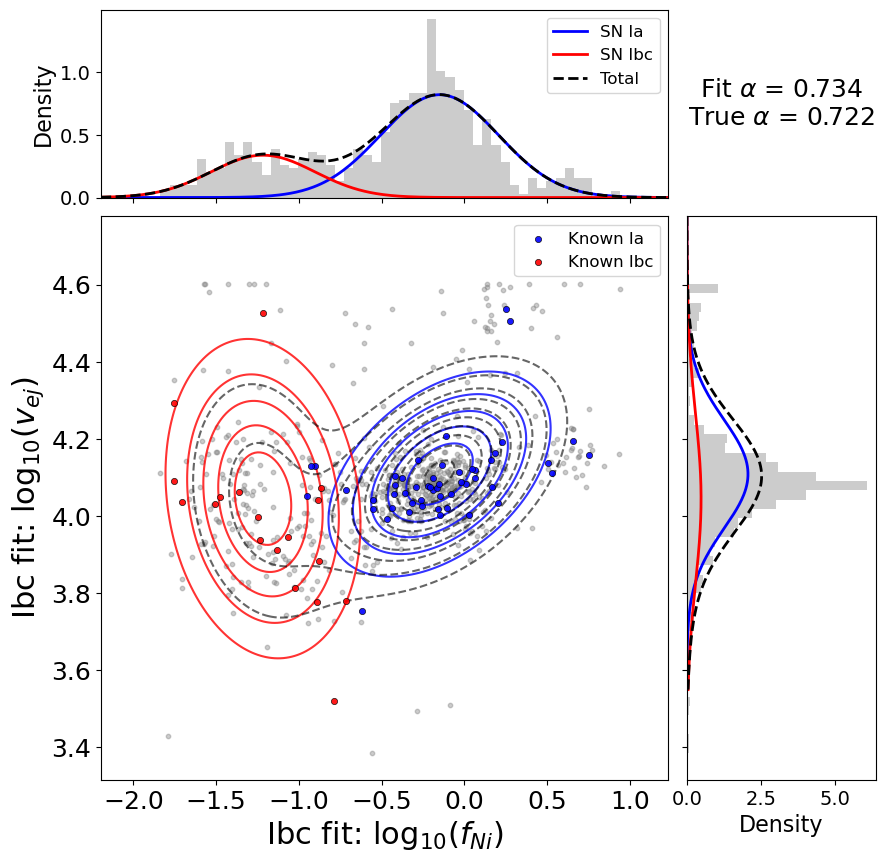

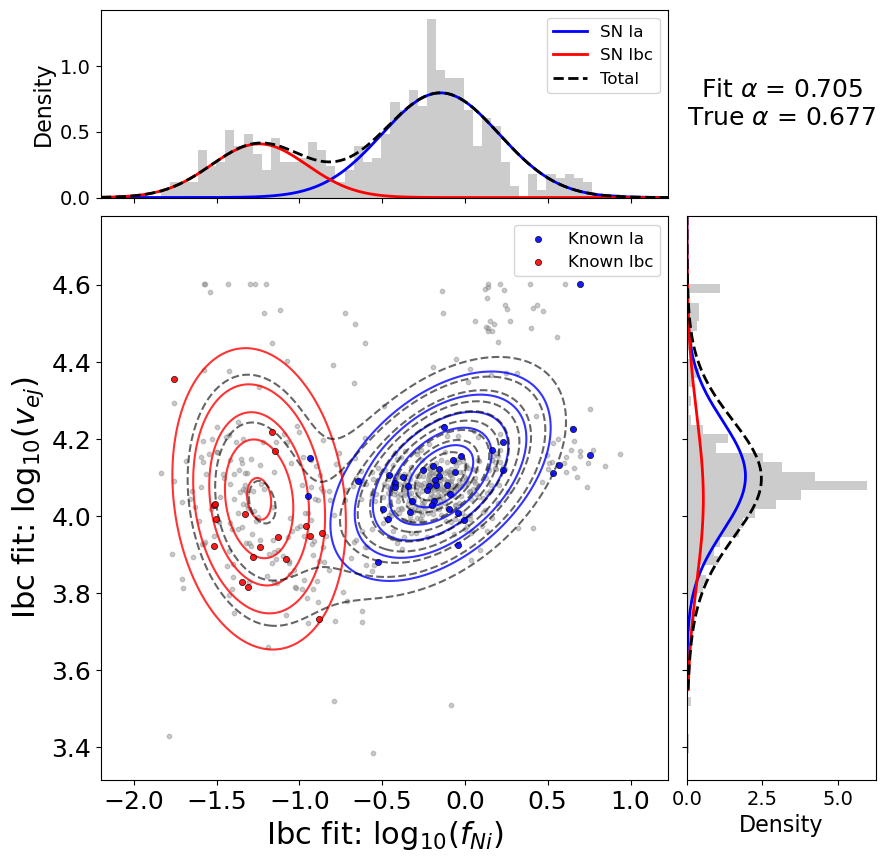

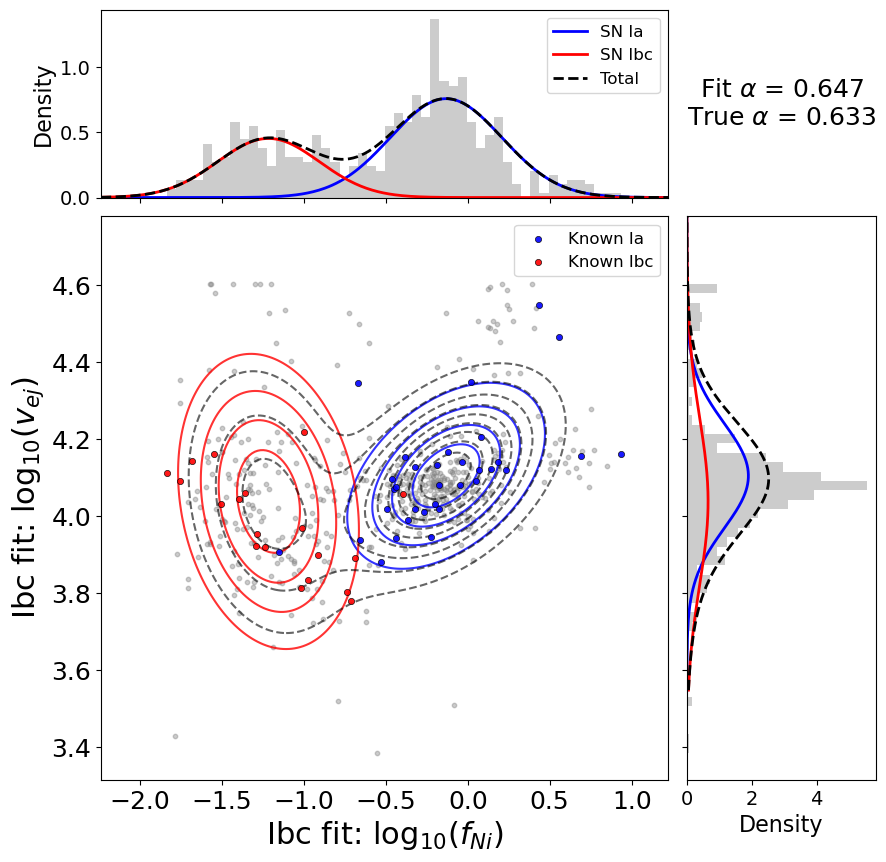

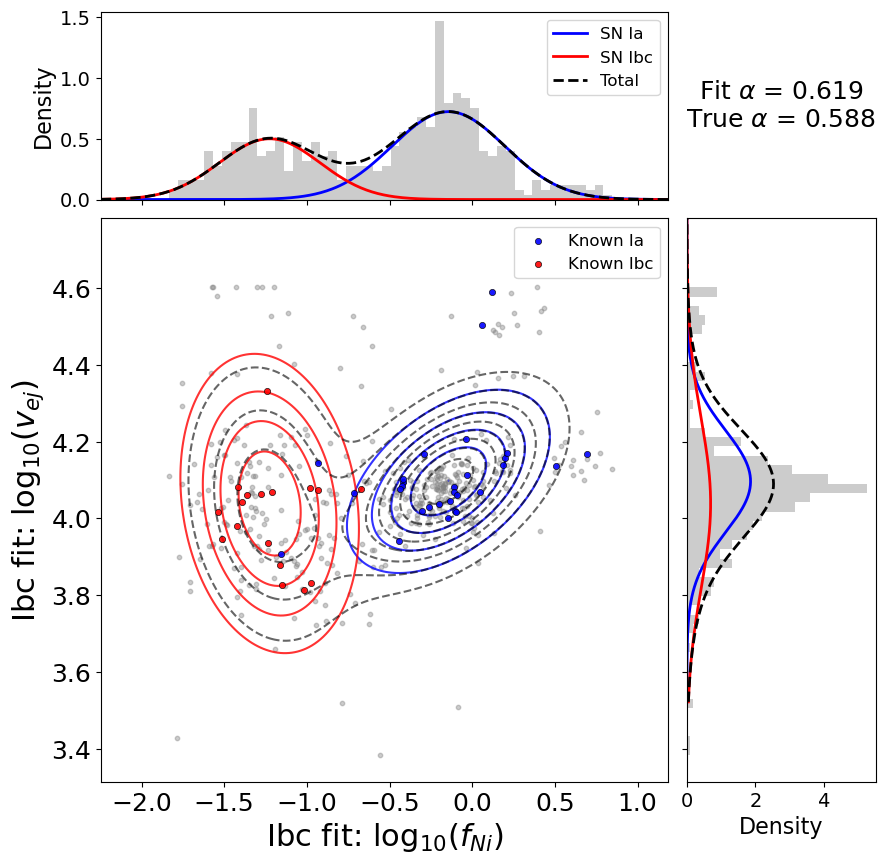

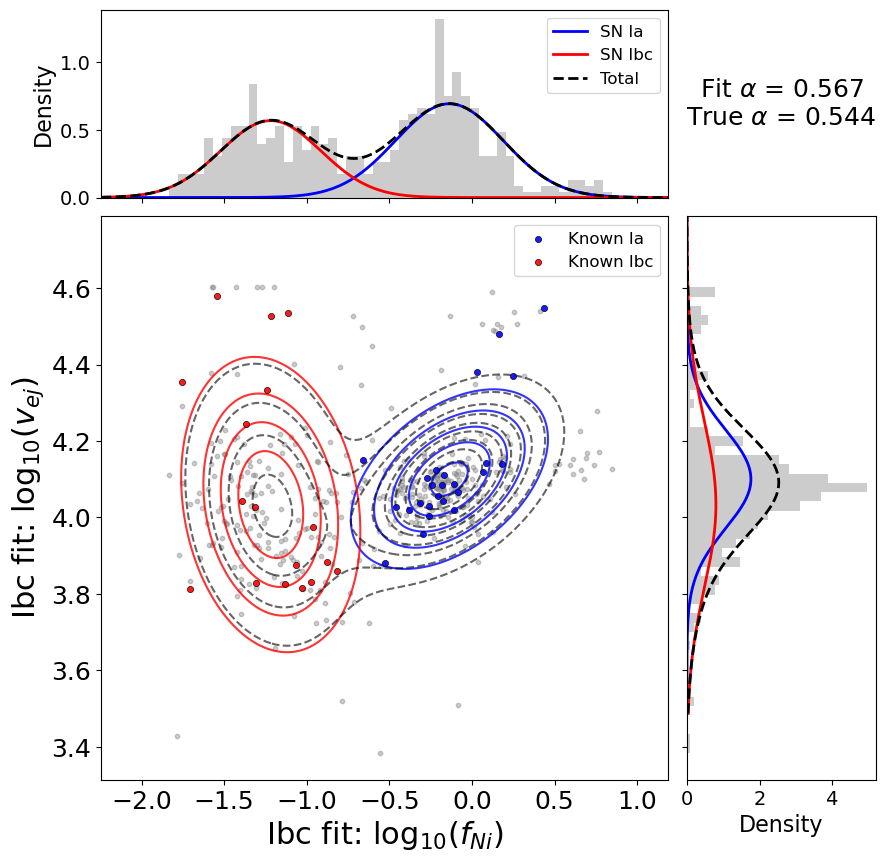

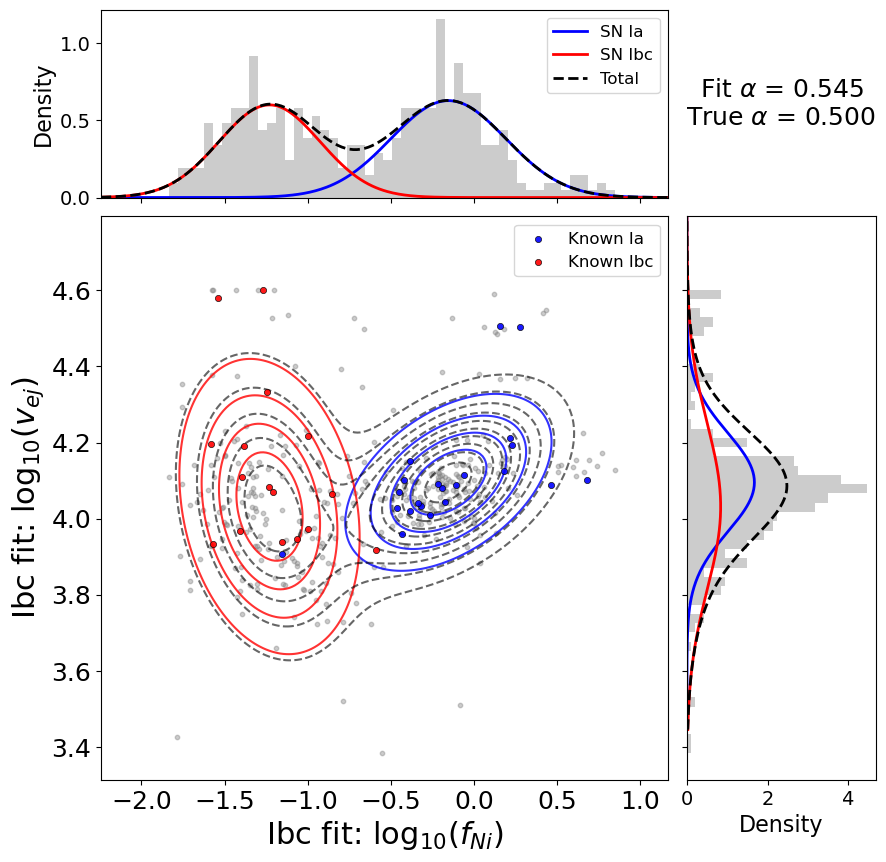


GMM fits (10% known): No z


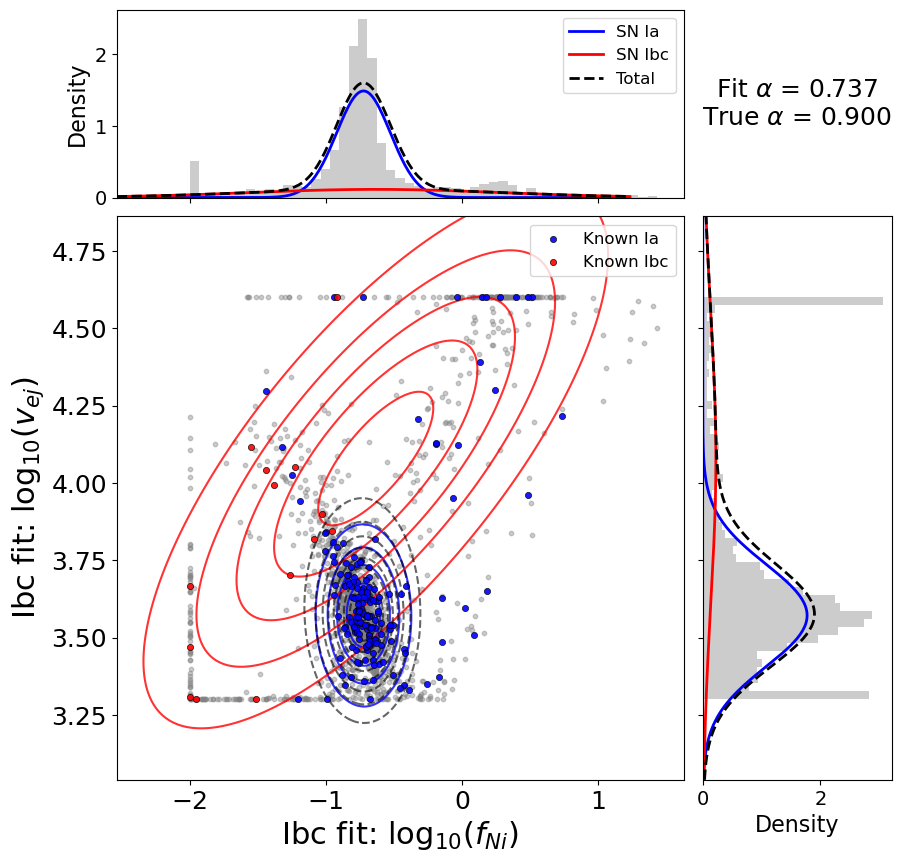

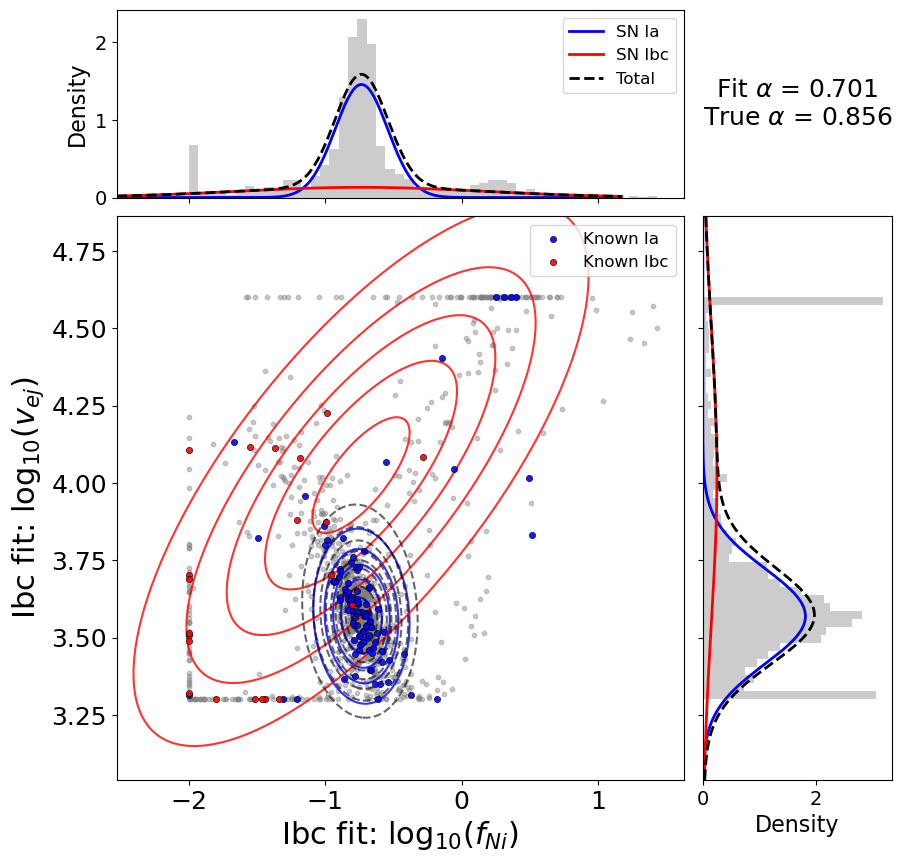

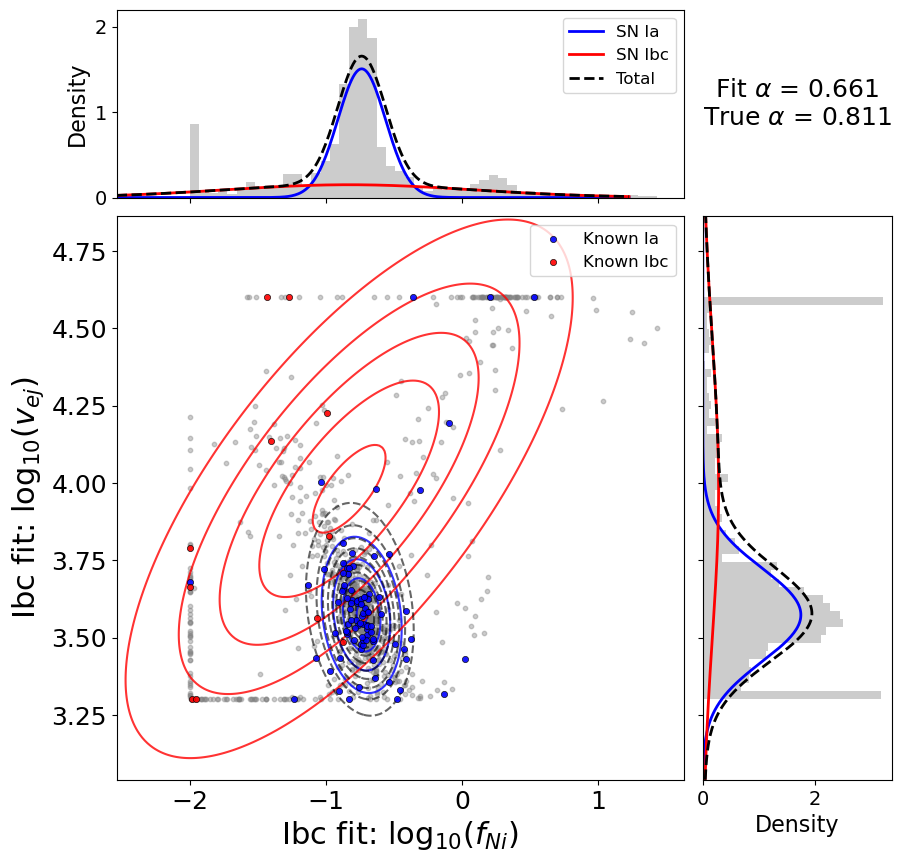

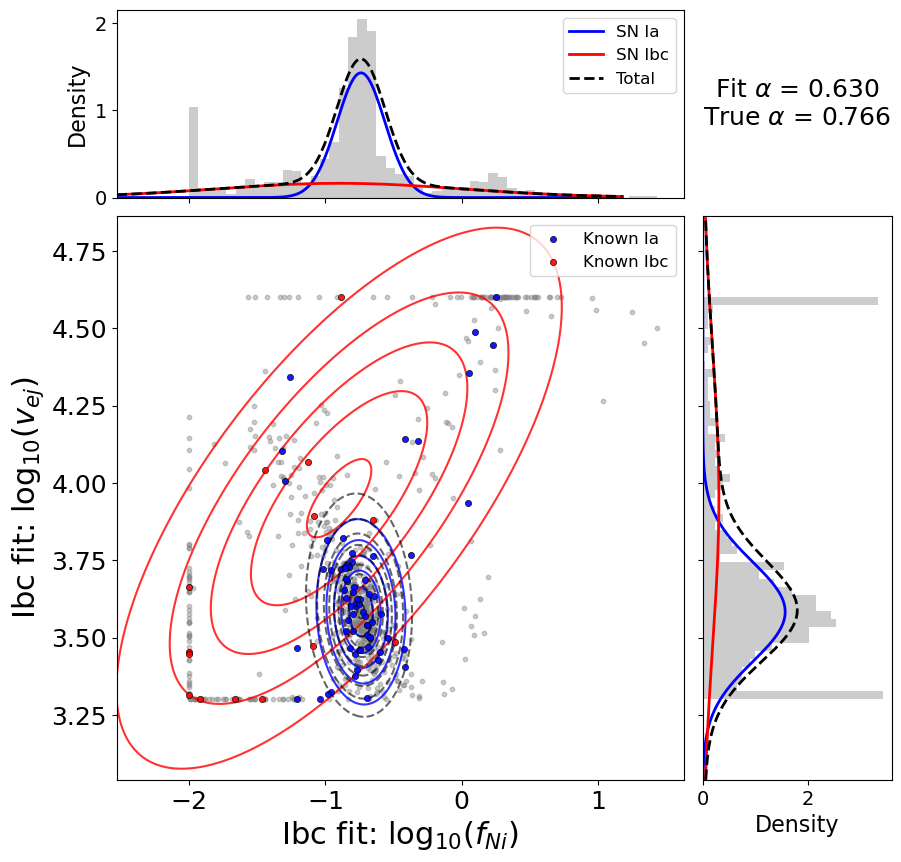

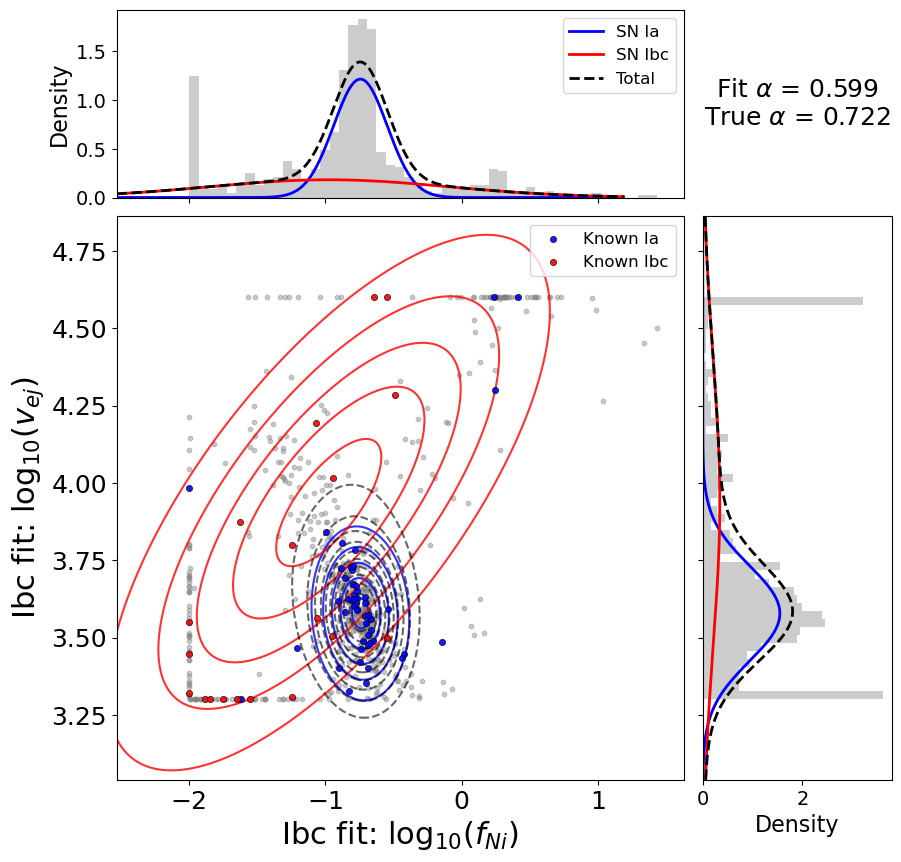

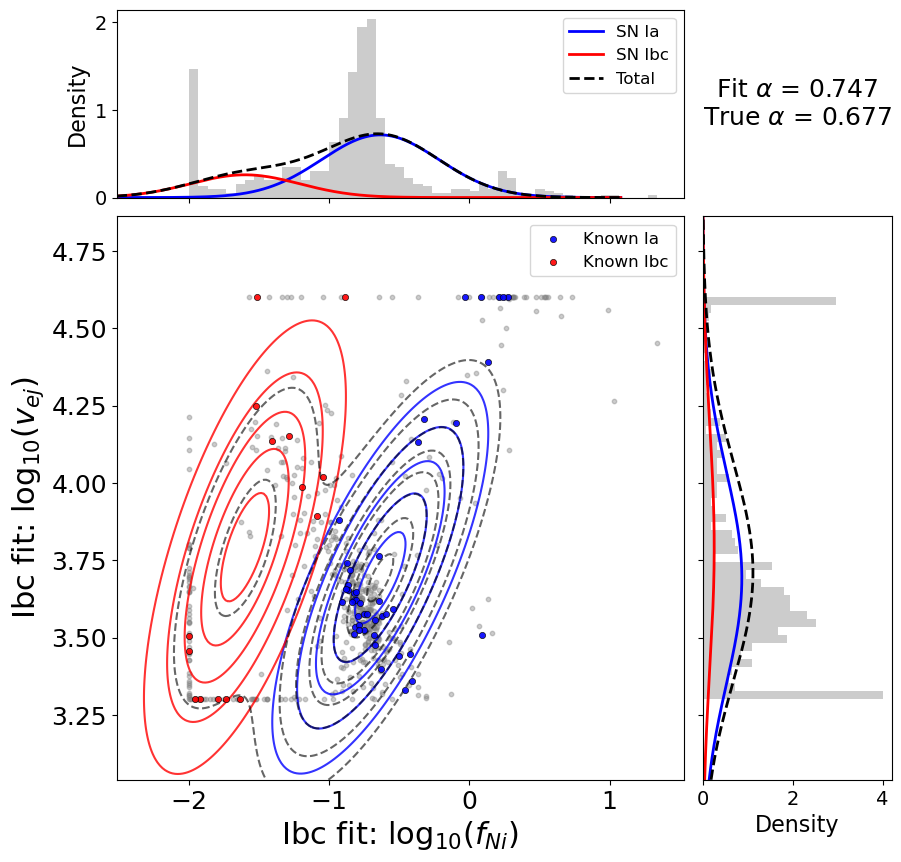

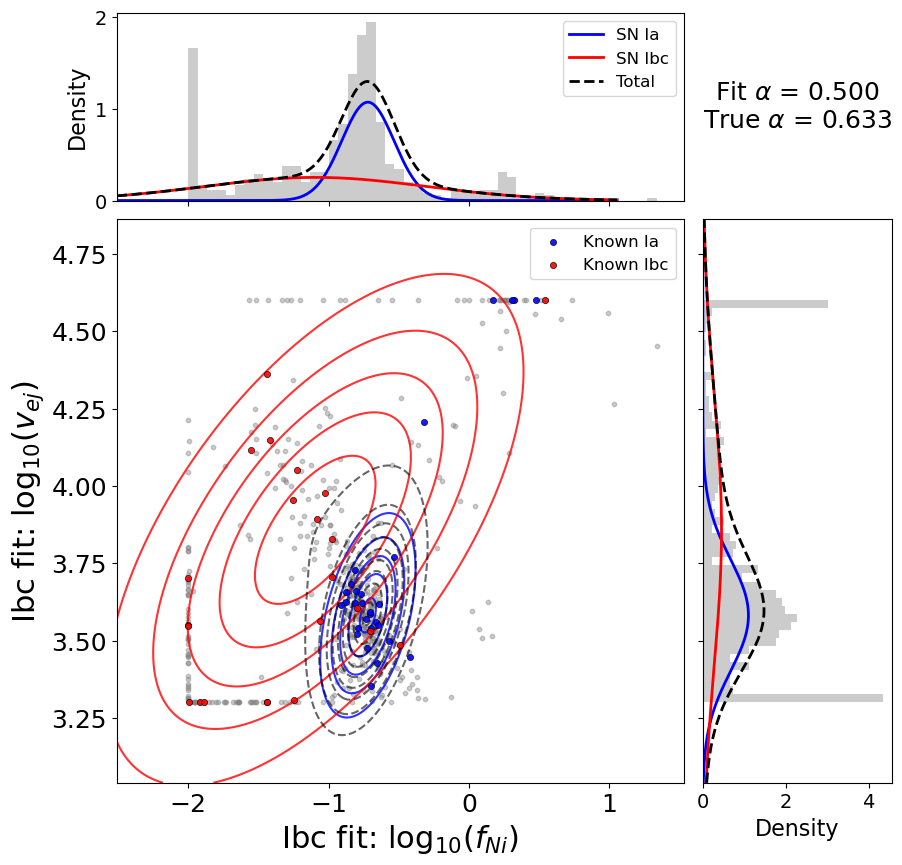

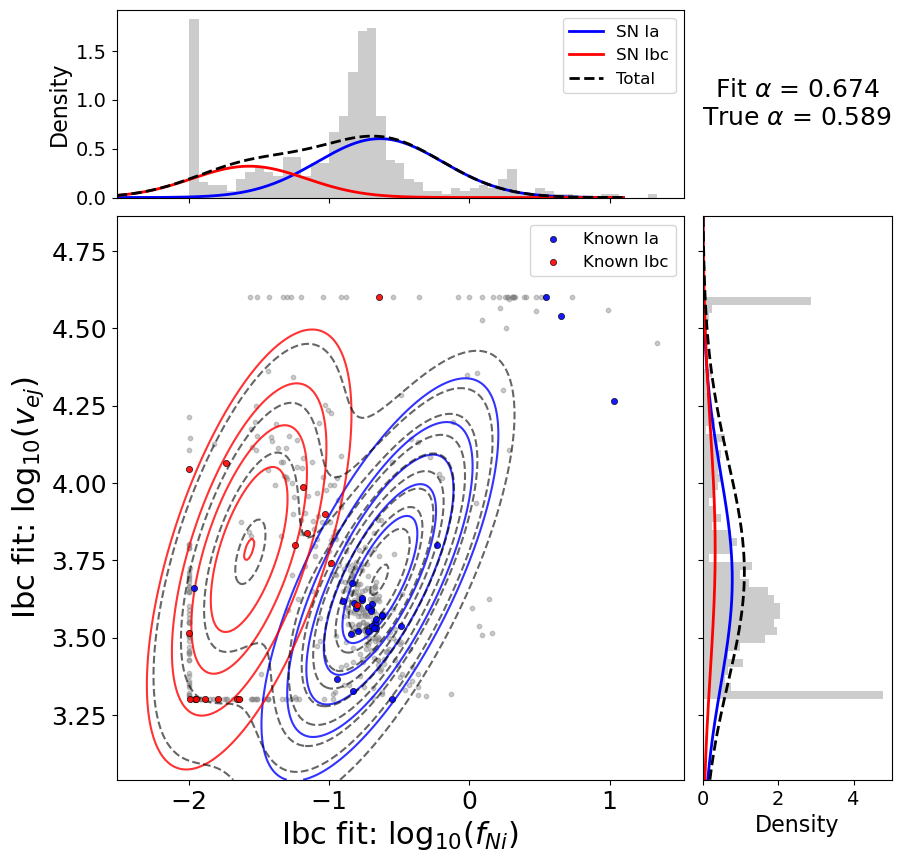

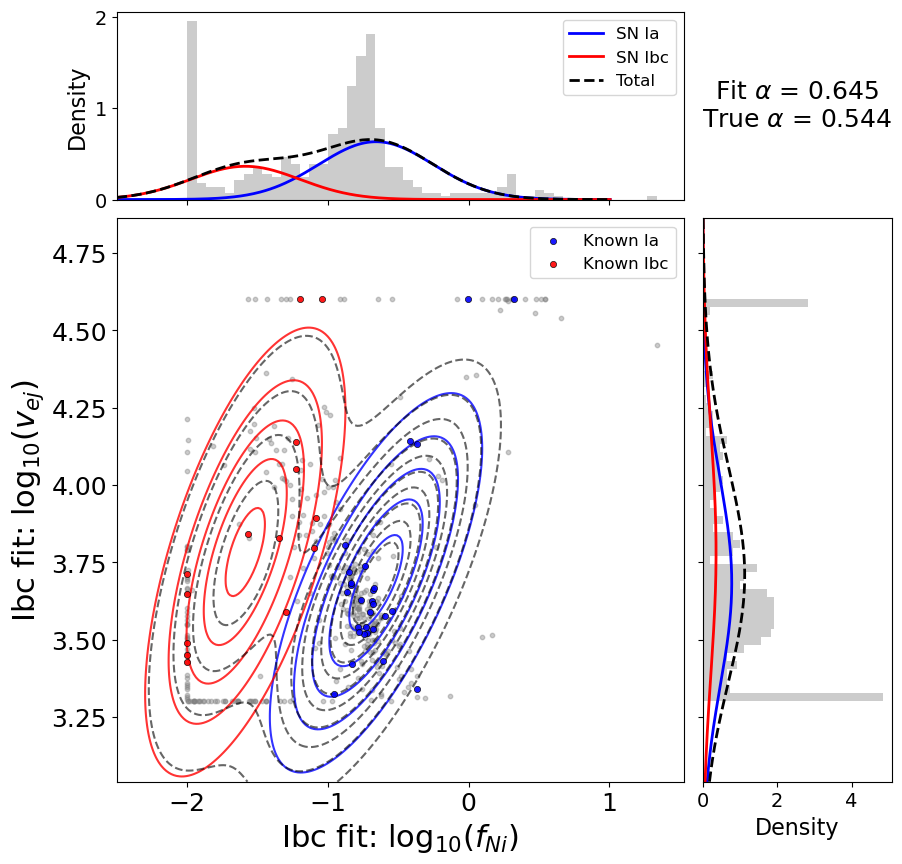

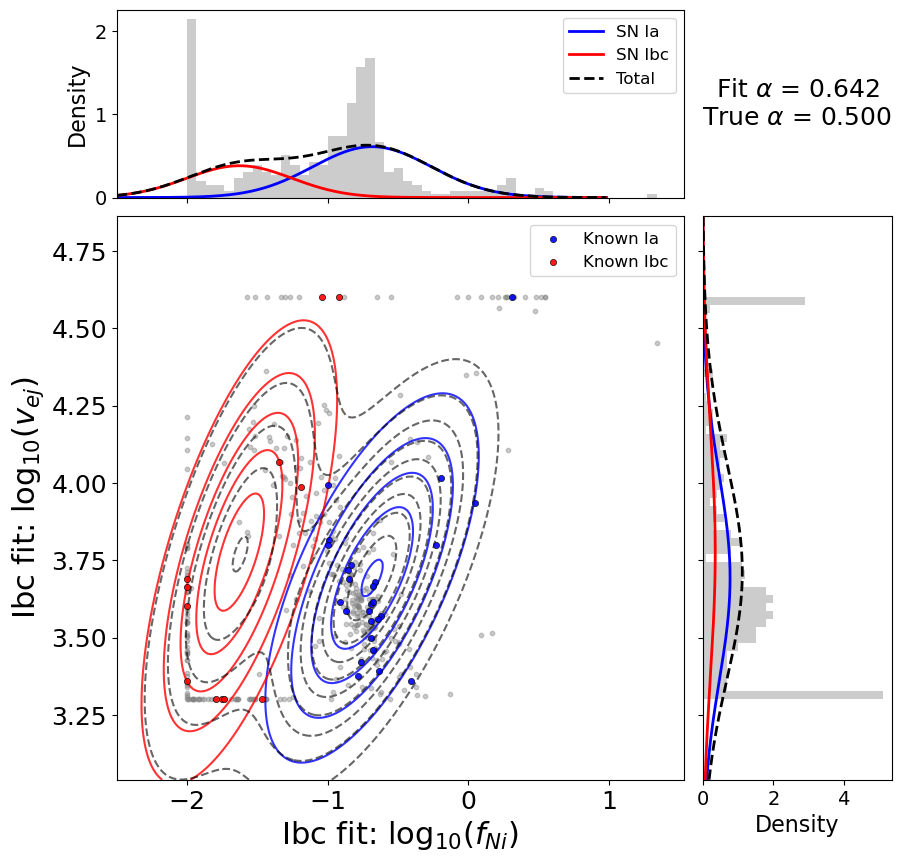

In [47]:
# GMM fit visualizations for each dataset (10% known)
for key, ds in datasets.items():
    print(f"\nGMM fits (10% known): {ds['label']}")
    fig, axes = plot_2d_gmm_iterations_known(results_fixed[key]['best_iteration_results'])
    # fig.savefig(f"figures/redshift_comparison_gmm_fixed_{key}.pdf", bbox_inches='tight')
    plt.show()


## Unsupervised vs semi-supervised comparison

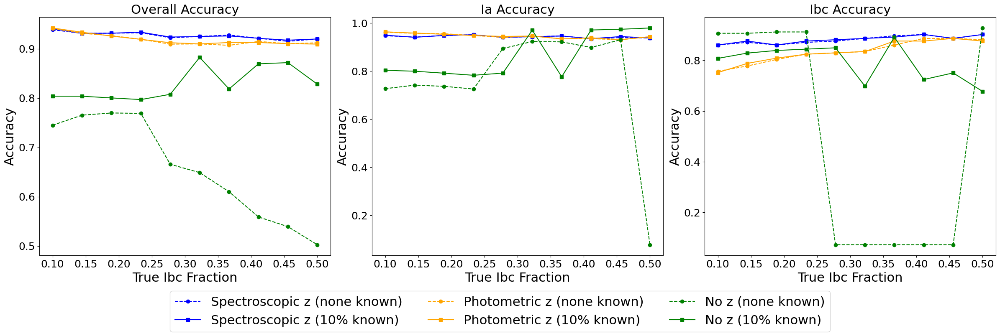

In [26]:
# Compare unsupervised vs 10% known for each dataset
acc_labels = ['Overall Accuracy', 'Ia Accuracy', 'Ibc Accuracy']
fig, axes = plt.subplots(1, 3, figsize=(24, 7))

for k in range(3):
    ax = axes[k]
    for key, ds in datasets.items():
        r_unsup = results[key]
        r_sup = results_fixed[key]
        ax.plot(ratios, r_unsup['accuracies_best'][k, :], marker='o', color=ds['color'],
                linestyle='--', label=f"{ds['label']} (none known)" if k == 0 else '_nolegend_')
        ax.plot(ratios, r_sup['accuracies_best'][k, :], marker='s', color=ds['color'],
                linestyle='-', label=f"{ds['label']} (10% known)" if k == 0 else '_nolegend_')
    ax.set_title(acc_labels[k], fontsize=titlefontsize)
    ax.set_xlabel("True Ibc Fraction", fontsize=22)
    ax.set_ylabel("Accuracy", fontsize=22)
    ax.tick_params(axis='both', labelsize=18)

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, fontsize=22, loc='lower center',
           bbox_to_anchor=(0.5, -0.12), ncol=len(handles)//2, borderaxespad=-0.5)

plt.tight_layout()
plt.savefig("figures/redshift_comparison_unsup_vs_sup.pdf", bbox_inches='tight')
plt.show()

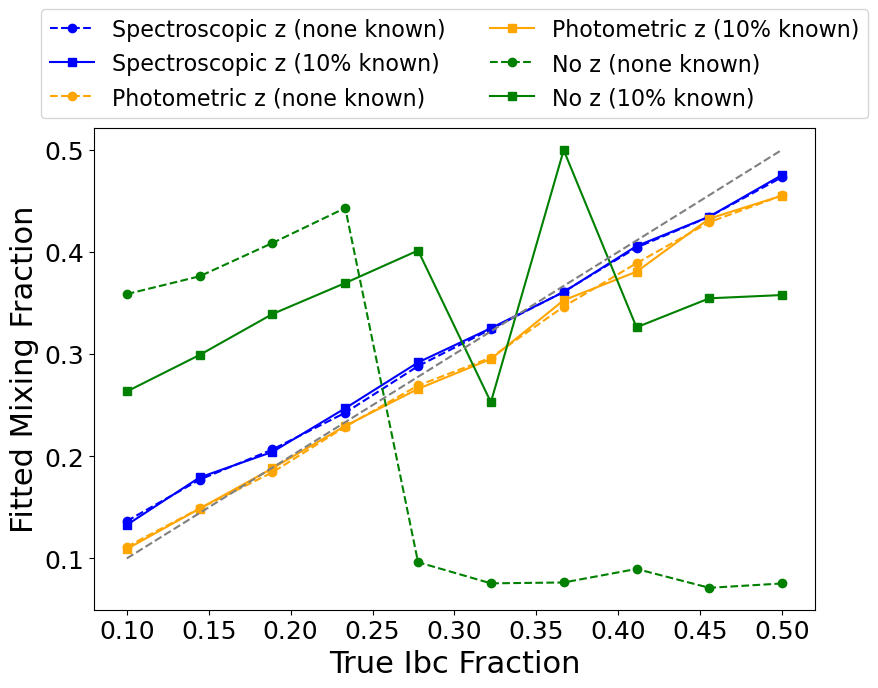

In [27]:
# Compare alpha vs true Ibc fraction for unsupervised vs 10% known
fig, ax = plt.subplots(figsize=(9, 7))
for key, ds in datasets.items():
    r_unsup = results[key]
    r_sup = results_fixed[key]
    alphas_unsup = [i if i <= 0.5 else 1 - i for i in r_unsup['alphas_best']]
    alphas_sup = [i if i <= 0.5 else 1 - i for i in r_sup['alphas_best']]
    ax.plot(ratios, alphas_unsup, marker='o', color=ds['color'], linestyle='--',
             label=f"{ds['label']} (none known)")
    ax.plot(ratios, alphas_sup, marker='s', color=ds['color'], linestyle='-',
             label=f"{ds['label']} (10% known)")
ax.plot(ratios, ratios, linestyle='--', color='gray')
ax.set_xlabel("True Ibc Fraction", fontsize=22)
ax.set_ylabel("Fitted Mixing Fraction", fontsize=22)
ax.tick_params(axis='both', labelsize=18)
ax.legend(fontsize=16, loc='lower center', bbox_to_anchor=(0.5, 1.02),
          ncol=2, borderaxespad=0.)
plt.tight_layout()
plt.savefig("figures/redshift_comparison_alpha_unsup_vs_sup.pdf", bbox_inches='tight')
plt.show()


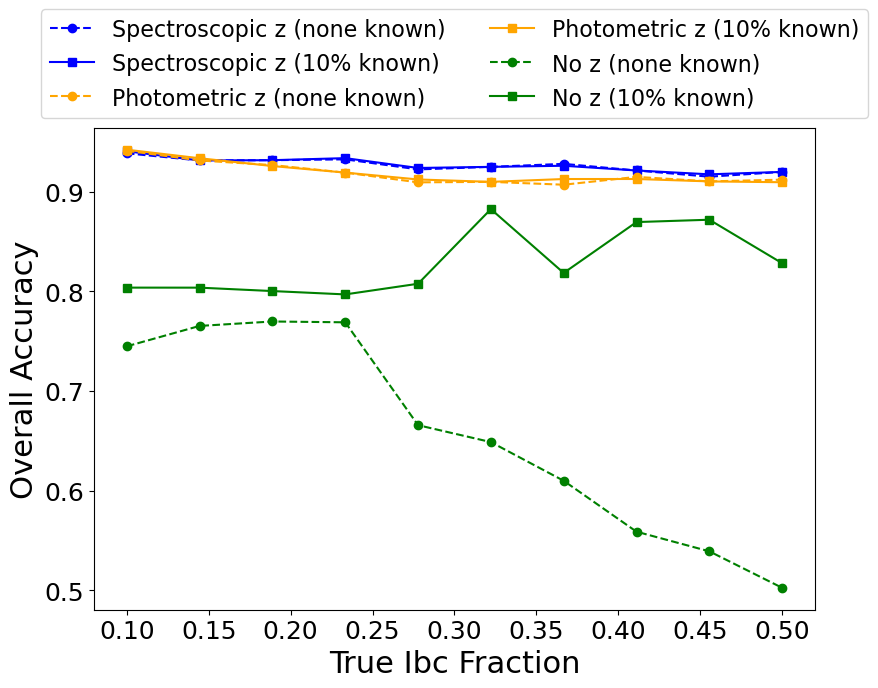

In [28]:
# Compare alpha vs true Ibc fraction for unsupervised vs 10% known
fig, ax = plt.subplots(figsize=(9, 7))
for key, ds in datasets.items():
    r_unsup = results[key]
    r_sup = results_fixed[key]
    ax.plot(ratios, r_unsup['accuracies_best'][0,:], marker='o', color=ds['color'], linestyle='--',
             label=f"{ds['label']} (none known)")
    ax.plot(ratios, r_sup['accuracies_best'][0,:], marker='s', color=ds['color'], linestyle='-',
             label=f"{ds['label']} (10% known)")
ax.set_xlabel("True Ibc Fraction", fontsize=22)
ax.set_ylabel("Overall Accuracy", fontsize=22)
ax.tick_params(axis='both', labelsize=18)
ax.legend(fontsize=16, loc='lower center', bbox_to_anchor=(0.5, 1.02),
          ncol=2, borderaxespad=0.)
plt.tight_layout()
plt.savefig("figures/redshift_comparison_accuracy_unsup_vs_sup.pdf", bbox_inches='tight')
plt.show()


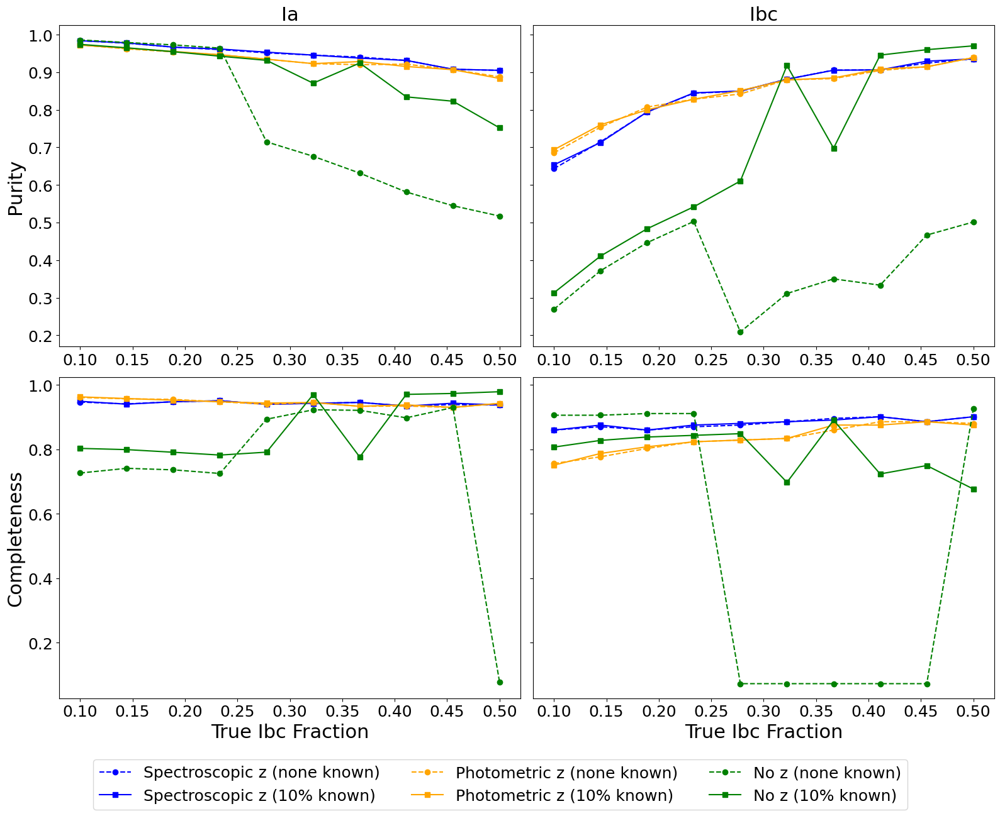

In [29]:
# Combined purity and completeness: unsupervised vs 10% known
fig, axes = plt.subplots(2, 2, figsize=(16, 12), sharey='row')

for key, ds in datasets.items():
    r_unsup = results[key]
    r_sup = results_fixed[key]
    # Ia Purity
    axes[0, 0].plot(ratios, r_unsup['accuracies_best'][3, :], marker='o', color=ds['color'],
                    linestyle='--', label=f"{ds['label']} (none known)")
    axes[0, 0].plot(ratios, r_sup['accuracies_best'][3, :], marker='s', color=ds['color'],
                    linestyle='-', label=f"{ds['label']} (10% known)")
    # Ibc Purity
    axes[0, 1].plot(ratios, r_unsup['accuracies_best'][5, :], marker='o', color=ds['color'],
                    linestyle='--')
    axes[0, 1].plot(ratios, r_sup['accuracies_best'][5, :], marker='s', color=ds['color'],
                    linestyle='-')
    # Ia Completeness
    axes[1, 0].plot(ratios, r_unsup['accuracies_best'][4, :], marker='o', color=ds['color'],
                    linestyle='--')
    axes[1, 0].plot(ratios, r_sup['accuracies_best'][4, :], marker='s', color=ds['color'],
                    linestyle='-')
    # Ibc Completeness
    axes[1, 1].plot(ratios, r_unsup['accuracies_best'][6, :], marker='o', color=ds['color'],
                    linestyle='--')
    axes[1, 1].plot(ratios, r_sup['accuracies_best'][6, :], marker='s', color=ds['color'],
                    linestyle='-')

axes[0, 0].set_title('Ia', fontsize=titlefontsize)
axes[0, 1].set_title('Ibc', fontsize=titlefontsize)
axes[0, 0].set_ylabel('Purity', fontsize=22)
axes[1, 0].set_ylabel('Completeness', fontsize=22)
for ax in axes[1, :]:
    ax.set_xlabel("True Ibc Fraction", fontsize=22)
for ax in axes.flat:
    ax.tick_params(axis='both', labelsize=18)

handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, fontsize=18, loc='lower center',
           bbox_to_anchor=(0.5, -0.12), ncol=3, borderaxespad=2.)
plt.tight_layout()
plt.savefig("figures/redshift_comparison_purity_sup_unsup.pdf", bbox_inches='tight')
plt.show()

10 most ambiguous SNe:
 Index  gamma_a  gamma_b   True class
   206   0.5040   0.4960        SN Ib
   208   0.4663   0.5337        SN Ic
   373   0.5891   0.4109        SN Ic
   303   0.5892   0.4108        SN Ic
    60   0.6229   0.3771        SN Ia
   367   0.6294   0.3706        SN Ib
   375   0.6425   0.3575        SN Ib
   328   0.3479   0.6521       SN Ibc
   222   0.6636   0.3364        SN Ic
    82   0.3334   0.6666        SN Ia


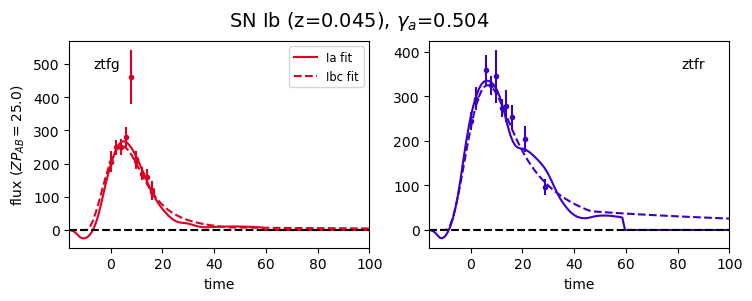

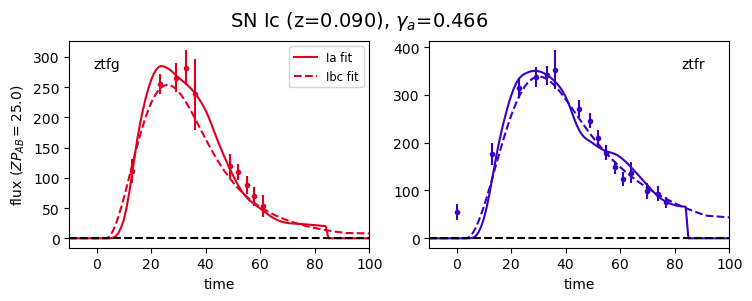

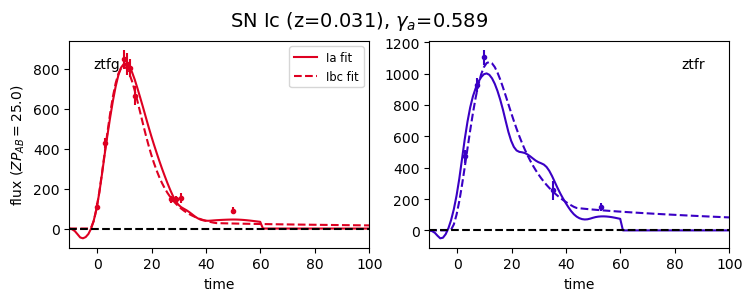

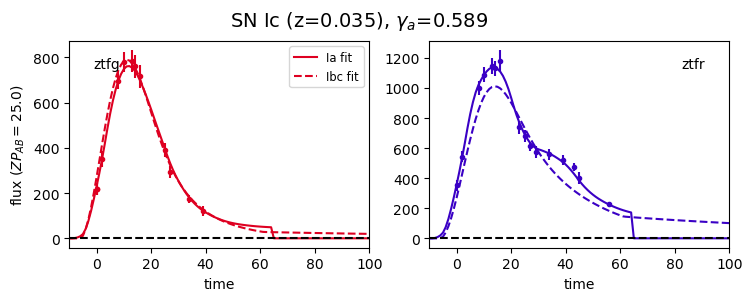

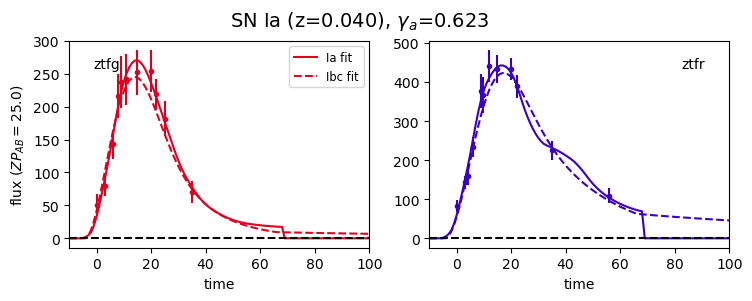

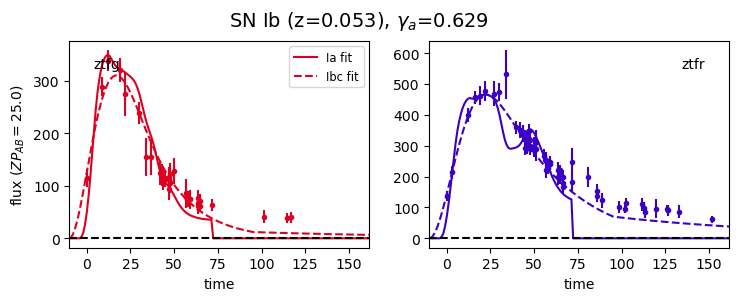

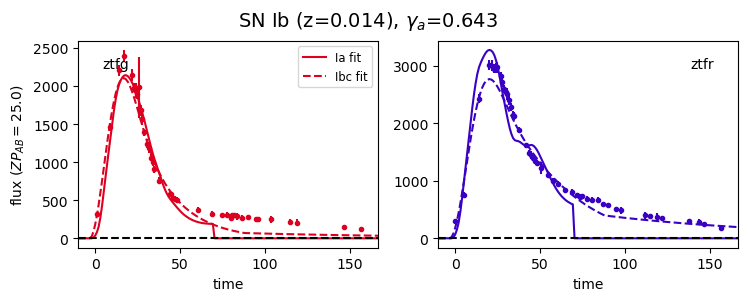

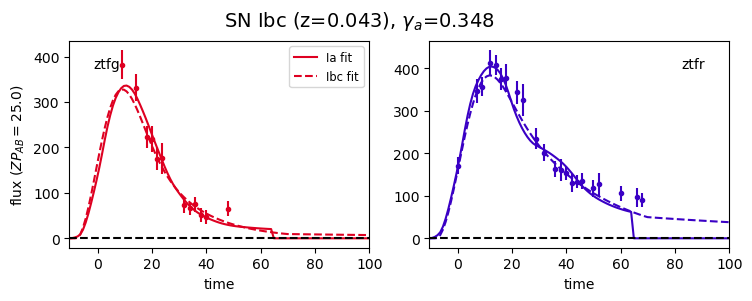

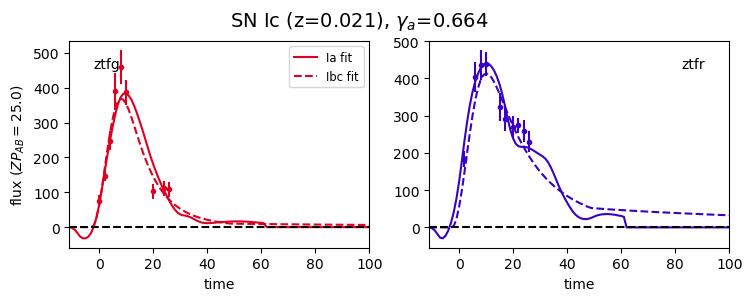

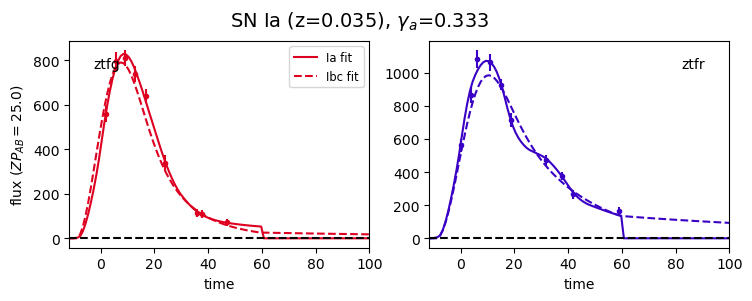

In [30]:
# Find and plot the 10 most ambiguous SNe (gamma closest to 0.5)
# Using photometric dataset, unsupervised, 0.5 mixing ratio (last index)
import sncosmo
import astropy.units as u
import astropy.constants as co
import astropy.cosmology.units as cu
from astropy.cosmology import Planck18 as cosmo
from scipy.integrate import cumulative_trapezoid as cumtrapz
from scipy.interpolate import CubicSpline

STEF_CONST = 4 * np.pi * co.sigma_sb

# --- ArnettSource (needed to reconstruct Ibc model fits) ---
class ArnettSource(sncosmo.Source):
    _param_names = ['redshift', 'texp', 'mej', 'fni', 'vej']
    param_names = ['redshift', 'texp', 'mej', 'fni', 'vej']
    param_names_latex = ['z', 't_{exp}', 'M_{ej}', 'f_{Ni}', 'v_{ej}']

    def __init__(self, phase, wave, params=None, name=None, version=None):
        self.name = name
        self.version = version
        self._phase = phase
        self._wave = wave
        self._tfloor = 3000 * u.K
        if params is not None:
            self._parameters = params
        else:
            self._parameters = [0, 0, 0, 0, 0]

    def _blackbody_flux(self, temperature, radius, wavelength):
        all_fluxes = np.zeros((len(temperature), len(wavelength))) * (u.erg / (u.s * u.AA)).decompose()
        for i in range(len(temperature)):
            temp = temperature[i]
            rad = radius[i]
            numerator = (2 * co.h * co.c**2 / wavelength**5).decompose()
            exponent = (co.h * co.c / (wavelength * co.k_B * temp)).decompose()
            denominator = np.exp(exponent.value) - 1
            flux_density = numerator / denominator
            flux_final = flux_density * (4 * np.pi * rad**2)
            all_fluxes[i, :] = flux_final
        return all_fluxes

    def _gen_arnett_model(self, t, wvs, theta):
        z, texp, mej, fni, vej = theta
        mej = (mej * u.Msun).to(u.g)
        vej = vej * u.km/u.s
        t = t * u.day
        wvs = wvs * u.AA
        tfloor = self._tfloor
        mni = mej * fni
        vej = vej.to(u.cm / u.s)
        tni = 8.8 * u.day
        tco = 111.3 * u.day
        epco = 6.8e9 * u.erg / u.g / u.s
        epni = 3.9e10 * u.erg / u.g / u.s
        opac = 0.1 * u.cm * u.cm / u.g
        texp = texp * u.day
        td = np.sqrt(2 * opac * mej / (13.7 * co.c * vej)).to(u.day)
        t_to_integrate = np.linspace(0, np.max(t - texp), 1000)
        integrand1 = (t_to_integrate / td) * np.exp(t_to_integrate**2 / td**2 - t_to_integrate / tni)
        integrand2 = (t_to_integrate / td) * np.exp(t_to_integrate**2 / td**2 - t_to_integrate / tco)
        dense_luminosities = 2 * mni / (td) * np.exp(-t_to_integrate**2 / td**2) * \
              (((epni - epco) * cumtrapz(integrand1, t_to_integrate, initial=0) +
               epco * cumtrapz(integrand2, t_to_integrate, initial=0))) * u.day
        spline = CubicSpline(t_to_integrate, dense_luminosities, extrapolate=False)
        luminosities = spline(t - texp) * u.erg / u.s
        radius = (vej * ((t - texp) * ((t - texp) >= 0))).to(u.cm)
        temperature = ((luminosities / (STEF_CONST * radius**2))**0.25).to(u.K)
        temperature = np.maximum(temperature, tfloor)
        radius = np.sqrt(luminosities / (STEF_CONST * temperature**4))
        radius = radius.to(u.cm)
        fluxes = self._blackbody_flux(temperature, radius, wvs / (1 + z))
        fluxes[t < texp, :] = 0. * u.kg * u.m / u.s**3
        fluxes[np.isnan(fluxes)] = 0. * u.kg * u.m / u.s**3
        z = z * cu.redshift
        d_cm = z.to(u.cm, cu.redshift_distance(cosmo, kind="luminosity"))
        flux_density = fluxes / (4 * np.pi * d_cm**2)
        return flux_density / (1 + z.value)

    def _flux(self, phase, wave):
        return self._gen_arnett_model(phase, wave, self._parameters)

# --- Model reconstruction functions ---
times_grid = np.linspace(0.1, 100, 100)
wavelengths_grid = np.linspace(2000, 12000, 10)

def reconstruct_ia_model(sn):
    ia_source = sncosmo.get_source('salt2-extended', version='2.0')
    dust = sncosmo.CCM89Dust()
    model = sncosmo.Model(source=ia_source, effects=[dust],
                          effect_names=['mw'], effect_frames=['obs'])
    model.set(z=sn.ia_fit['z'], t0=sn.ia_fit['t0'],
              x0=sn.ia_fit['x0'], x1=sn.ia_fit['x1'], c=sn.ia_fit['c'],
              mwebv=sn.ia_fit['mwebv'])
    return model

def reconstruct_ibc_model(sn):
    arnett_source = ArnettSource(times_grid, wavelengths_grid,
                                 params=[sn.ibc_fit['redshift'], sn.ibc_fit['texp'],
                                         sn.ibc_fit['mej'], sn.ibc_fit['fni'],
                                         sn.ibc_fit['vej']])
    dust = sncosmo.CCM89Dust()
    model = sncosmo.Model(source=arnett_source, effects=[dust],
                          effect_names=['mw'], effect_frames=['obs'])
    model.set(mwebv=sn.ibc_fit['mwebv'])
    return model

# --- Recompute gammas for photometric, unsupervised, 0.5 ratio ---
res = results['phot']['best_iteration_results'][-1]  # last ratio = 0.5
sn_sample = res['sn_sample']
alpha = res['alpha']
fp = res['fit_params']
mus_a, mus_b, sigmas_a, sigmas_b = fp[:4]
cov_a, cov_b = fp[4], fp[5]

p0, p1 = params_to_use[0], params_to_use[1]
x = get_param_samples(p0, sn_sample)
y = get_param_samples(p1, sn_sample)
samples_2d = np.vstack((x, y)).T
mu_a_vec = np.array([mus_a[p0], mus_a[p1]])
mu_b_vec = np.array([mus_b[p0], mus_b[p1]])
ga = alpha * multivariate_normal.pdf(samples_2d, mu_a_vec, cov_a)
gb = (1 - alpha) * multivariate_normal.pdf(samples_2d, mu_b_vec, cov_b)
total = ga + gb
ga /= total
gb /= total

# Find 10 most ambiguous (gamma_a closest to 0.5)
ambiguity = np.abs(ga - 0.5)
ambiguous_idx = np.argsort(ambiguity)[:10]

print("10 most ambiguous SNe:")
print(f"{'Index':>6} {'gamma_a':>8} {'gamma_b':>8} {'True class':>12}")
for idx in ambiguous_idx:
    sn = sn_sample[idx]
    print(f"{idx:>6} {ga[idx]:>8.4f} {gb[idx]:>8.4f} {sn.true_class:>12}")

# --- Plot with both model fits ---
ncols = 5
nrows = 2
for plot_idx, sn_idx in enumerate(ambiguous_idx):
    sn = sn_sample[sn_idx]
    try:
        ia_model = reconstruct_ia_model(sn)
        ibc_model = reconstruct_ibc_model(sn)
        fig = sncosmo.plot_lc(sn.lc, model=[ia_model, ibc_model],
                              model_label=["Ia fit", "Ibc fit"],
                              tickfontsize=12, cmap=plt.get_cmap('brg'),
                              cmap_lims=(2000, 7000))
        for text in fig.texts:
            text.set_visible(False)
        fig.suptitle(f"{sn.true_class} (z={sn.true_redshift:.3f}), "
                     f"$\gamma_a$={ga[sn_idx]:.3f}",
                     fontsize=14)
        fig.subplots_adjust(top=0.88)
        plt.show()
    except Exception as e:
        print(f"Failed to plot SN {sn_idx}: {e}")

(array([150.,  13.,   9.,   6.,   3.,   1.,   3.,   4.,   5., 192.]),
 array([9.46292198e-12, 1.00000000e-01, 2.00000000e-01, 3.00000000e-01,
        4.00000000e-01, 5.00000000e-01, 6.00000000e-01, 7.00000000e-01,
        8.00000000e-01, 9.00000000e-01, 1.00000000e+00]),
 <BarContainer object of 10 artists>)

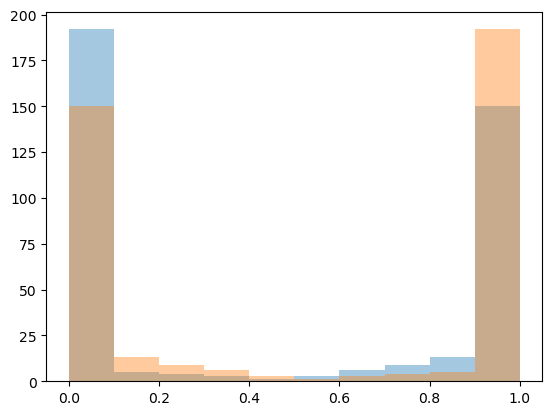

In [31]:
plt.hist(ga, alpha = 0.4)
plt.hist(gb, alpha = 0.4)

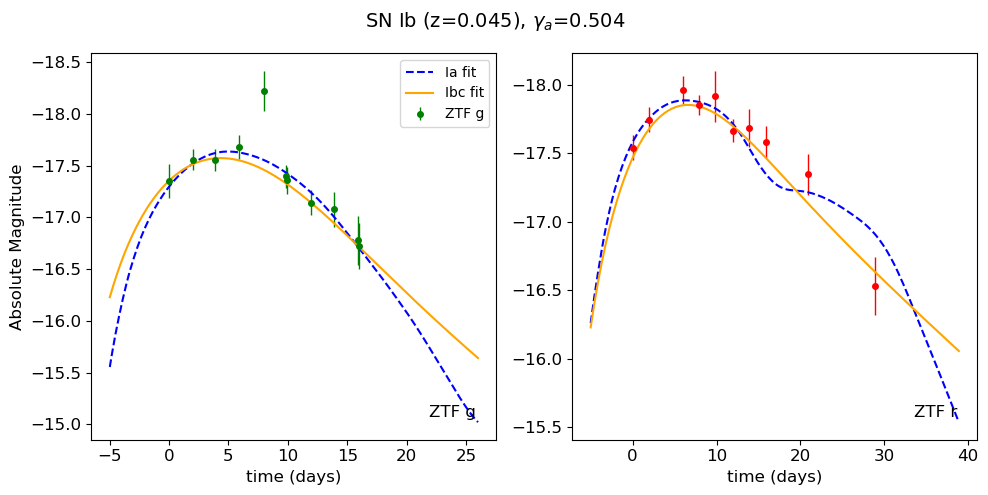

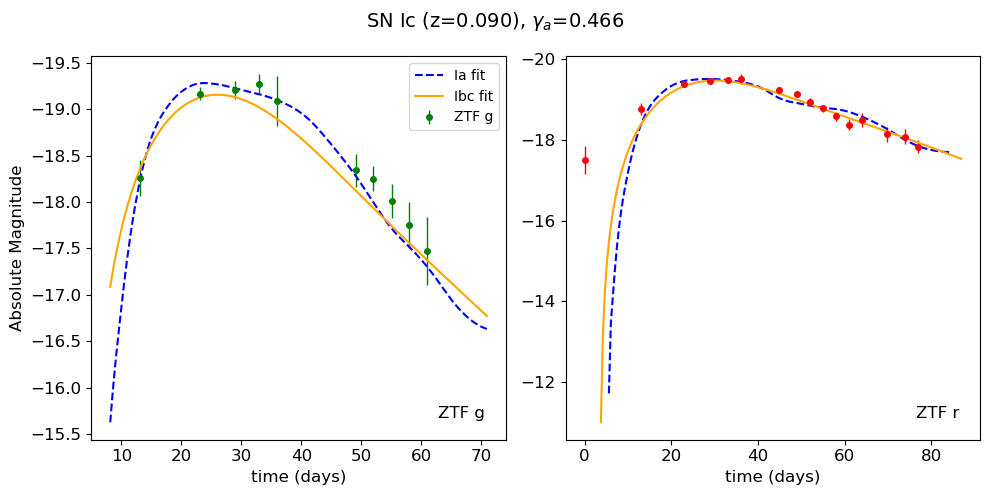

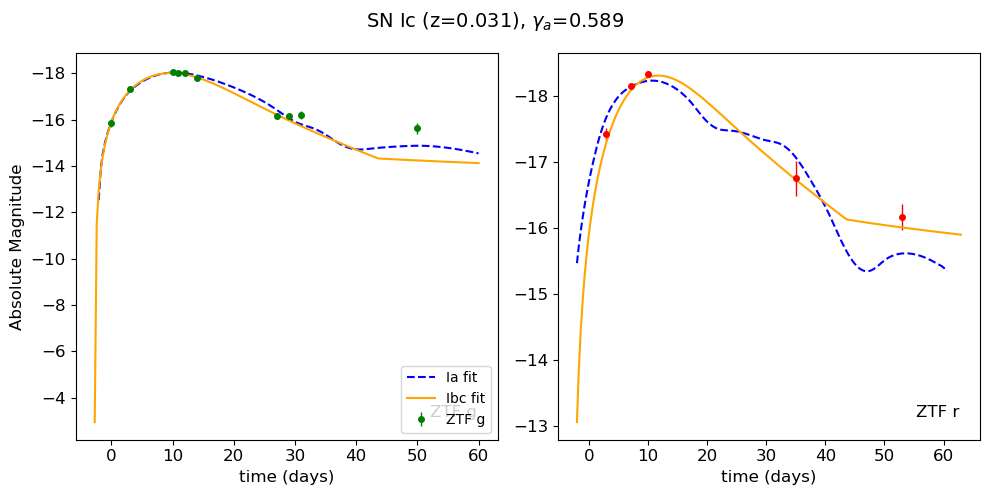

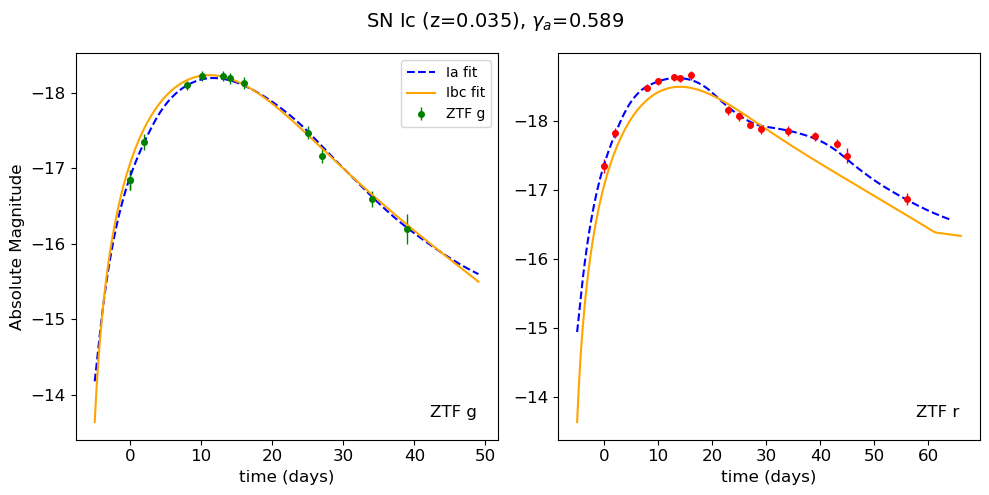

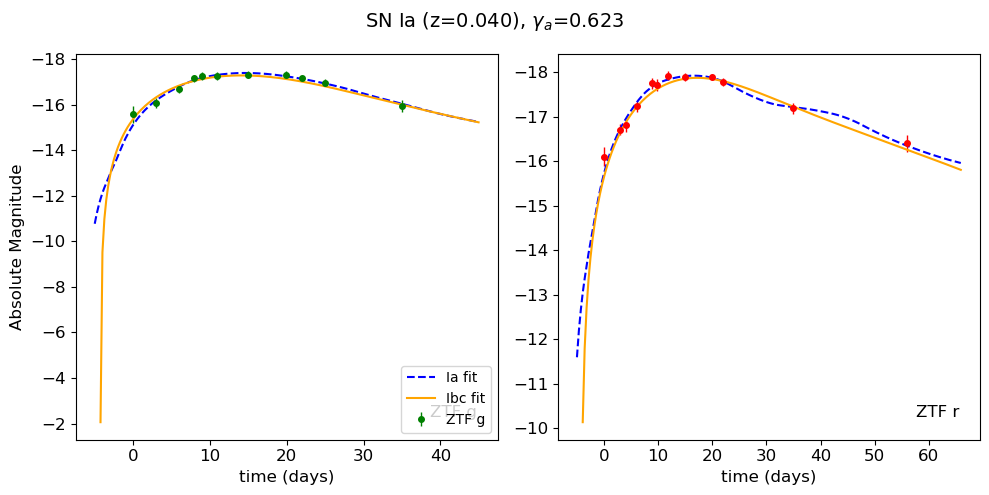

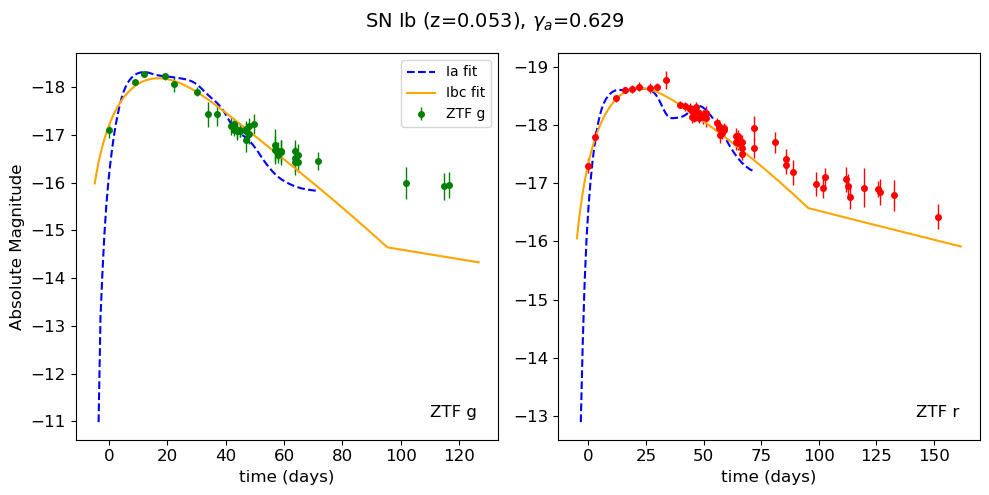

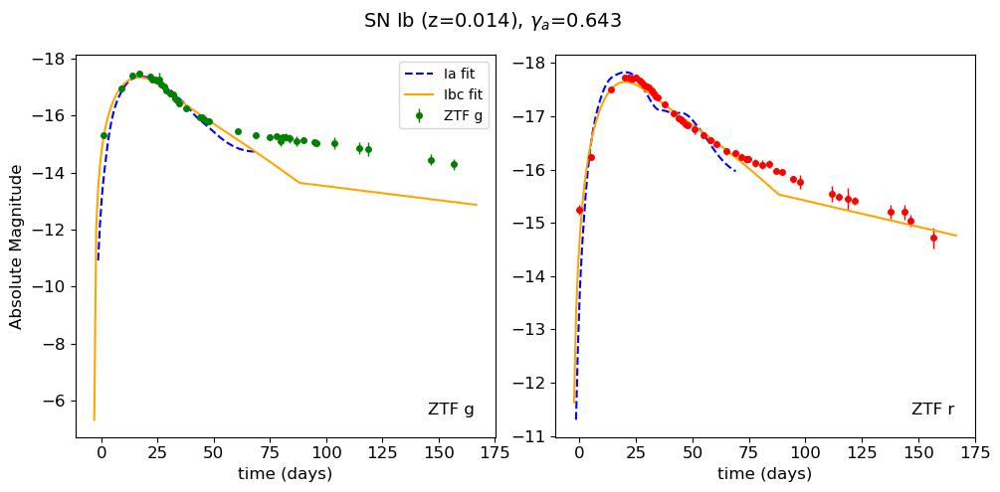

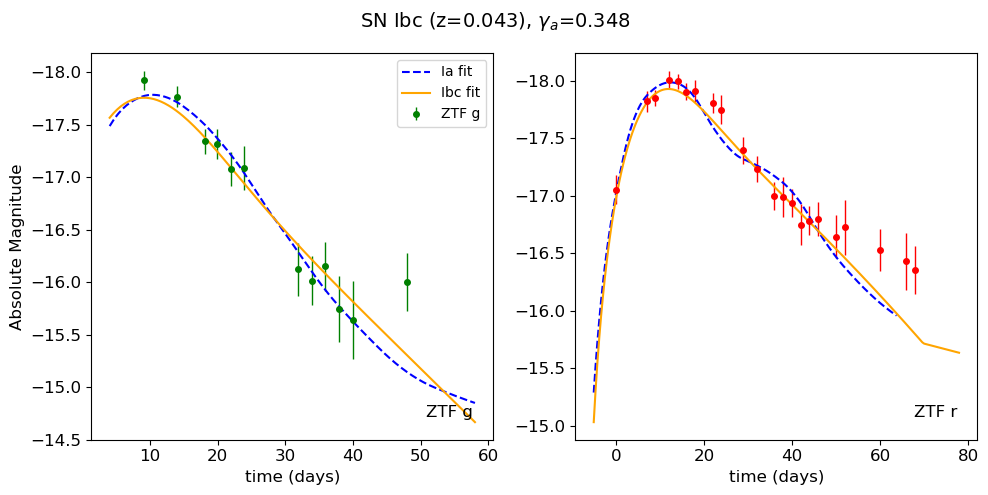

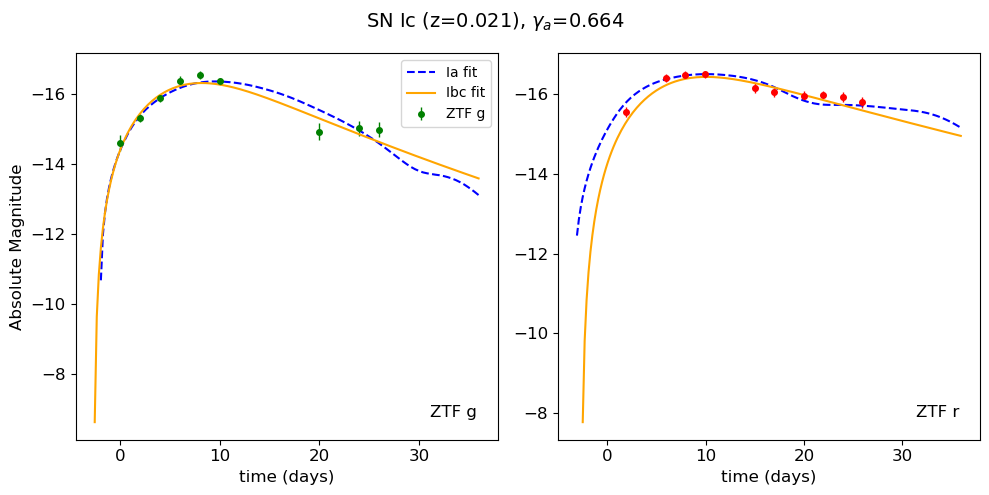

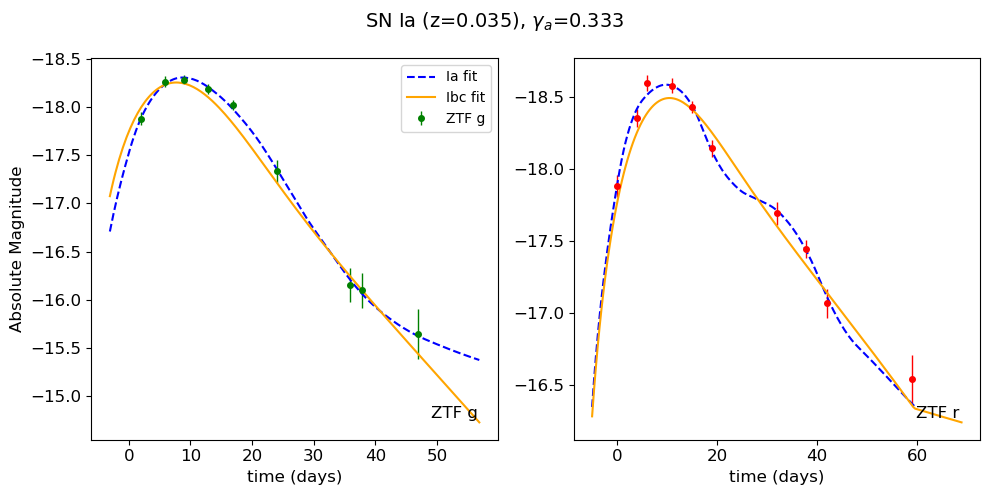

In [32]:
from astropy.cosmology import Planck18 as cosmo

# --- Plot light curves in absolute magnitude ---
for plot_idx, sn_idx in enumerate(ambiguous_idx):
    sn = sn_sample[sn_idx]
    try:
        ia_model = reconstruct_ia_model(sn)
        ibc_model = reconstruct_ibc_model(sn)
        
        # Distance modulus from redshift
        dist_mod = cosmo.distmod(sn.true_redshift).value
        
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        band_info = [('ztfg', 'green', 'ZTF g'), ('ztfr', 'red', 'ZTF r')]
        
        for ax, (band, color, label) in zip(axes, band_info):
            mask = np.array(sn.lc['band']) == band
            if not np.any(mask):
                continue
            t_data = np.array(sn.lc['time'][mask])
            f_data = np.array(sn.lc['flux'][mask])
            fe_data = np.array(sn.lc['fluxerr'][mask])
            
            # Convert flux to apparent mag, then absolute mag
            good = f_data > 0
            app_mag = -2.5 * np.log10(f_data[good]) + 25.0  # zp=25
            app_mag_err = 2.5 / np.log(10) * fe_data[good] / f_data[good]
            abs_mag = app_mag - dist_mod
            
            ax.errorbar(t_data[good], abs_mag, yerr=app_mag_err, fmt='o',
                        color=color, markersize=4, elinewidth=1, label=label)
            
            # Model curves
            t_model = np.linspace(t_data.min() - 5, t_data.max() + 10, 200)
            for model, mcolor, mlabel, ls in [
                (ia_model, 'blue', 'Ia fit', '--'),
                (ibc_model, 'orange', 'Ibc fit', '-')
            ]:
                f_model = model.bandflux(band, t_model, zp=25, zpsys='ab')
                good_model = f_model > 0
                m_model = -2.5 * np.log10(f_model[good_model]) + 25.0 - dist_mod
                ax.plot(t_model[good_model], m_model, color=mcolor,
                        linestyle=ls, label=mlabel if band == 'ztfg' else None)
            
            ax.invert_yaxis()
            ax.set_xlabel("time (days)", fontsize=12)
            ax.text(0.95, 0.05, label, fontsize=12, ha='right', va='bottom',
                    transform=ax.transAxes)
            ax.tick_params(axis='both', labelsize=12)
        
        axes[0].set_ylabel("Absolute Magnitude", fontsize=12)
        axes[0].legend(fontsize=10)
        fig.suptitle(f"{sn.true_class} (z={sn.true_redshift:.3f}), "
                     f"$\\gamma_a$={ga[sn_idx]:.3f}", fontsize=14)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Failed to plot SN {sn_idx}: {e}")


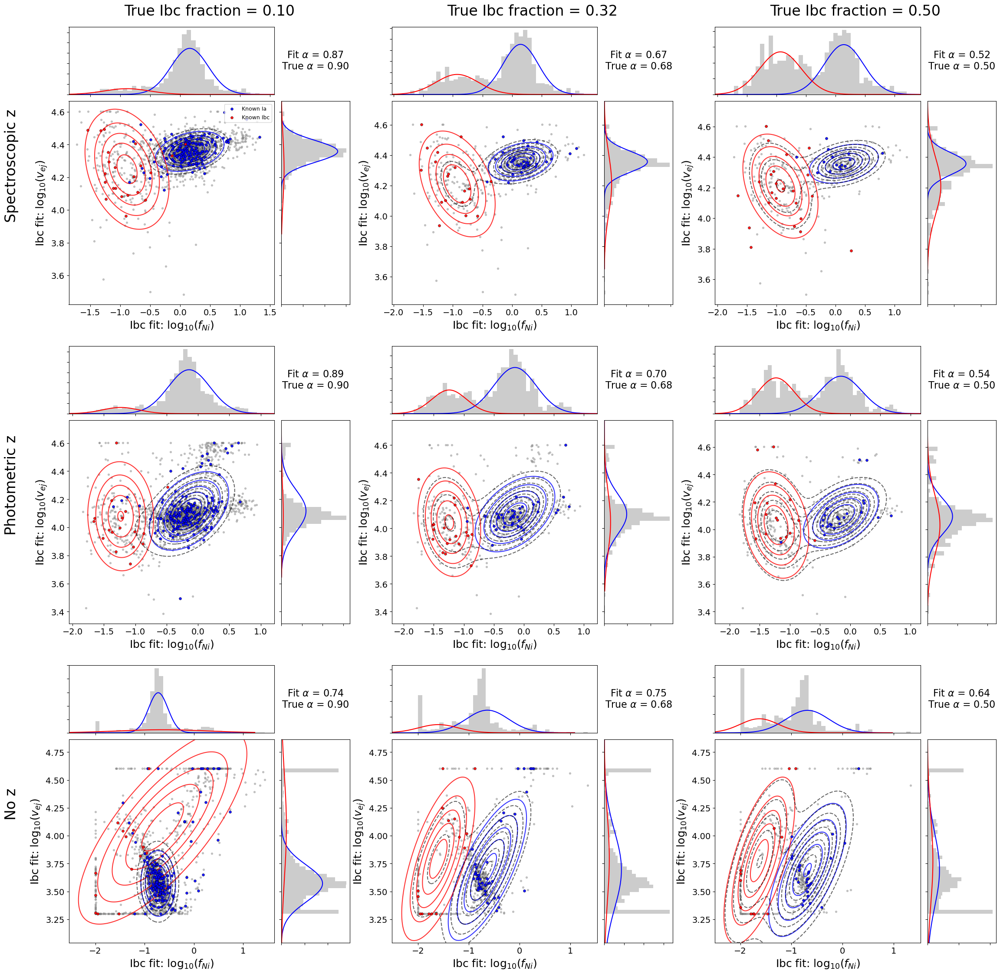

In [64]:
def _plot_2d_gmm_known_panel(res, parent_fig, parent_subspec, params_to_plot=None,
                              show_legend=True, show_xlabel=True, show_ylabel=True,
                              title=None):
    """Draw one GMM corner plot into a sub-gridspec on parent_fig."""
    if params_to_plot is None:
        params_to_plot = params_to_use

    sn_sample = res['sn_sample']
    alpha = res['alpha']
    fp = res['fit_params']
    mus_a_i, mus_b_i, sigmas_a_i, sigmas_b_i = fp[:4]
    known_idx = res.get('known_idx', None)
    known_is_ia = res.get('known_is_ia', None)

    p0, p1 = params_to_plot[0], params_to_plot[1]
    x_samples = get_param_samples(p0, sn_sample)
    y_samples = get_param_samples(p1, sn_sample)

    mu_a = np.array([mus_a_i[p0], mus_a_i[p1]])
    mu_b = np.array([mus_b_i[p0], mus_b_i[p1]])

    if len(fp) >= 6:
        cov_a = fp[4]
        cov_b = fp[5]
    else:
        cov_a = np.diag([sigmas_a_i[p0]**2, sigmas_a_i[p1]**2])
        cov_b = np.diag([sigmas_b_i[p0]**2, sigmas_b_i[p1]**2])

    # Majority -> "a" (blue, Ia)
    if alpha < 0.5:
        alpha = 1.0 - alpha
        mu_a, mu_b = mu_b, mu_a
        cov_a, cov_b = cov_b, cov_a
        sigmas_a_i, sigmas_b_i = sigmas_b_i, sigmas_a_i

    # Nested 2x2 corner grid inside the parent_subspec
    inner = parent_subspec.subgridspec(2, 2, width_ratios=[3, 1],
                                       height_ratios=[1, 3], hspace=0.05, wspace=0.05)
    ax_main = parent_fig.add_subplot(inner[1, 0])
    ax_xhist = parent_fig.add_subplot(inner[0, 0], sharex=ax_main)
    ax_yhist = parent_fig.add_subplot(inner[1, 1], sharey=ax_main)
    ax_text = parent_fig.add_subplot(inner[0, 1])
    ax_text.axis('off')

    # Scatter (known points colored by true class)
    if known_idx is not None and known_is_ia is not None:
        known_set = set(known_idx)
        unknown_mask = np.array([i not in known_set for i in range(len(x_samples))])
        known_ia_mask = np.array([i in known_set and known_is_ia.get(i, False) for i in range(len(x_samples))])
        known_ibc_mask = np.array([i in known_set and not known_is_ia.get(i, True) for i in range(len(x_samples))])

        ax_main.scatter(x_samples[unknown_mask], y_samples[unknown_mask],
                       s=8, alpha=0.4, color='gray', zorder=1)
        ax_main.scatter(x_samples[known_ia_mask], y_samples[known_ia_mask],
                       s=18, alpha=0.9, color='blue', zorder=4, edgecolors='black',
                       linewidths=0.4, label='Known Ia')
        ax_main.scatter(x_samples[known_ibc_mask], y_samples[known_ibc_mask],
                       s=18, alpha=0.9, color='red', zorder=4, edgecolors='black',
                       linewidths=0.4, label='Known Ibc')
        if show_legend:
            ax_main.legend(fontsize=9, loc='upper right')
    else:
        ax_main.scatter(x_samples, y_samples, s=8, alpha=0.4, color='gray', zorder=1)

    # Contours
    x_lo, x_hi = np.percentile(x_samples, [1, 99])
    y_lo, y_hi = np.percentile(y_samples, [1, 99])
    x_margin = (x_hi - x_lo) * 0.2
    y_margin = (y_hi - y_lo) * 0.2
    x_range = np.linspace(x_lo - x_margin, x_hi + x_margin, 200)
    y_range = np.linspace(y_lo - y_margin, y_hi + y_margin, 200)
    X, Y = np.meshgrid(x_range, y_range)
    pos = np.dstack((X, Y))

    Z_a = multivariate_normal(mu_a, cov_a).pdf(pos)
    Z_b = multivariate_normal(mu_b, cov_b).pdf(pos)
    Z_total = alpha * Z_a + (1 - alpha) * Z_b

    ax_main.contour(X, Y, Z_a, levels=5, colors='blue', alpha=0.8, zorder=2)
    ax_main.contour(X, Y, Z_b, levels=5, colors='red', alpha=0.8, zorder=2)
    ax_main.contour(X, Y, Z_total, levels=10, colors='black', alpha=0.6,
                    linestyles='--', zorder=3)

    if show_xlabel:
        ax_main.set_xlabel(param_labels[p0], fontsize=18)
    if show_ylabel:
        ax_main.set_ylabel(param_labels[p1], fontsize=18)
    ax_main.tick_params(labelsize=14)

    # X marginal
    ax_xhist.hist(x_samples, bins=40, density=True, alpha=0.4, color='gray')
    x_plot = np.linspace(x_range[0], x_range[-1], 300)
    ax_xhist.plot(x_plot, alpha * norm.pdf(x_plot, mu_a[0], sigmas_a_i[p0]),
                  color='blue', linewidth=1.5)
    ax_xhist.plot(x_plot, (1 - alpha) * norm.pdf(x_plot, mu_b[0], sigmas_b_i[p0]),
                  color='red', linewidth=1.5)
    ax_xhist.tick_params(labelbottom=False, labelleft=False, labelsize=8)

    # Y marginal
    ax_yhist.hist(y_samples, bins=40, density=True, alpha=0.4, color='gray', orientation='horizontal')
    y_plot = np.linspace(y_range[0], y_range[-1], 300)
    ax_yhist.plot(alpha * norm.pdf(y_plot, mu_a[1], sigmas_a_i[p1]), y_plot,
                  color='blue', linewidth=1.5)
    ax_yhist.plot((1 - alpha) * norm.pdf(y_plot, mu_b[1], sigmas_b_i[p1]), y_plot,
                  color='red', linewidth=1.5)
    ax_yhist.tick_params(labelleft=False, labelbottom=False, labelsize=8)

    # Top-right text + optional title
    txt = f"Fit $\\alpha$ = {alpha:.2f}\nTrue $\\alpha$ = {1 - res['ibc_frac']:.2f}"
    if title is not None:
        txt = f"{title}\n{txt}"
    ax_text.text(0.5, 0.5, txt, fontsize=16, ha='center', va='center',
                 transform=ax_text.transAxes)

# Pick which mixing ratios to show. ratios = np.linspace(0.1, 0.5, 10)
# index 0 -> 0.1, index 5 -> ~0.322, index 9 -> 0.5
ratio_indices = [0, 5, 9]
dataset_keys = ['spec', 'phot', 'none']

fig = plt.figure(figsize=(24, 24))
# Leave room on the left and top for row/column labels
outer = gridspec.GridSpec(3, 3, hspace=0.15, wspace=0.15,
                          left=0.08, right=0.97, top=0.93, bottom=0.05)

# --- Column headers (true mixing fraction) ---
for col, ri in enumerate(ratio_indices):
    bbox = outer[0, col].get_position(fig)
    x_center = 0.5 * (bbox.x0 + bbox.x1)
    fig.text(x_center, 0.945, f"True Ibc fraction = {ratios[ri]:.2f}",
             fontsize=24, ha='center', va='center')

# --- Row labels (redshift type) ---
for row, key in enumerate(dataset_keys):
    bbox = outer[row, 0].get_position(fig)
    y_center = 0.5 * (bbox.y0 + bbox.y1)
    fig.text(0.025, y_center, datasets[key]['label'],
             fontsize=24, ha='center', va='center', rotation=90)

# --- Corner plots ---
for row, key in enumerate(dataset_keys):
    iter_results = results_fixed[key]['best_iteration_results']
    for col, ri in enumerate(ratio_indices):
        # Compact per-cell title with fit/true Ia frac (no row/col info needed now)
        _plot_2d_gmm_known_panel(
            iter_results[ri], fig, outer[row, col],
            show_legend=(row == 0 and col == 0),
            show_xlabel=True,
            show_ylabel=True,
            title=None,  # row/col labels handle the meta-info
        )

plt.savefig("figures/grid_3x3_gmm_known.pdf", bbox_inches='tight')
plt.show()


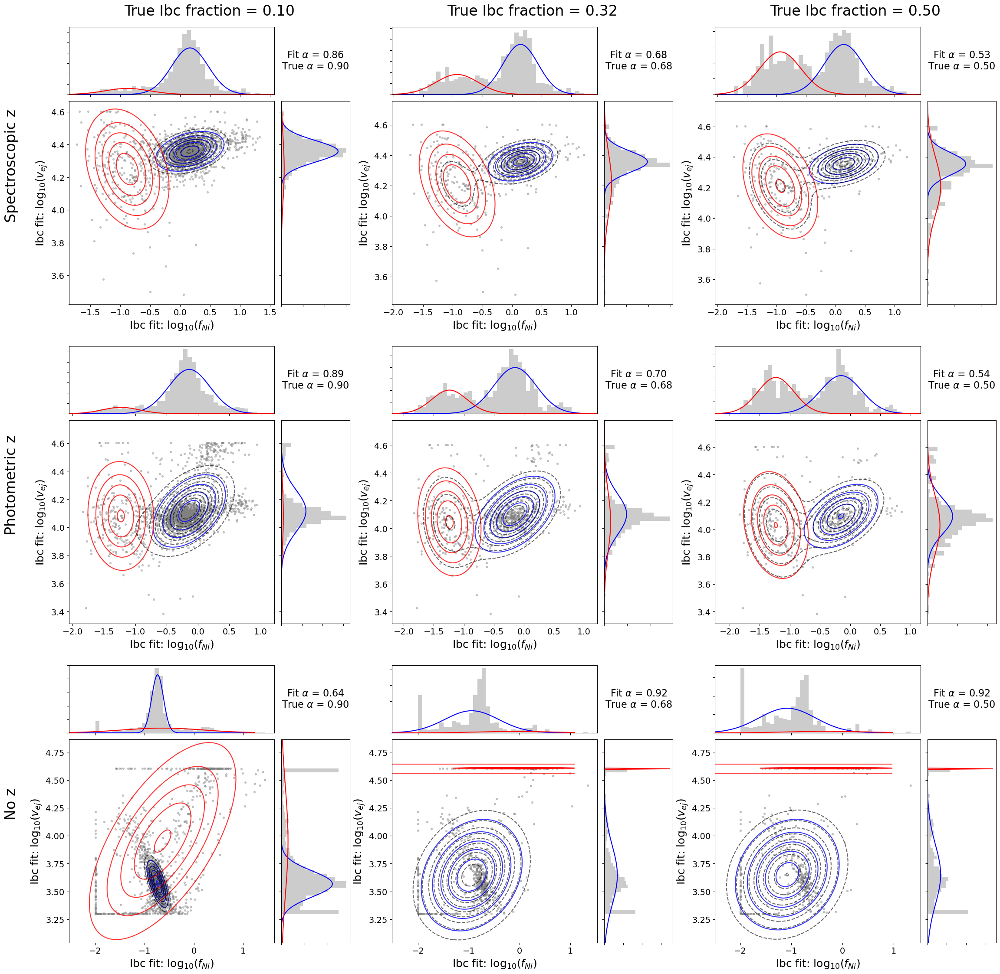

In [65]:
# Pick which mixing ratios to show.
ratio_indices = [0, 5, 9]
dataset_keys = ['spec', 'phot', 'none']

fig = plt.figure(figsize=(24, 24))
outer = gridspec.GridSpec(3, 3, hspace=0.15, wspace=0.15,
                          left=0.08, right=0.97, top=0.93, bottom=0.05)

# --- Column headers (true mixing fraction) ---
for col, ri in enumerate(ratio_indices):
    bbox = outer[0, col].get_position(fig)
    x_center = 0.5 * (bbox.x0 + bbox.x1)
    fig.text(x_center, 0.945, f"True Ibc fraction = {ratios[ri]:.2f}",
             fontsize=24, ha='center', va='center')

# --- Row labels (redshift type) ---
for row, key in enumerate(dataset_keys):
    bbox = outer[row, 0].get_position(fig)
    y_center = 0.5 * (bbox.y0 + bbox.y1)
    fig.text(0.025, y_center, datasets[key]['label'],
             fontsize=24, ha='center', va='center', rotation=90)

# --- Corner plots (unsupervised: use `results`, not `results_fixed`) ---
for row, key in enumerate(dataset_keys):
    iter_results = results[key]['best_iteration_results']
    for col, ri in enumerate(ratio_indices):
        _plot_2d_gmm_known_panel(
            iter_results[ri], fig, outer[row, col],
            show_legend=False,        # no known points to label
            show_xlabel=True,
            show_ylabel=True,
            title=None,
        )

plt.savefig("figures/grid_3x3_gmm_unsupervised.pdf", bbox_inches='tight')
plt.show()
